In [422]:
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

In [423]:
import os
print(os.getcwd())

C:\Users\Cheng\OneDrive\Documents\Proj\VarianceArithemtic\IPyNb


In [424]:
df = pd.read_csv("../Python/Output/FFT_4_6_Spec.txt", sep='\t')
df.head()

,SinSource,NoiseType,Noise,Signal,Order,Freq,Index,Imag,Wave,Spec,Forward Error,Forward Uncertainty,Reverse Error,Reverse Uncertainty,Roundtrip Error,Roundtrip Uncertainty
0,IndexSin,Gaussian,0.0,Sin,4,1,0,0,0.000000,0.0,0.0,1.922963e-16,0.000000e+00,0.000000e+00,0.000000e+00,5.052059e-17
1,IndexSin,Gaussian,0.0,Sin,4,1,0,1,0.000000,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.565128e-17
2,IndexSin,Gaussian,0.0,Sin,4,1,1,0,0.382683,0.0,0.0,2.698781e-16,0.000000e+00,6.300448e-17,0.000000e+00,8.267034e-17
3,IndexSin,Gaussian,0.0,Sin,4,1,1,1,0.000000,8.0,0.0,3.347463e-16,-2.775558e-17,3.526577e-17,-2.775558e-17,6.346848e-17
4,IndexSin,Gaussian,0.0,Sin,4,1,2,0,0.707107,0.0,0.0,1.013490e-16,0.000000e+00,1.013490e-16,0.000000e+00,1.155557e-16


In [425]:
for test in ('Forward', 'Reverse', 'Roundtrip'):
    df[f'{test} Normalized Error'] = df[f'{test} Error'] / df[f'{test} Uncertainty']
df.head()

,SinSource,NoiseType,Noise,Signal,Order,Freq,Index,Imag,Wave,Spec,Forward Error,Forward Uncertainty,Reverse Error,Reverse Uncertainty,Roundtrip Error,Roundtrip Uncertainty,Forward Normalized Error,Reverse Normalized Error,Roundtrip Normalized Error
0,IndexSin,Gaussian,0.0,Sin,4,1,0,0,0.000000,0.0,0.0,1.922963e-16,0.000000e+00,0.000000e+00,0.000000e+00,5.052059e-17,0.0,NaN,0.000000
1,IndexSin,Gaussian,0.0,Sin,4,1,0,1,0.000000,0.0,0.0,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,5.565128e-17,NaN,NaN,0.000000
2,IndexSin,Gaussian,0.0,Sin,4,1,1,0,0.382683,0.0,0.0,2.698781e-16,0.000000e+00,6.300448e-17,0.000000e+00,8.267034e-17,0.0,0.00000,0.000000
3,IndexSin,Gaussian,0.0,Sin,4,1,1,1,0.000000,8.0,0.0,3.347463e-16,-2.775558e-17,3.526577e-17,-2.775558e-17,6.346848e-17,0.0,-0.78704,-0.437313
4,IndexSin,Gaussian,0.0,Sin,4,1,2,0,0.707107,0.0,0.0,1.013490e-16,0.000000e+00,1.013490e-16,0.000000e+00,1.155557e-16,0.0,0.00000,0.000000


In [426]:
def FilterNormalizedErrorStat(sinSource='IndexSin', noiseType='Gaussian', noise=0, 
                                 signal='Sin', order=4, freq=1, test='Forward', imag=0):
    return df[(df['SinSource']==sinSource) & (df['NoiseType']==noiseType) & (df['Noise']==noise) & 
              (df['Signal']==signal) & (df['Order']==order) & (df['Freq']==freq) & (df['Imag']==imag)]\
           [[f'{test} Error', f'{test} Uncertainty', f'{test} Normalized Error']]

In [427]:
FilterNormalizedErrorStat(imag=0).head()

,Forward Error,Forward Uncertainty,Forward Normalized Error
0,0.0,1.922963e-16,0.0
2,0.0,2.698781e-16,0.0
4,0.0,1.013490e-16,0.0
6,0.0,2.313808e-16,0.0
8,0.0,1.281975e-16,0.0


In [428]:
def PrintNormalizedErrorStat(noiseType='Gaussian', noise=0, signal='Sin', order=4, freq=1):
    with pd.option_context('mode.use_inf_as_na', True):
        for test in ('Forward', 'Reverse', 'Roundtrip'):
            for sinSource in ('IndexSin', 'LibSin'):
                for imag in (1,0):
                    dfStat = FilterNormalizedErrorStat(sinSource, noiseType, noise, 
                                 signal, order, freq, test, imag)[f'{test} Normalized Error'].dropna()
                    print(f'{test}, {sinSource}, {imag} mean={dfStat.mean()}, std={dfStat.std()}')

In [429]:
def PlotSpectra( sinSource, order, signal, freq, test, noiseType='Gaussian', noise=0,
                  sColor = ['r','g','b','y','c','m'] ):
    
    fig, ax = plt.subplots()
    ax.set_title(f'{signal}({freq}/2^{order}) {test} using {sinSource} with {noise} noise')
    ax.set_xlabel('x')
    ax.set_ylabel('Uncertainty or Value Error')
    #ax.set_yscale('log')
    #ax.set_ylim(ylim)
    plt.grid(True)
    
    dfPlot = df[(df['SinSource']==sinSource) & (df['NoiseType']==noiseType) & (df['Noise']==noise) &
                (df['Order']==order) & (df['Signal']==signal) & (df['Freq']==freq)]\
                .sort_values('Index')
    dfReal = dfPlot[dfPlot['Imag'] == 0]
    dfImag = dfPlot[dfPlot['Imag'] == 1]
    ax.plot(dfReal['Index'], dfReal[f'{test} Uncertainty'], 'g-', label=f'Uncertainty Real')
    ax.plot(dfImag['Index'], dfImag[f'{test} Uncertainty'], 'b--', label=f'Uncertainty Imag')
    ax.plot(dfReal['Index'], np.abs(dfReal[f'{test} Error']), 'y-x', label=f'Value Error Real')
    ax.plot(dfImag['Index'], np.abs(dfImag[f'{test} Error']), 'm--+', label=f'Value Error Imag')
    
    ax.legend(bbox_to_anchor=(1.0, 1.0))


# Sin

In [430]:
PrintNormalizedErrorStat(signal='Sin', order=4, freq=1)

Forward, IndexSin, 1 mean=0.0, std=1.1108050644671628
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=-6.344131569286608e-17, std=2.608819637877882
Forward, LibSin, 0 mean=0.06852871972133306, std=2.5113392485263977
Reverse, IndexSin, 1 mean=0.0, std=0.47460303481450294
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-0.07644547567326387, std=1869268096786929.5
Reverse, LibSin, 0 mean=0.19035093365875463, std=2.6016913016713112
Roundtrip, IndexSin, 1 mean=0.0, std=0.22582732401361805
Roundtrip, IndexSin, 0 mean=0.0, std=0.29007476007642397
Roundtrip, LibSin, 1 mean=-1.0408340855860843e-17, std=0.3632626675692021
Roundtrip, LibSin, 0 mean=-0.08485331167658577, std=0.34261356627798184


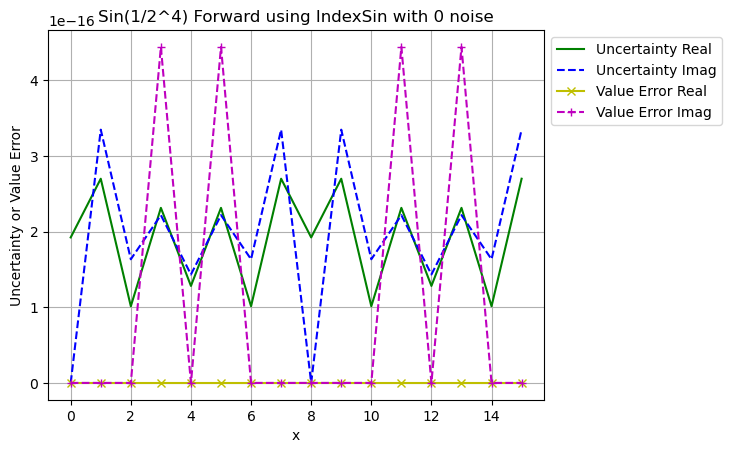

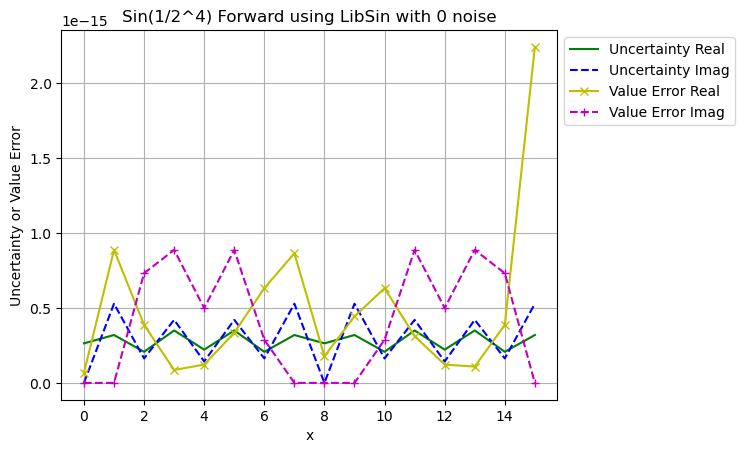

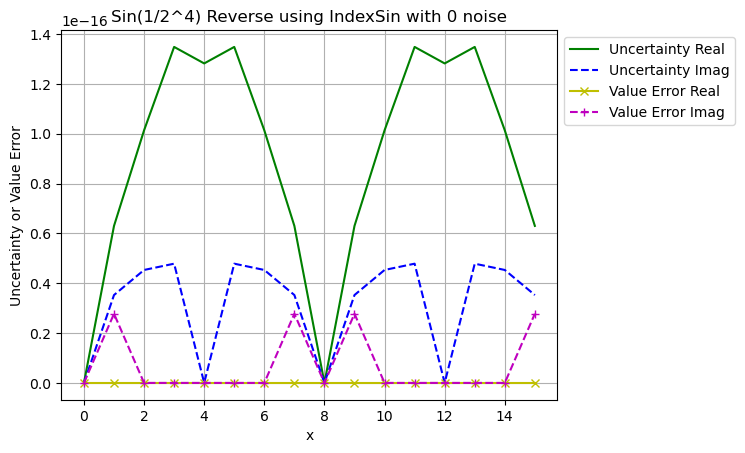

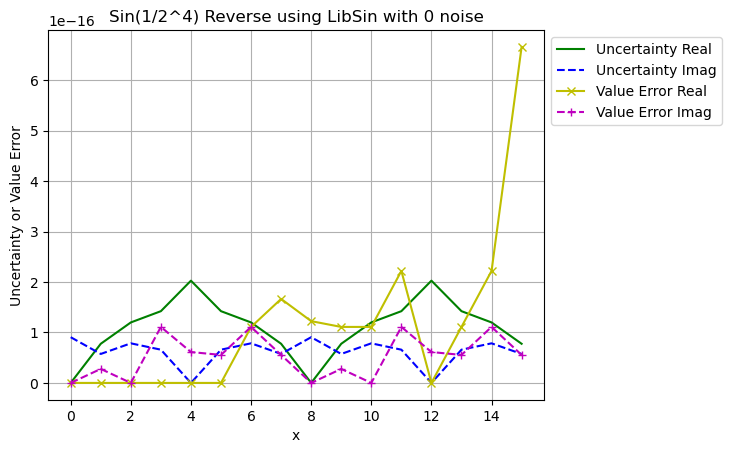

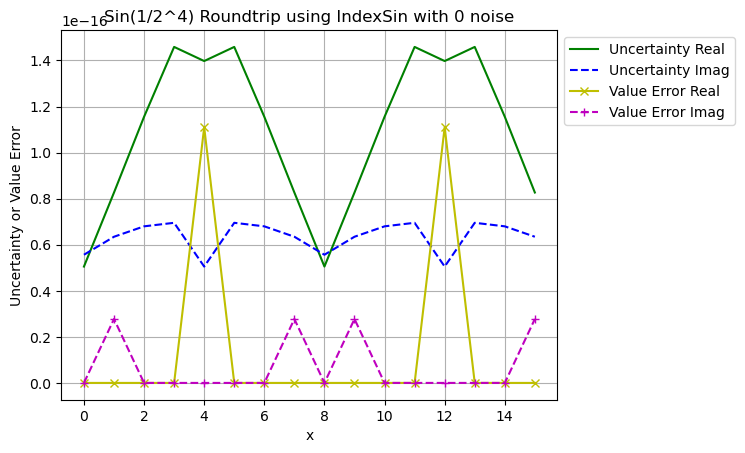

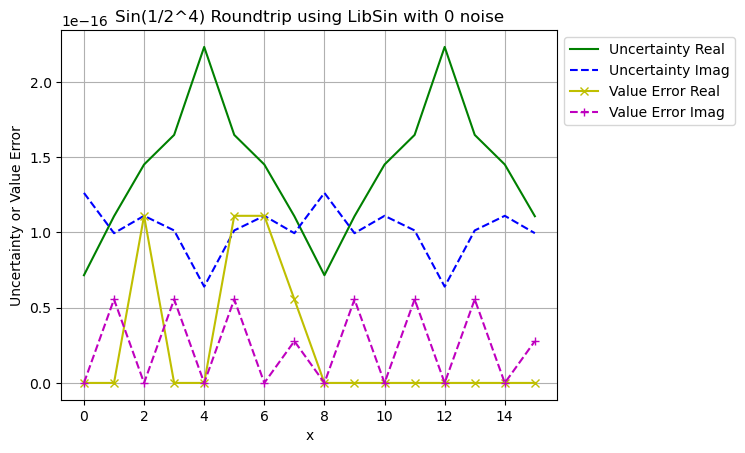

In [431]:
order = 4
freq = 1
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [432]:
PrintNormalizedErrorStat(signal='Sin', order=4, freq=2)

Forward, IndexSin, 1 mean=0.0, std=1.2152872405003998
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=6.344131569286608e-17, std=3.0593721660214377
Forward, LibSin, 0 mean=0.26775283016825385, std=3.692473162791764
Reverse, IndexSin, 1 mean=0.0, std=0.0
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=0.01674682452694519, std=2798494025928322.0
Reverse, LibSin, 0 mean=0.5, std=3.8257500750001485
Roundtrip, IndexSin, 1 mean=0.0, std=0.0
Roundtrip, IndexSin, 0 mean=0.0, std=0.42163702135578385
Roundtrip, LibSin, 1 mean=0.0, std=0.25555062599997586
Roundtrip, LibSin, 0 mean=-0.09284766908852582, std=0.598849471616342


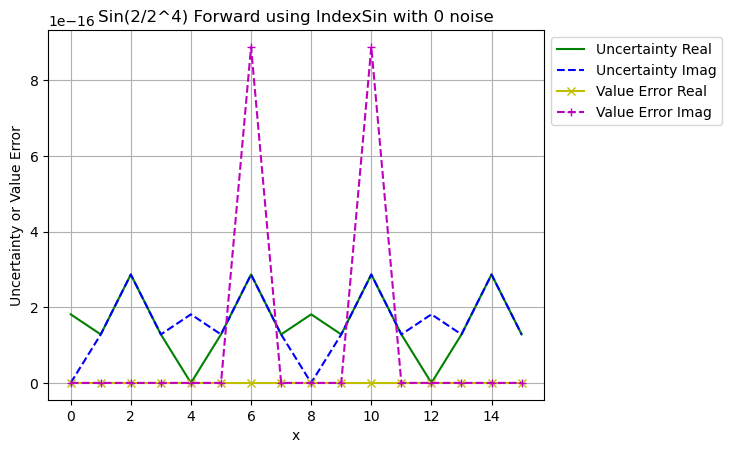

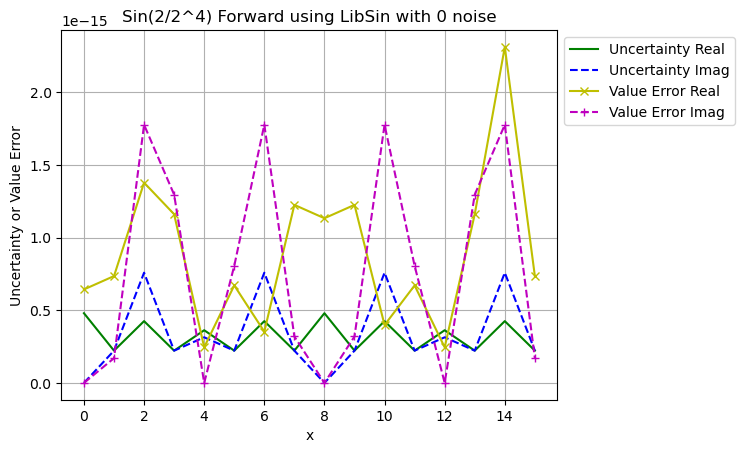

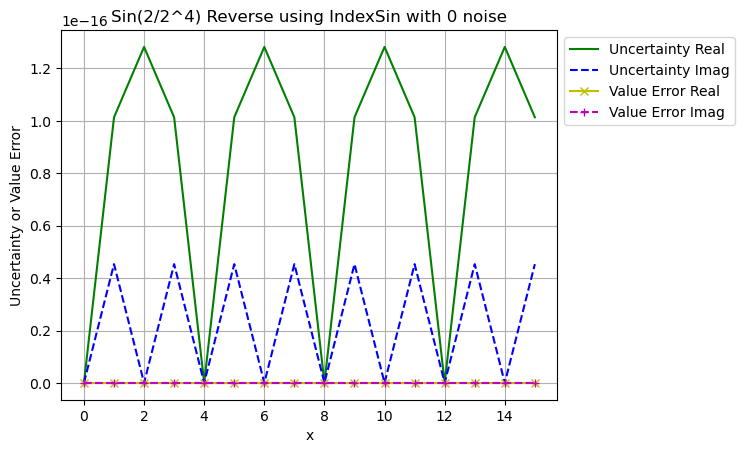

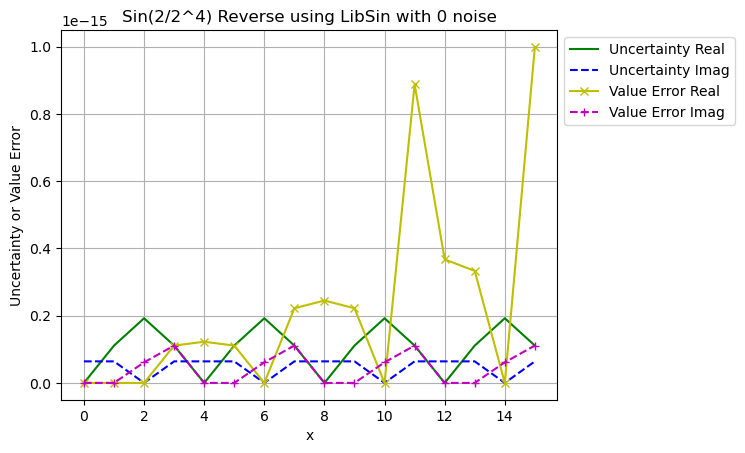

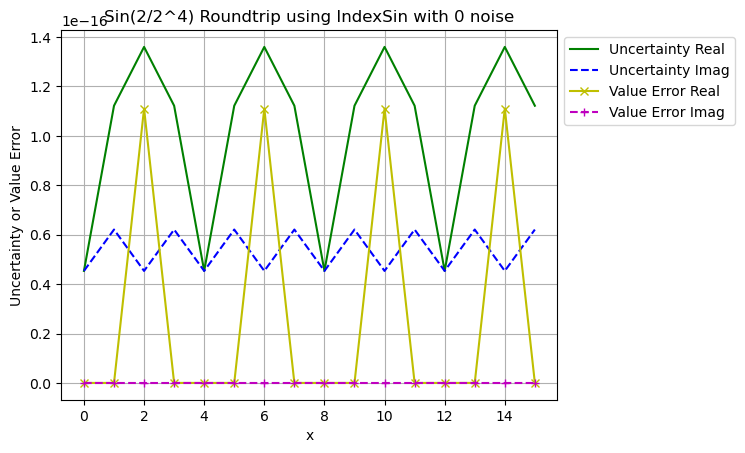

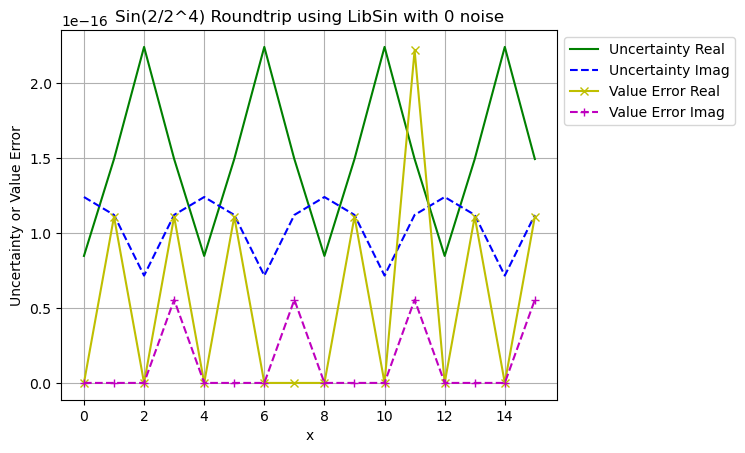

In [433]:
order = 4
freq = 2
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [434]:
PrintNormalizedErrorStat(signal='Sin', order=4, freq=3)

Forward, IndexSin, 1 mean=0.0, std=1.1108050644671628
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=0.016434799710715615, std=3.585259694409347
Forward, LibSin, 0 mean=0.44029132789242026, std=4.123960531858396
Reverse, IndexSin, 1 mean=0.0, std=0.47460303481450294
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-0.03197420713663118, std=1869268096786929.5
Reverse, LibSin, 0 mean=0.20920472930710593, std=5.4283006371769655
Roundtrip, IndexSin, 1 mean=0.0, std=0.22582732401361805
Roundtrip, IndexSin, 0 mean=0.0, std=0.29007476007642397
Roundtrip, LibSin, 1 mean=0.0, std=0.5770306894412741
Roundtrip, LibSin, 0 mean=0.09726815955697571, std=0.7874074829456146


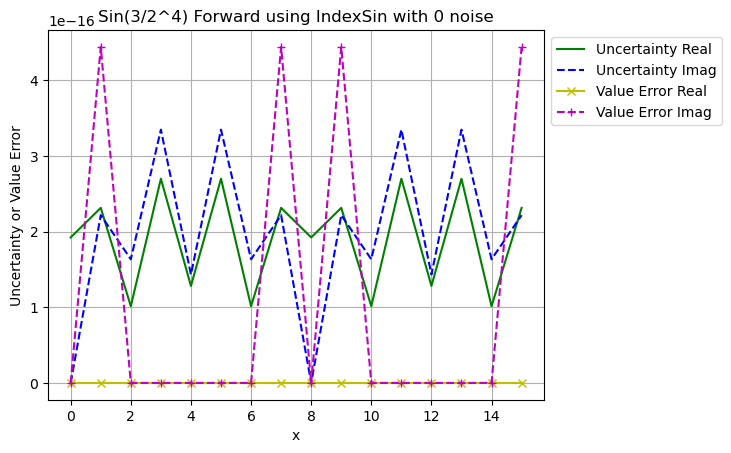

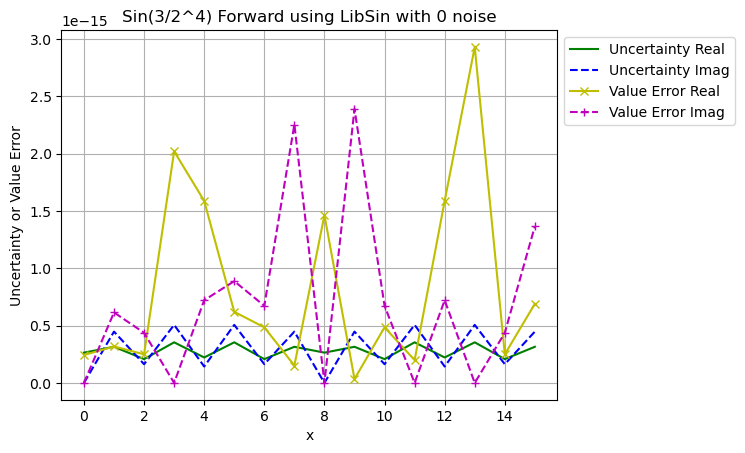

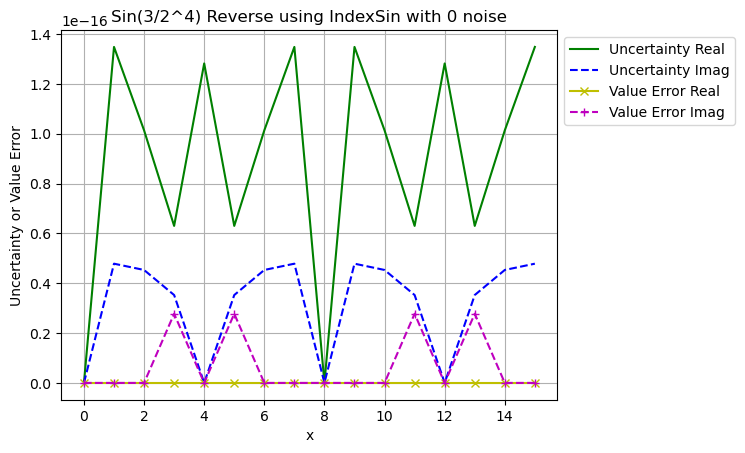

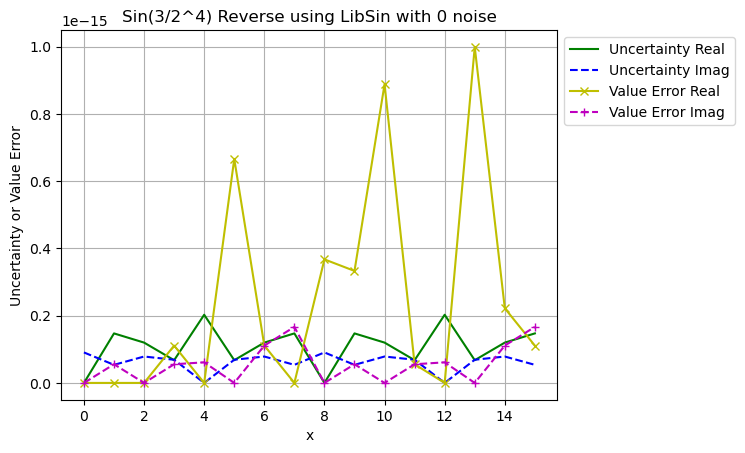

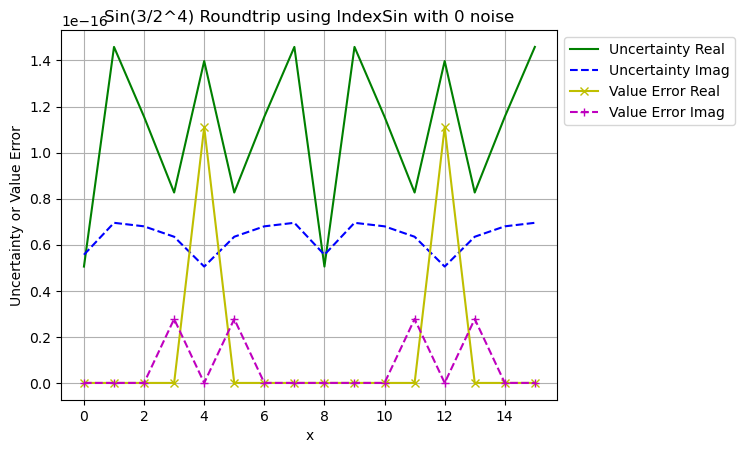

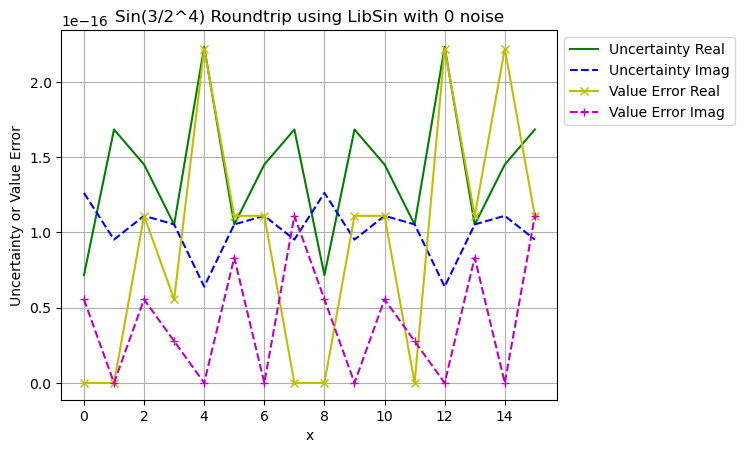

In [435]:
order = 4
freq = 3
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [436]:
PrintNormalizedErrorStat(signal='Sin', order=4, freq=4)

Forward, IndexSin, 1 mean=nan, std=nan
Forward, IndexSin, 0 mean=nan, std=nan
Forward, LibSin, 1 mean=-1.586032892321652e-17, std=2.7019433992161153
Forward, LibSin, 0 mean=-1219569191635725.2, std=3371136399377600.0
Reverse, IndexSin, 1 mean=nan, std=nan
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=0.0, std=6178153141464677.0
Reverse, LibSin, 0 mean=0.0, std=0.0
Roundtrip, IndexSin, 1 mean=nan, std=nan
Roundtrip, IndexSin, 0 mean=0.0, std=0.0
Roundtrip, LibSin, 1 mean=-1.5407439555097887e-33, std=1.4986250699785116e-16
Roundtrip, LibSin, 0 mean=1.5297074499493326e-16, std=4.861585366680313e-16


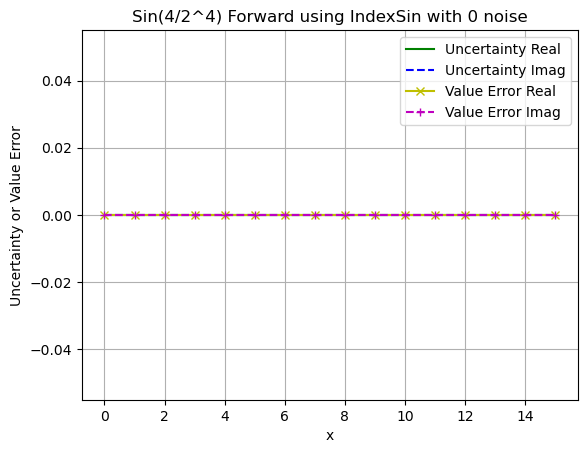

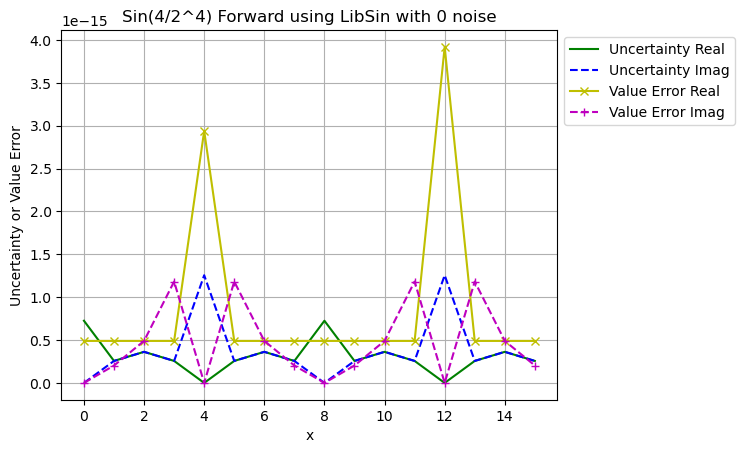

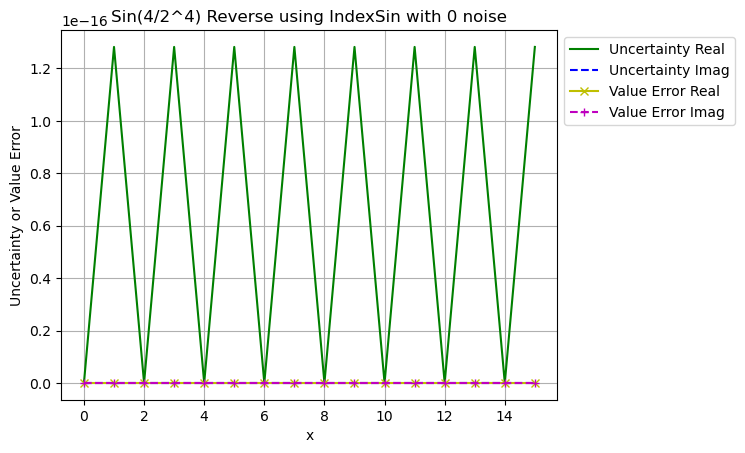

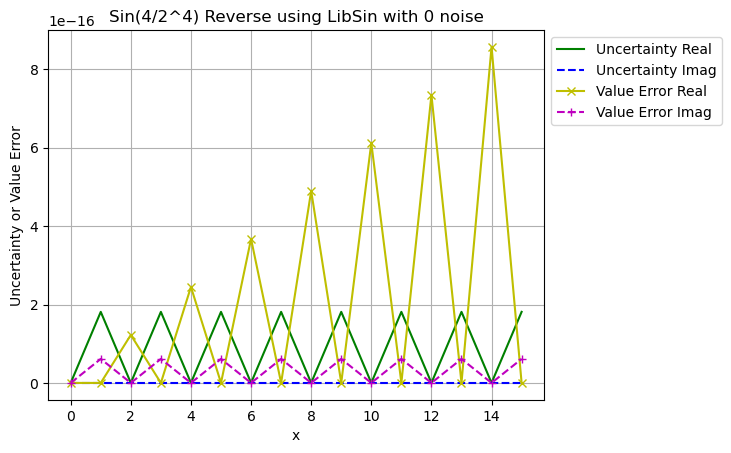

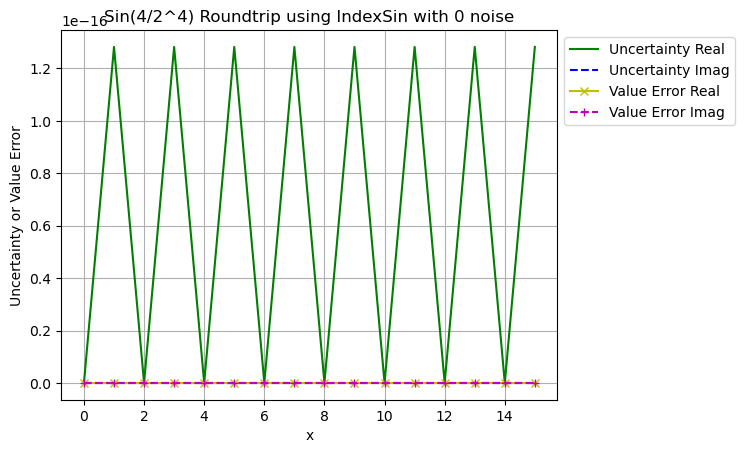

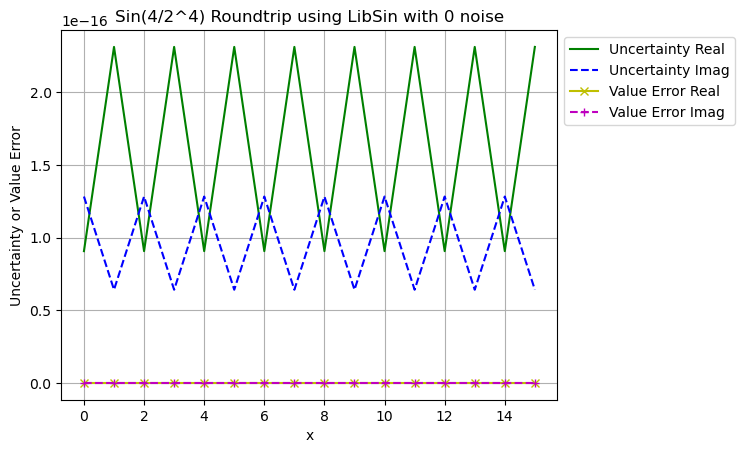

In [437]:
order = 4
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [438]:
PrintNormalizedErrorStat(signal='Sin', order=4, freq=5)

Forward, IndexSin, 1 mean=0.0, std=1.1108050644671628
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=1.1102230246251565e-16, std=6.095695214694907
Forward, LibSin, 0 mean=0.5685173308165308, std=9.612999439070764
Reverse, IndexSin, 1 mean=0.0, std=0.47460303481450294
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=0.019802488160005682, std=1869268096786929.5
Reverse, LibSin, 0 mean=3.0755760552847526, std=9.621351238292586
Roundtrip, IndexSin, 1 mean=0.0, std=0.22582732401361805
Roundtrip, IndexSin, 0 mean=0.0, std=0.29007476007642397
Roundtrip, LibSin, 1 mean=2.0816681711721685e-17, std=0.37746357356395926
Roundtrip, LibSin, 0 mean=0.12200866575443567, std=0.43111739451435654


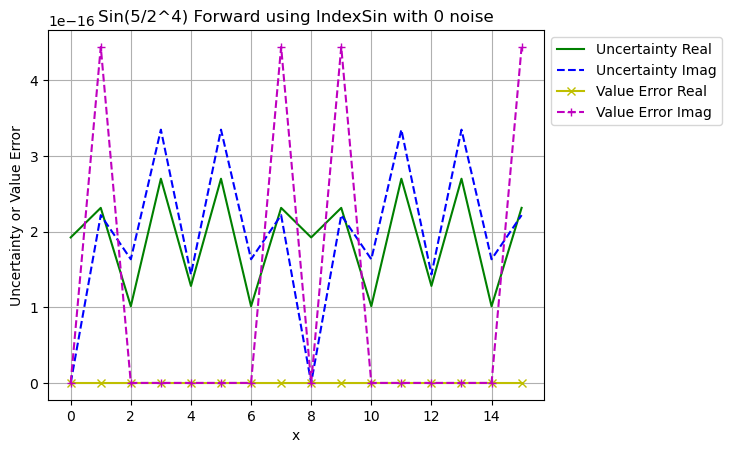

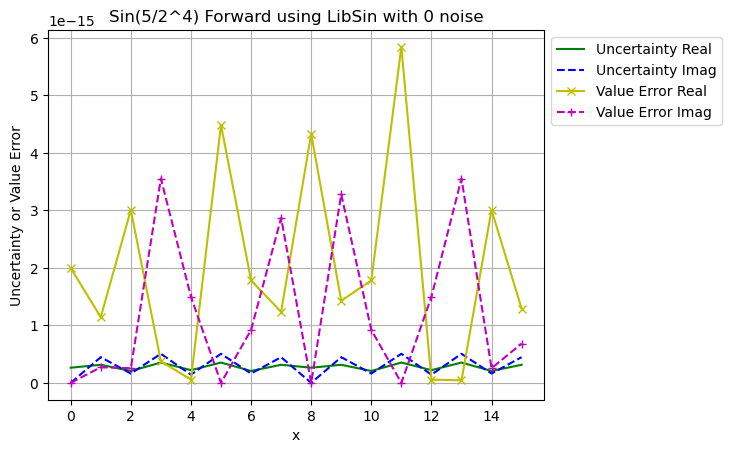

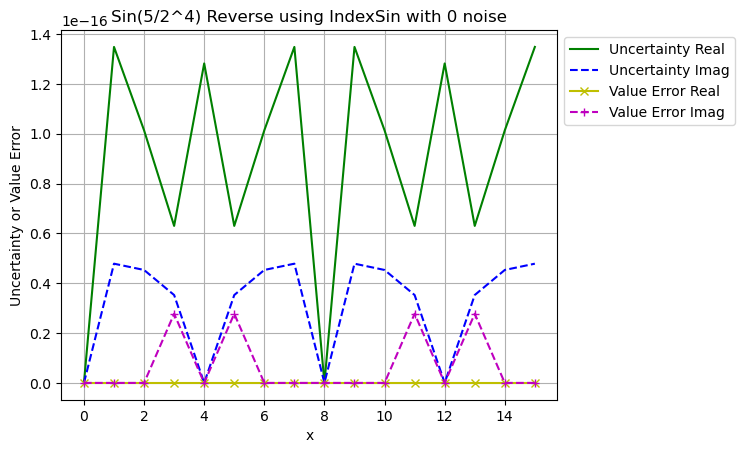

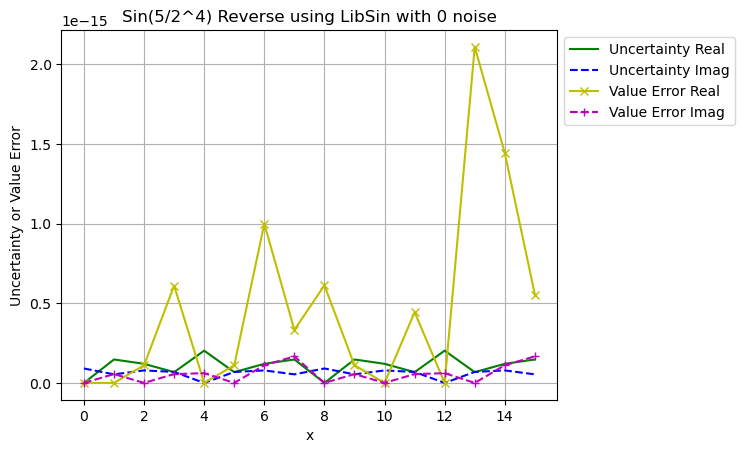

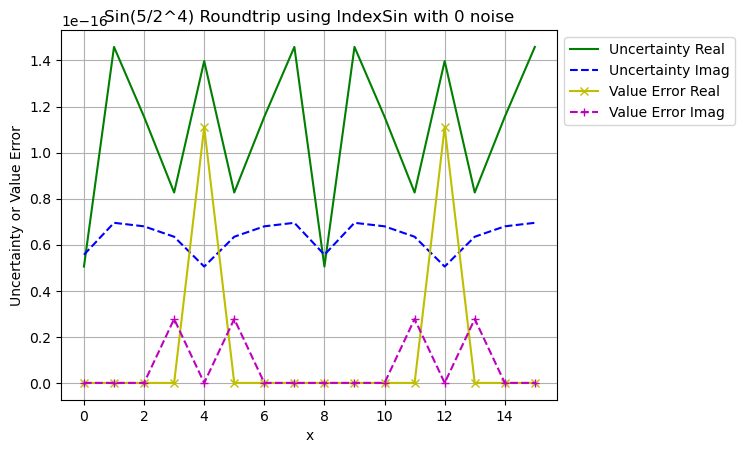

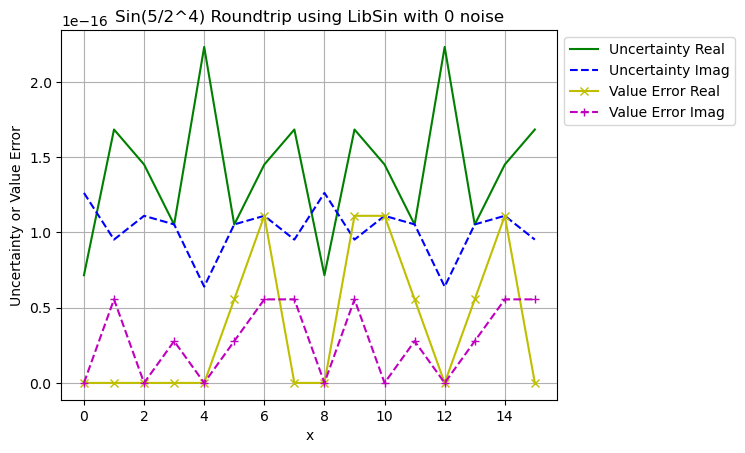

In [439]:
order = 4
freq = 5
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [440]:
PrintNormalizedErrorStat(signal='Sin', order=4, freq=6)

Forward, IndexSin, 1 mean=0.0, std=1.2152872405003998
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=-0.08364857768130289, std=5.8228010789434155
Forward, LibSin, 0 mean=0.8032584905047606, std=5.437842090262003
Reverse, IndexSin, 1 mean=0.0, std=0.0
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=0.01674682452694519, std=2798494025928322.0
Reverse, LibSin, 0 mean=0.833333333333333, std=5.7181264149168385
Roundtrip, IndexSin, 1 mean=0.0, std=0.0
Roundtrip, IndexSin, 0 mean=0.0, std=0.42163702135578385
Roundtrip, LibSin, 1 mean=3.469446951953614e-18, std=0.808122035641768
Roundtrip, LibSin, 0 mean=-0.09284766908852593, std=0.5339077366590291


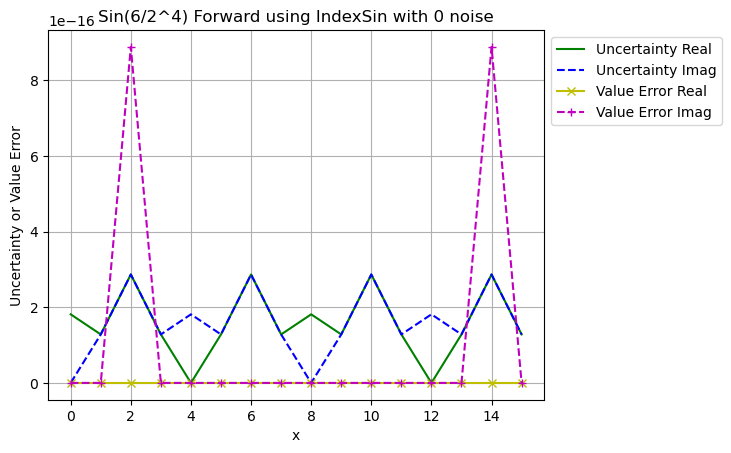

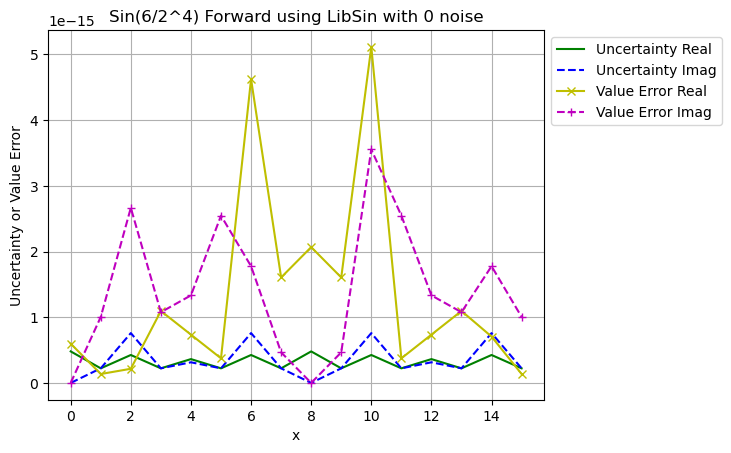

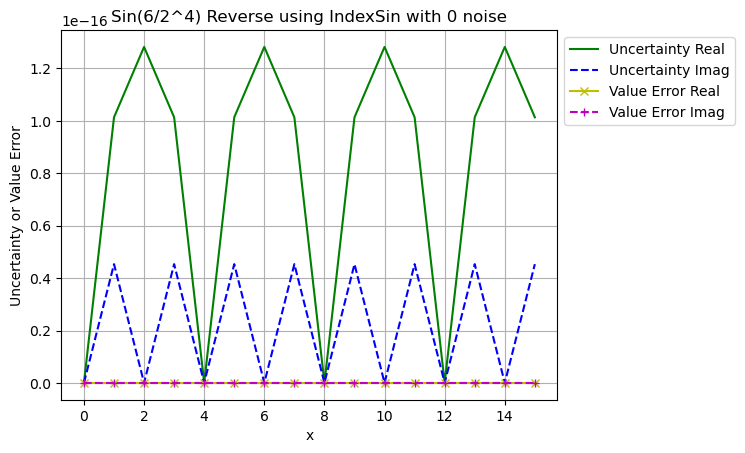

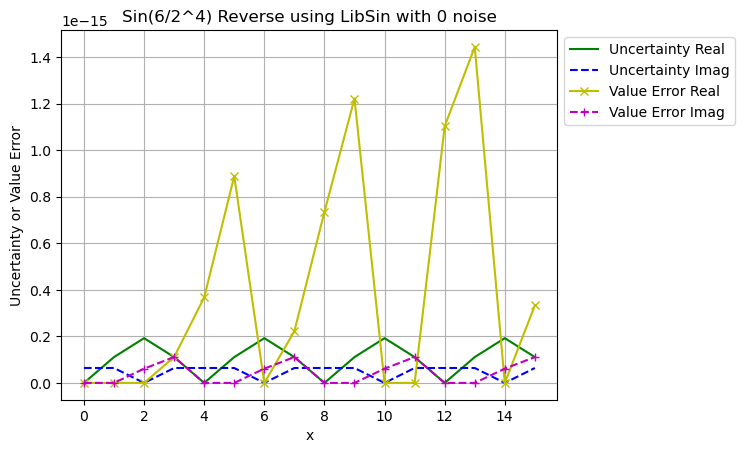

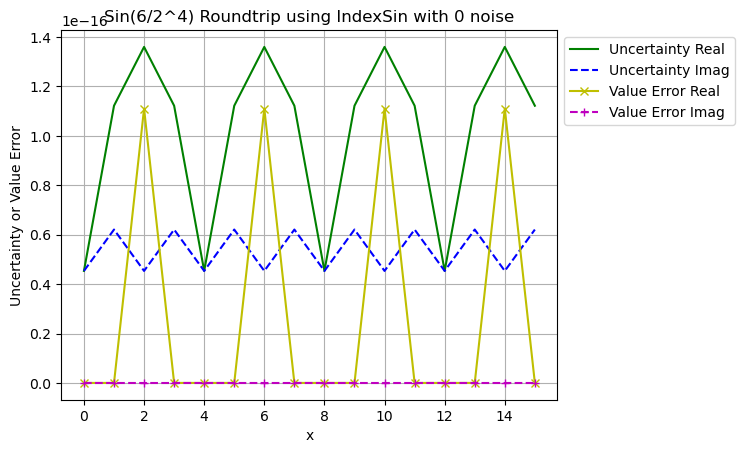

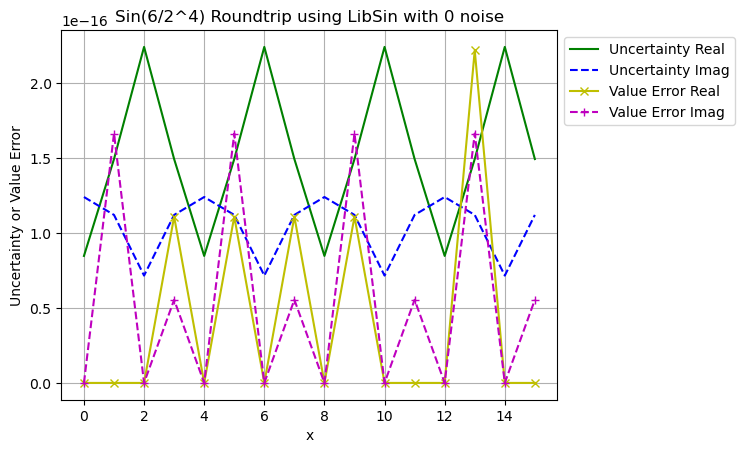

In [441]:
order = 4
freq = 6
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [442]:
PrintNormalizedErrorStat(signal='Sin', order=4, freq=7)

Forward, IndexSin, 1 mean=0.0, std=1.1108050644671628
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=0.09071985144864035, std=18.684826590586205
Forward, LibSin, 0 mean=0.5967774999409584, std=10.271588988539671
Reverse, IndexSin, 1 mean=0.0, std=0.47460303481450294
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-0.024668780376627057, std=1869268096786929.5
Reverse, LibSin, 0 mean=3.0144433811484497, std=9.948060400686725
Roundtrip, IndexSin, 1 mean=0.0, std=0.22582732401361805
Roundtrip, IndexSin, 0 mean=0.0, std=0.29007476007642397
Roundtrip, LibSin, 1 mean=-1.0408340855860843e-17, std=0.7815441551508484
Roundtrip, LibSin, 0 mean=0.016490183919280012, std=0.3406097791837052


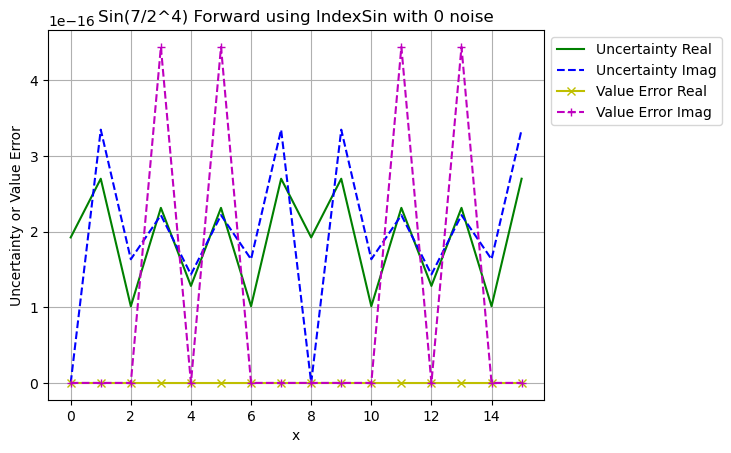

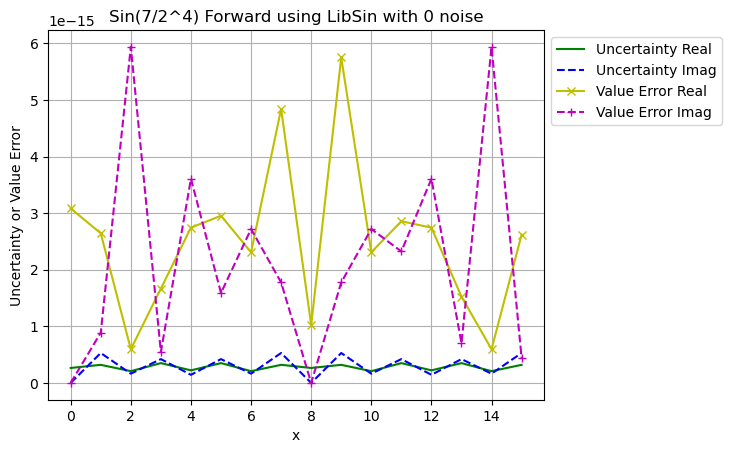

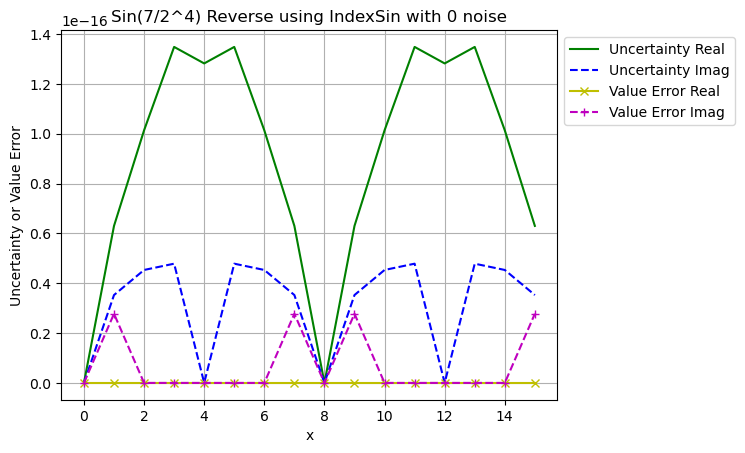

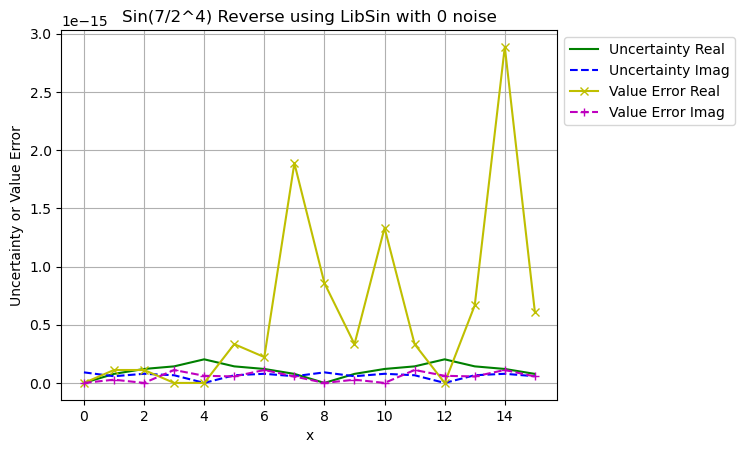

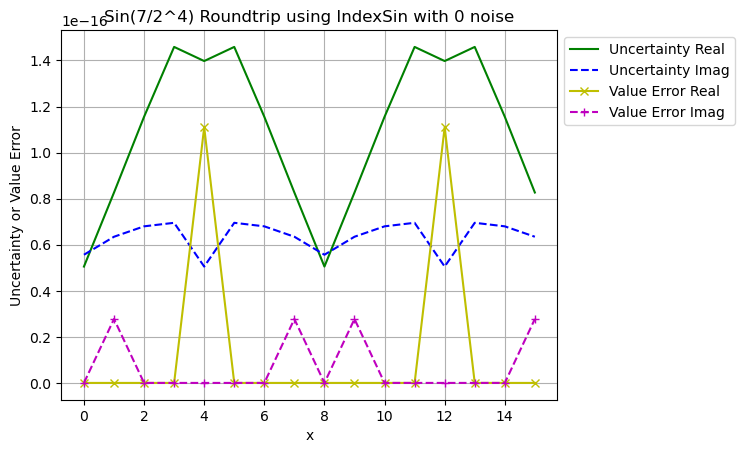

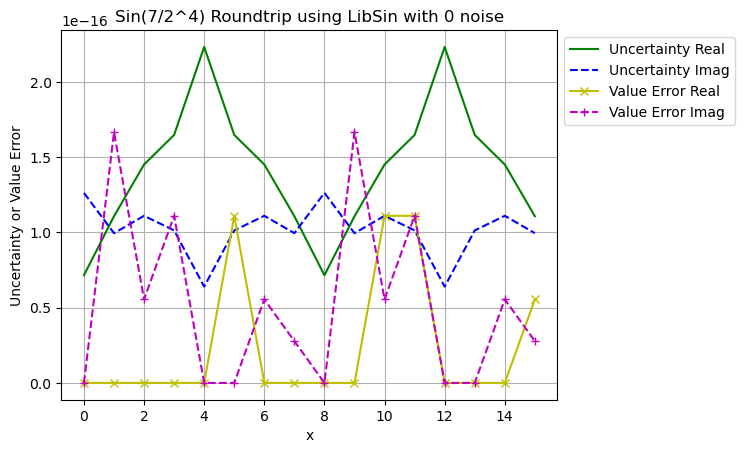

In [443]:
order = 4
freq = 7
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

## Resonance

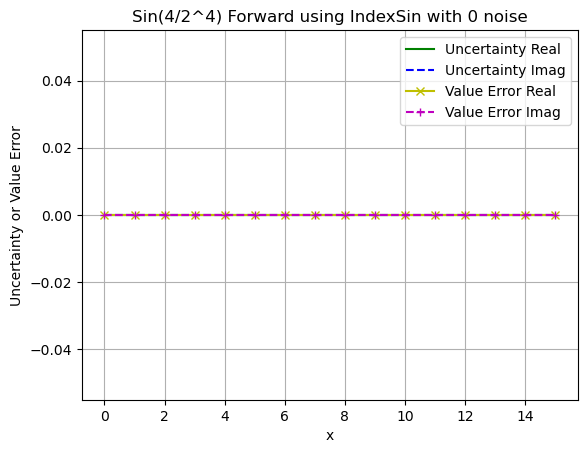

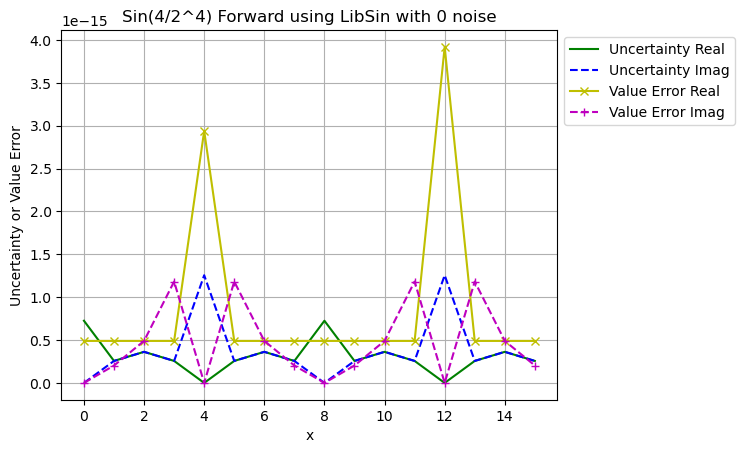

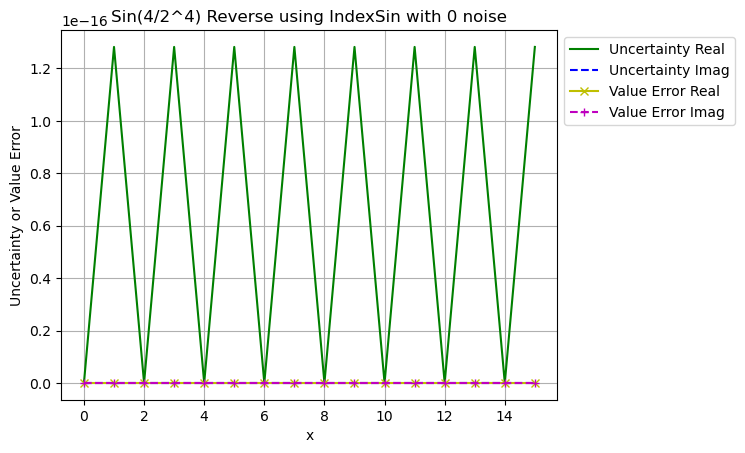

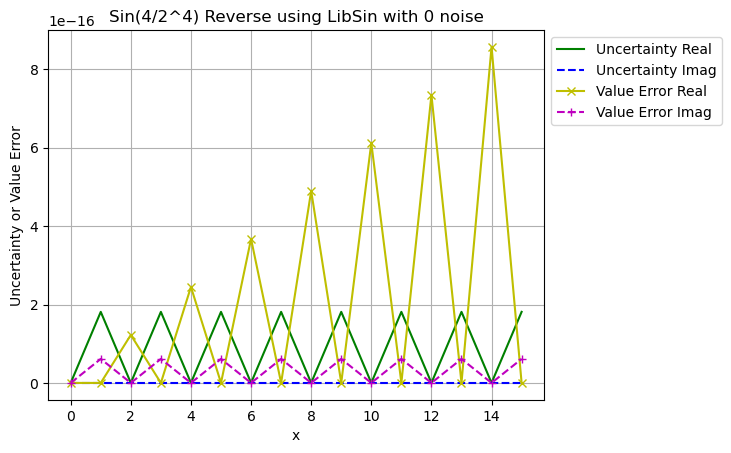

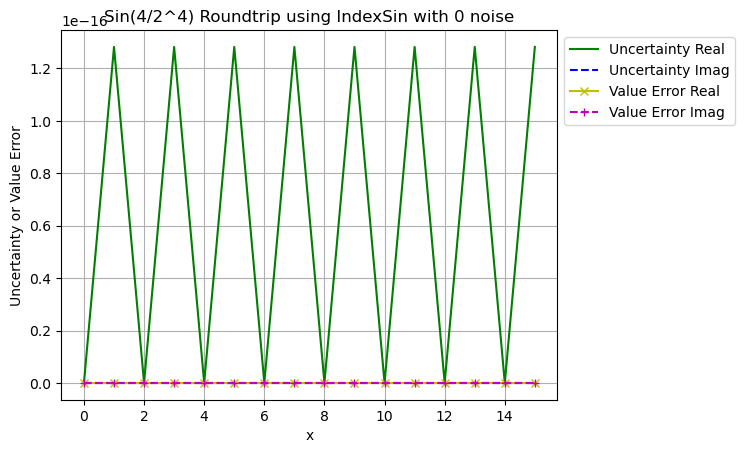

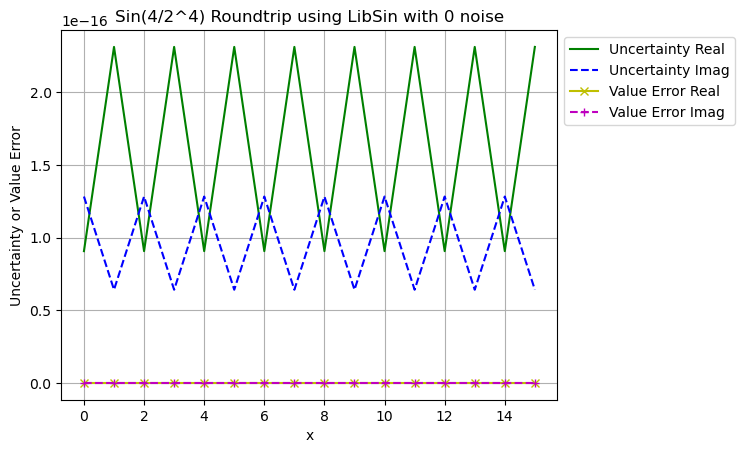

In [444]:
order = 4
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test, noiseType='Gaussian', noise=0)

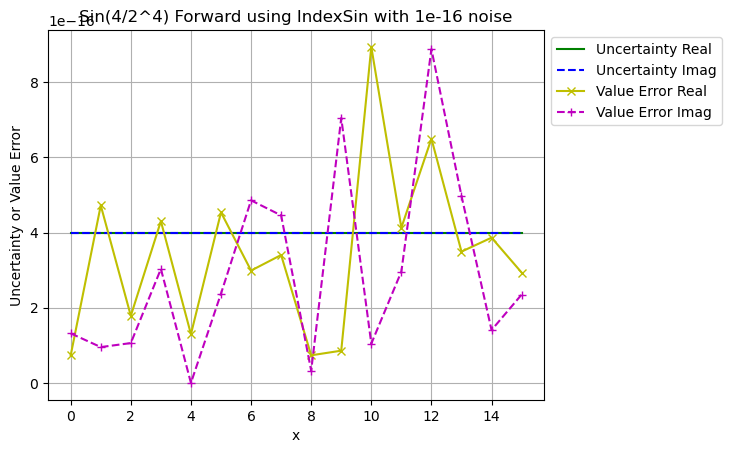

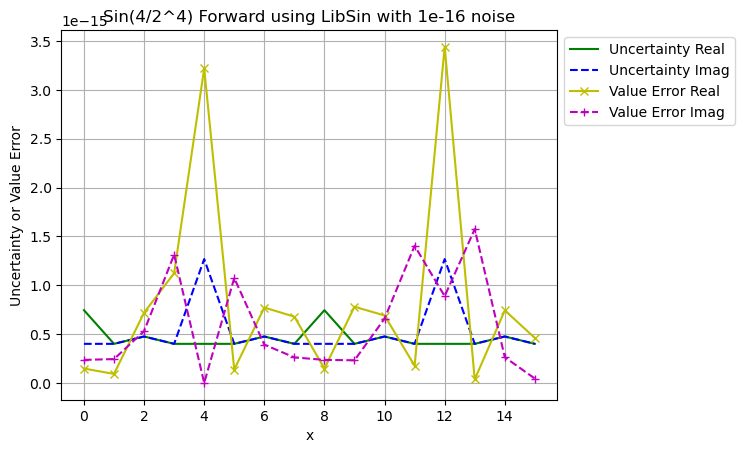

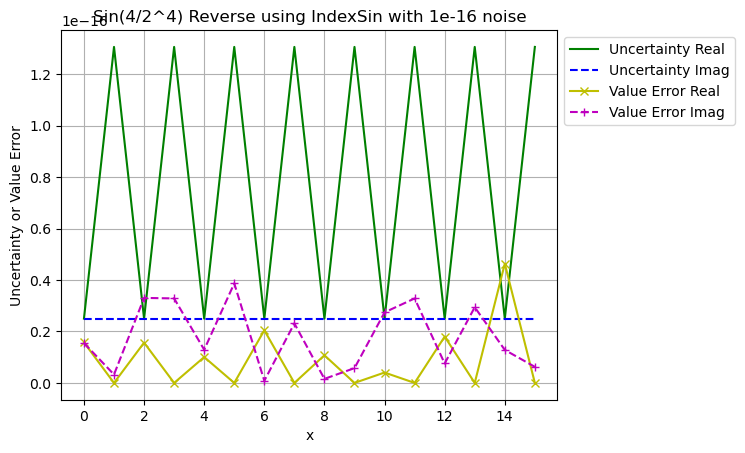

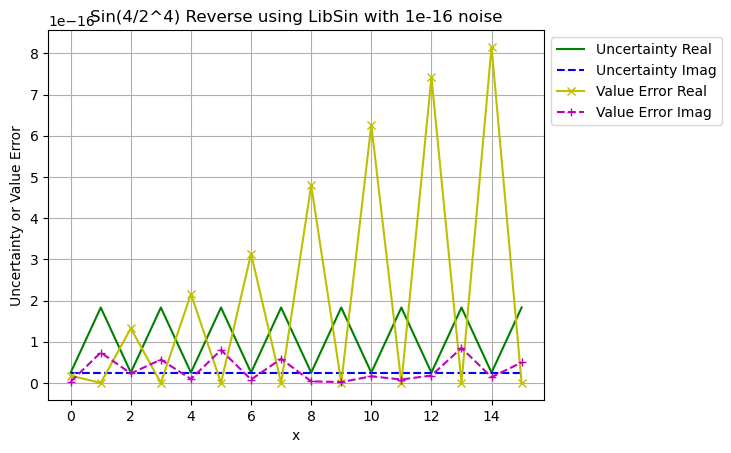

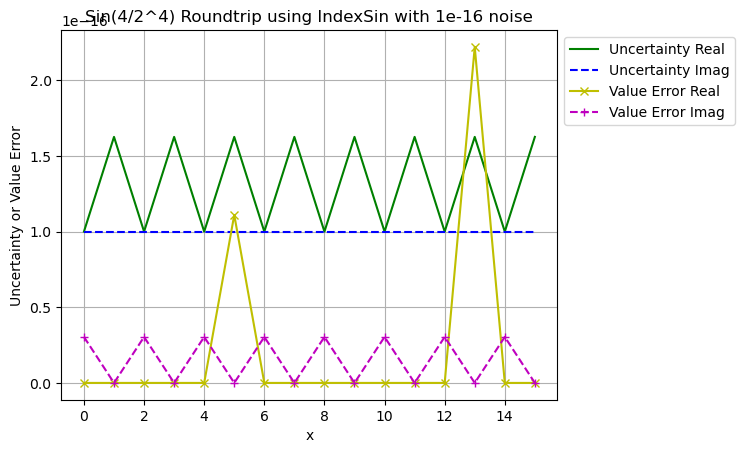

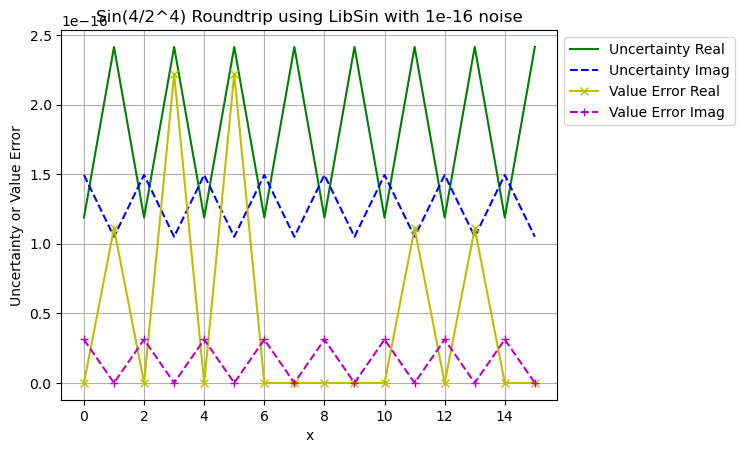

In [445]:
order = 4
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test, noiseType='Gaussian', noise=1e-16)

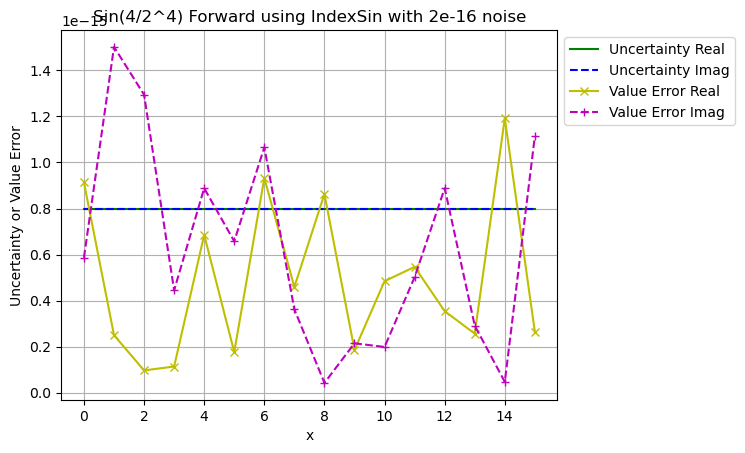

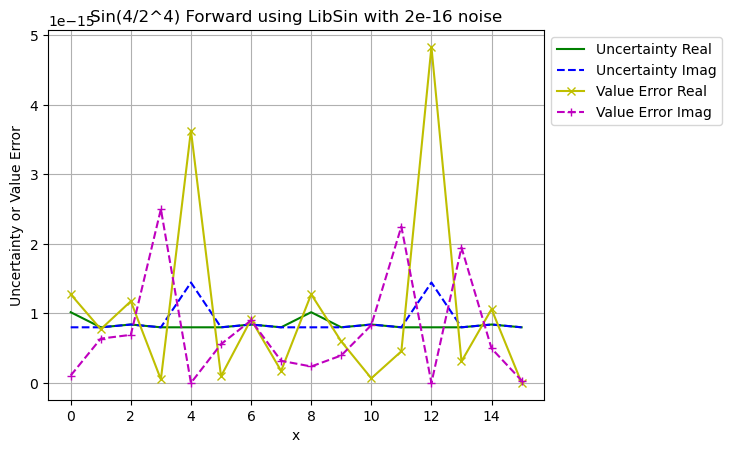

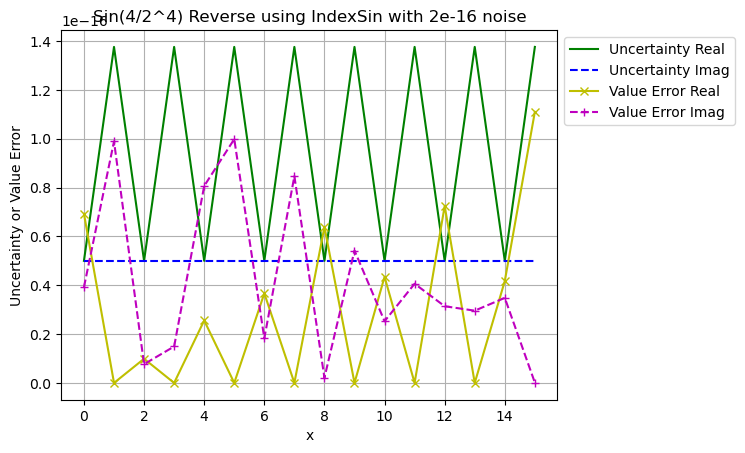

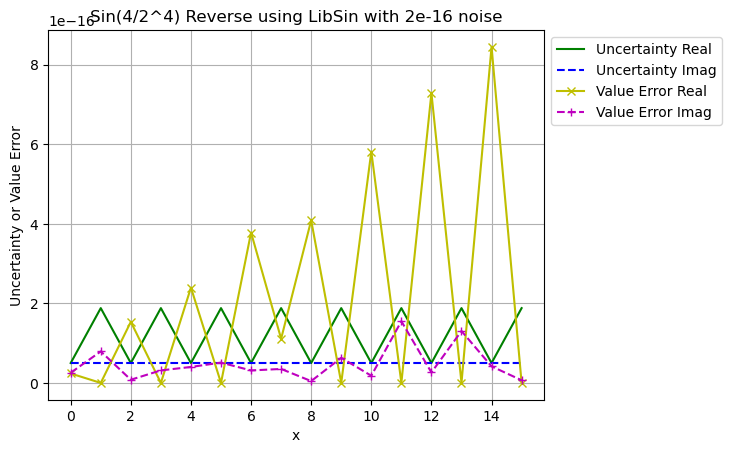

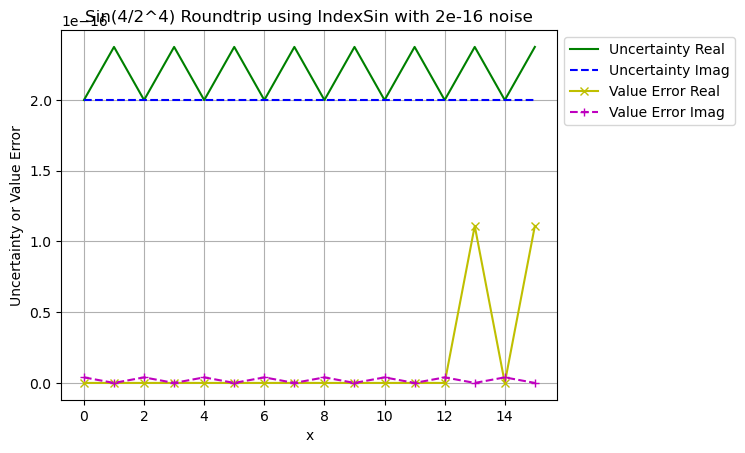

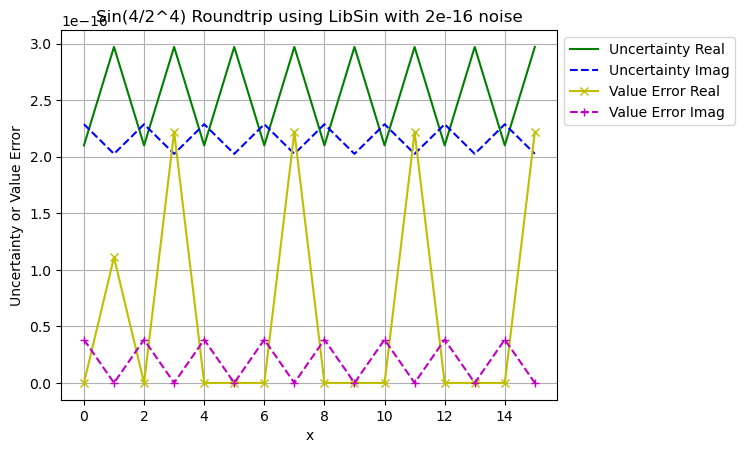

In [446]:
order = 4
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test, noiseType='Gaussian', noise=2e-16)

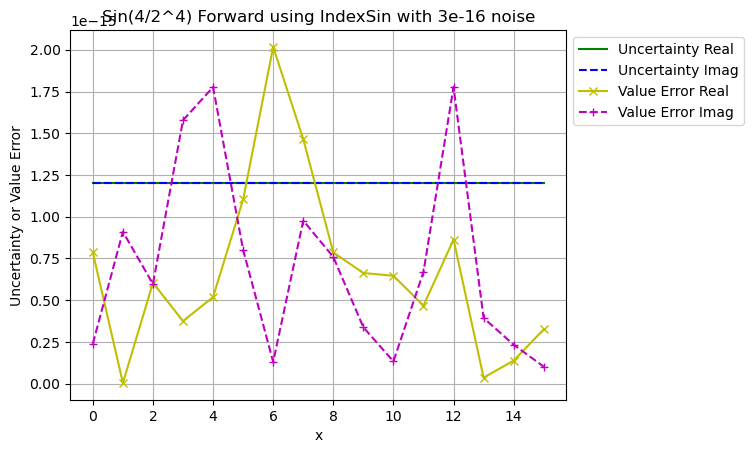

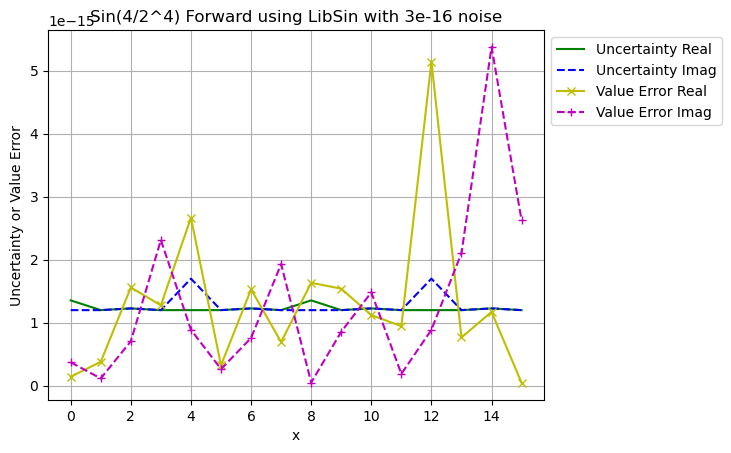

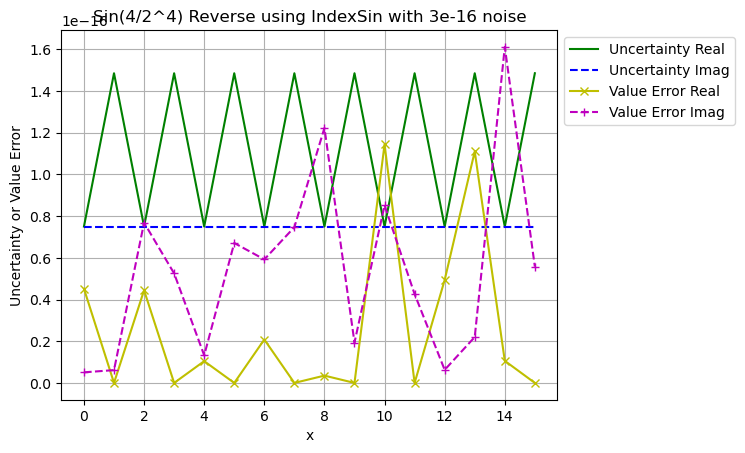

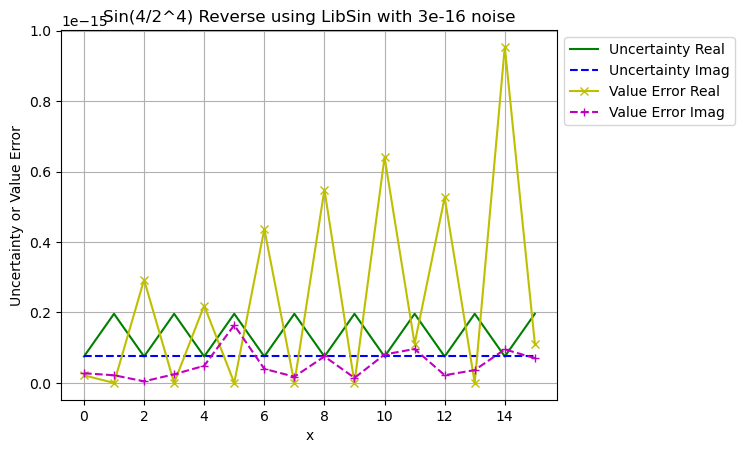

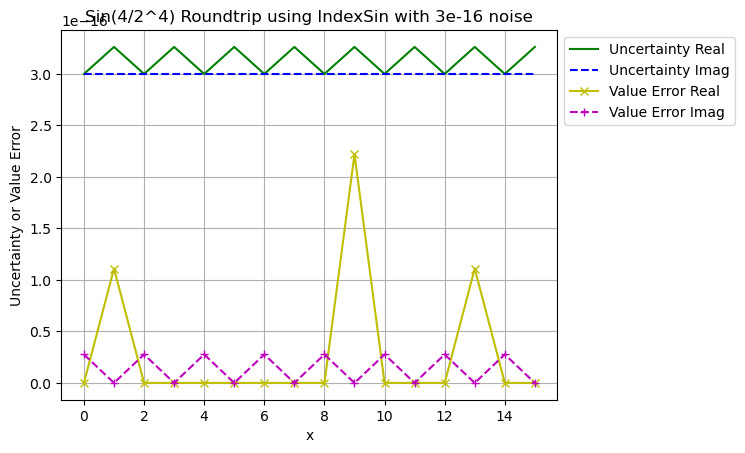

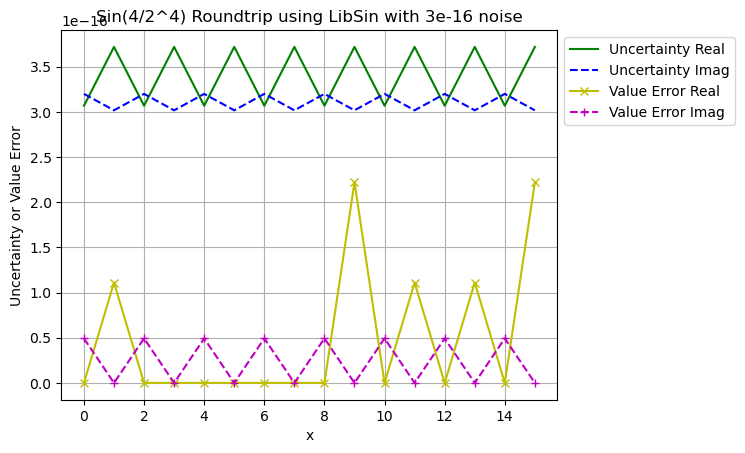

In [447]:
order = 4
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test, noiseType='Gaussian', noise=3e-16)

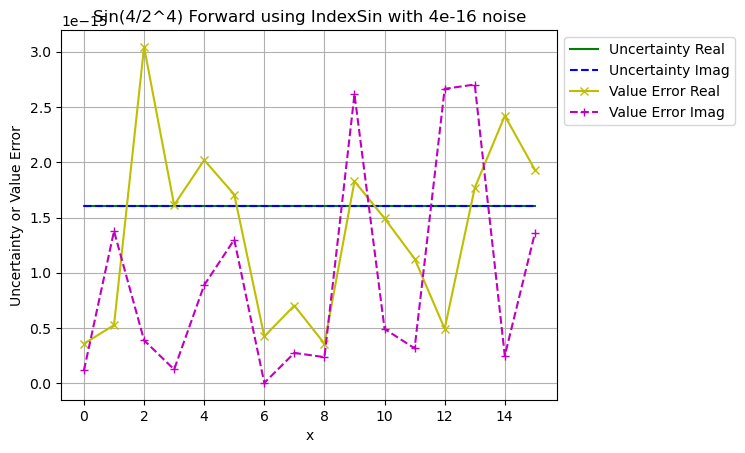

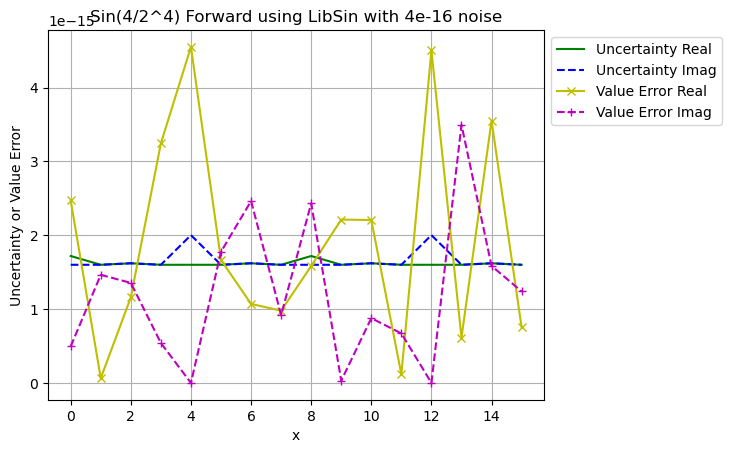

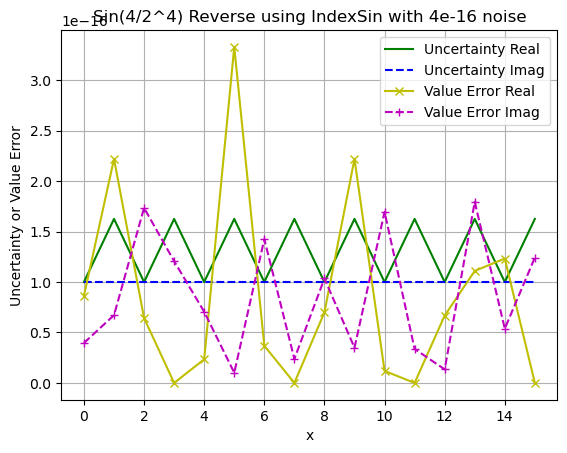

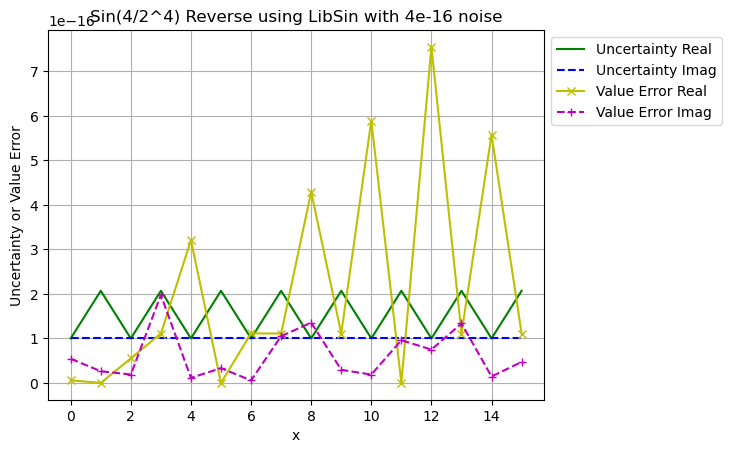

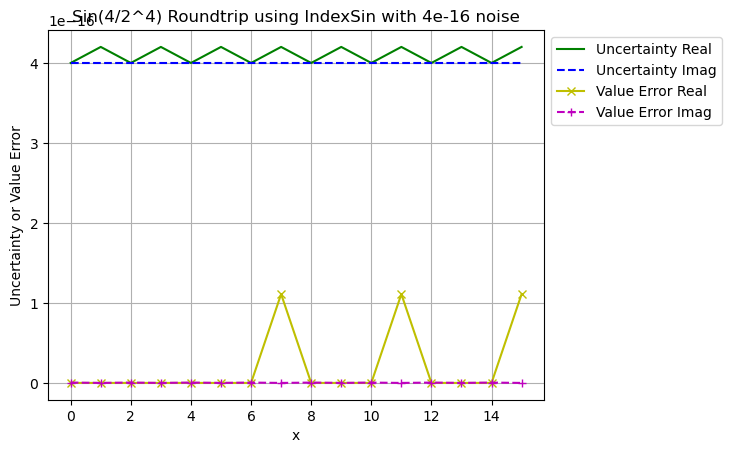

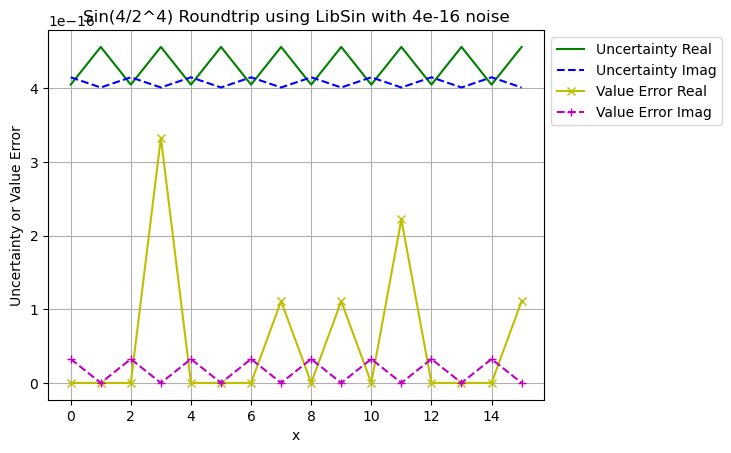

In [448]:
order = 4
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test, noiseType='Gaussian', noise=4e-16)

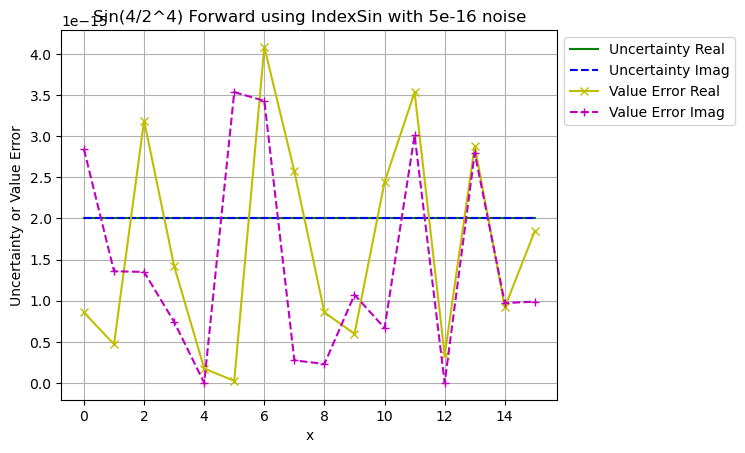

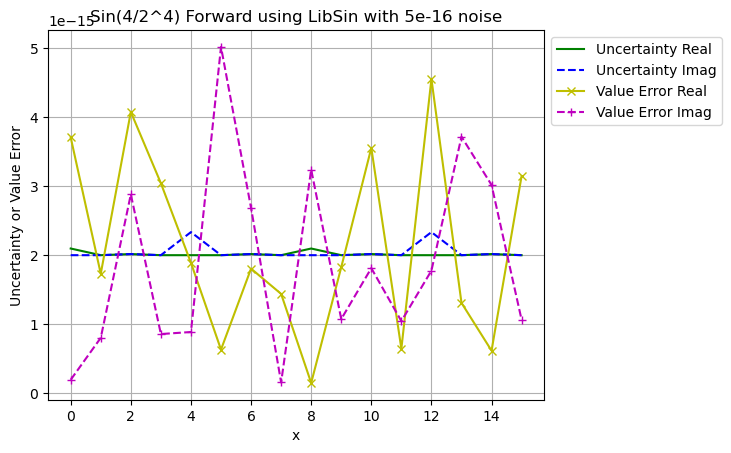

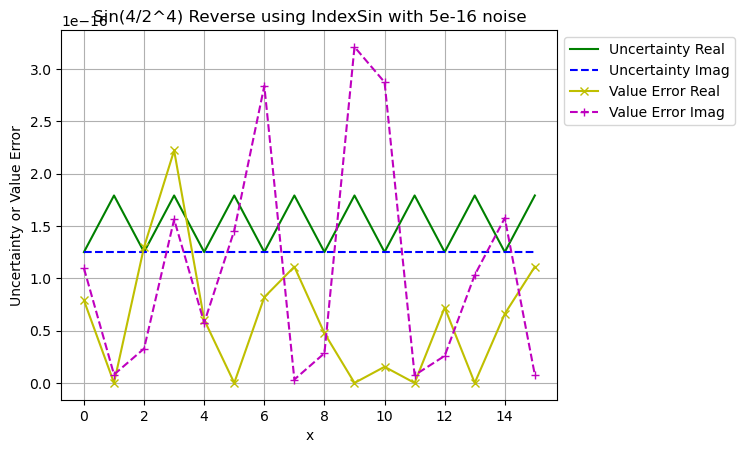

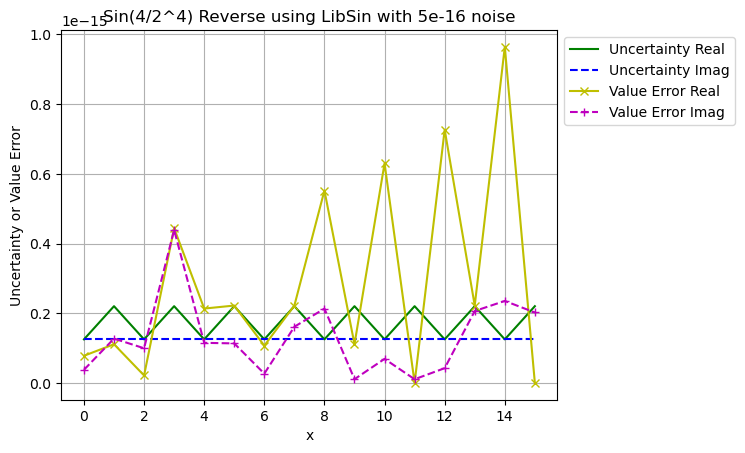

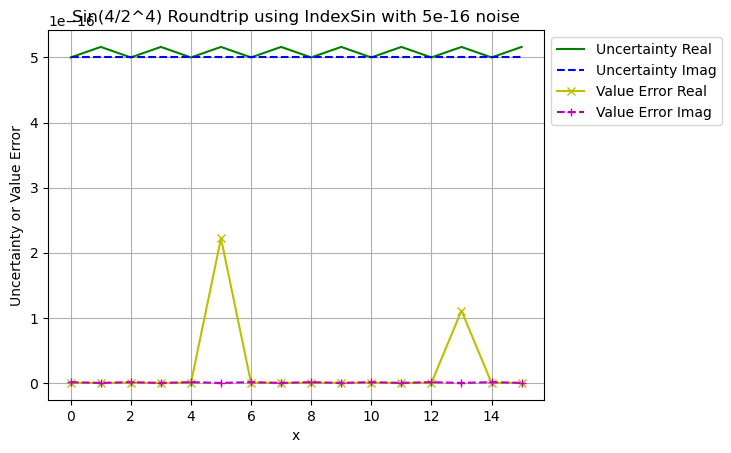

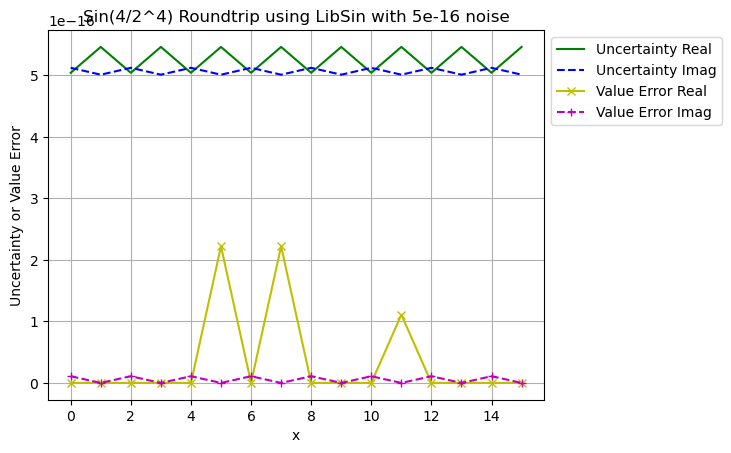

In [449]:
order = 4
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test, noiseType='Gaussian', noise=5e-16)

## Order=5

In [450]:
PrintNormalizedErrorStat(signal='Sin', order=5, freq=1)

Forward, IndexSin, 1 mean=1.8503717077085942e-18, std=0.9244195915451687
Forward, IndexSin, 0 mean=0.0, std=0.1970614467378533
Forward, LibSin, 1 mean=0.06816480942592683, std=2.1690082367100882
Forward, LibSin, 0 mean=0.06451751204432682, std=3.1062445412861344
Reverse, IndexSin, 1 mean=-1.982541115402065e-18, std=0.40519675816457545
Reverse, IndexSin, 0 mean=0.0, std=0.20845037472909428
Reverse, LibSin, 1 mean=-0.03410956952537768, std=1235465849021352.5
Reverse, LibSin, 0 mean=0.10972010108981142, std=2.617362781449104
Roundtrip, IndexSin, 1 mean=2.6020852139652106e-18, std=0.3063617050197851
Roundtrip, IndexSin, 0 mean=-8.673617379884035e-18, std=0.3694261228303397
Roundtrip, LibSin, 1 mean=4.163336342344337e-17, std=0.9396007308565899
Roundtrip, LibSin, 0 mean=0.0020775756627025646, std=0.8945793016323327


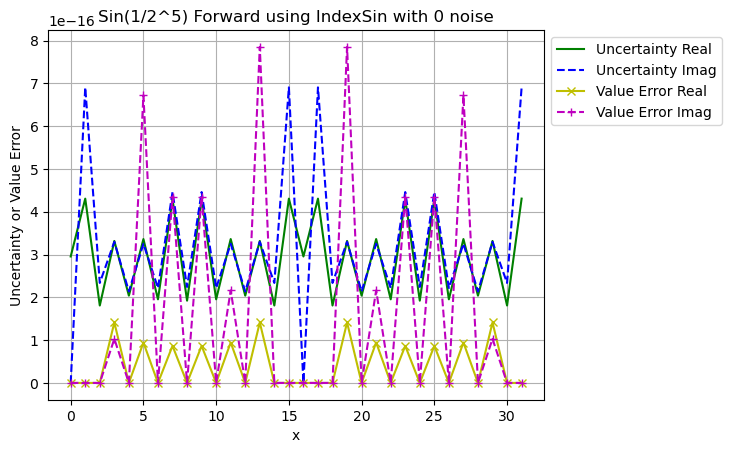

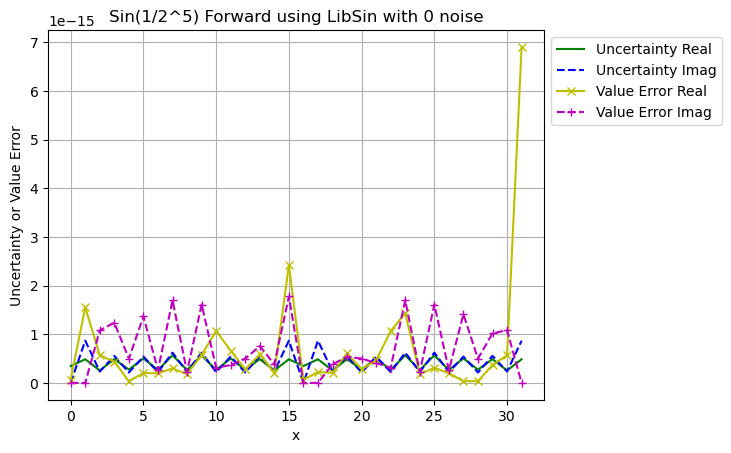

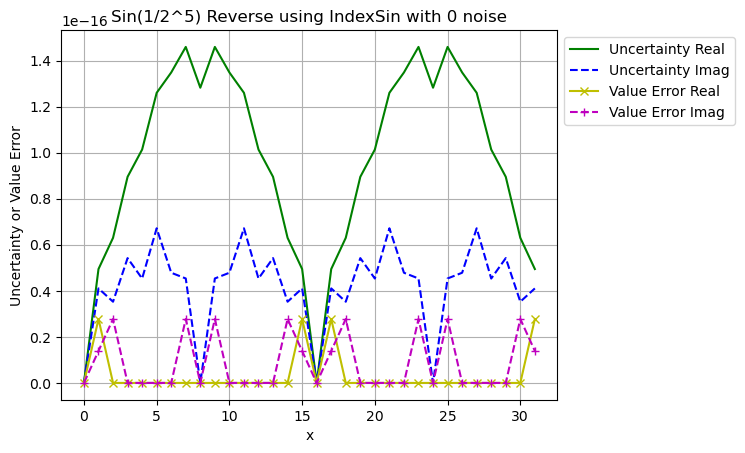

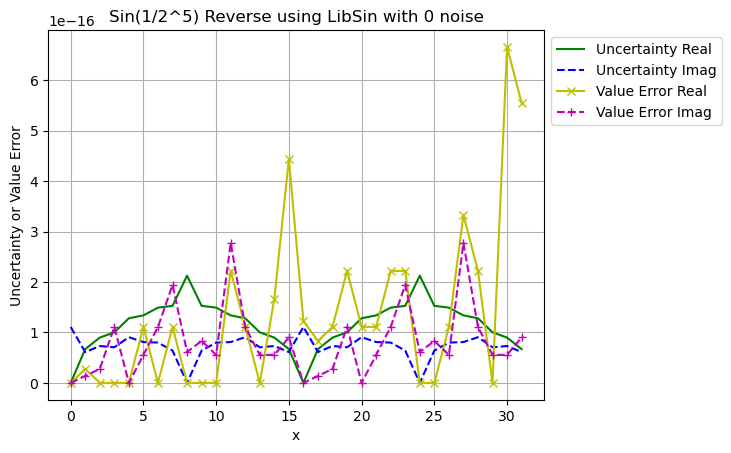

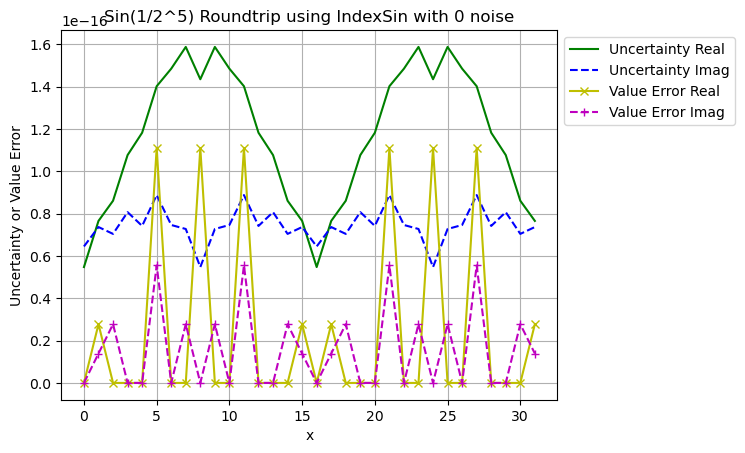

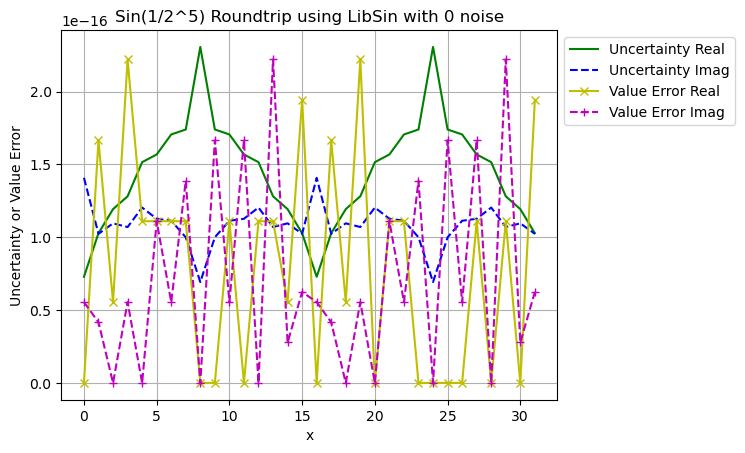

In [451]:
order = 5
freq = 1
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [452]:
PrintNormalizedErrorStat(signal='Sin', order=5, freq=2)

Forward, IndexSin, 1 mean=0.0, std=0.8142938786922813
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=-4.4408920985006264e-17, std=2.952832432039236
Forward, LibSin, 0 mean=0.3352357877962297, std=3.8055481450892557
Reverse, IndexSin, 1 mean=0.0, std=0.4641709249653341
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-0.06947273783663194, std=1838871467819350.8
Reverse, LibSin, 0 mean=0.26568869417948654, std=4.155351748258829
Roundtrip, IndexSin, 1 mean=0.0, std=0.22029777703910153
Roundtrip, IndexSin, 0 mean=0.0, std=0.2853577829504256
Roundtrip, LibSin, 1 mean=1.8971519900262517e-17, std=0.30726527742589926
Roundtrip, LibSin, 0 mean=-0.05994223982387303, std=0.8493951020829614


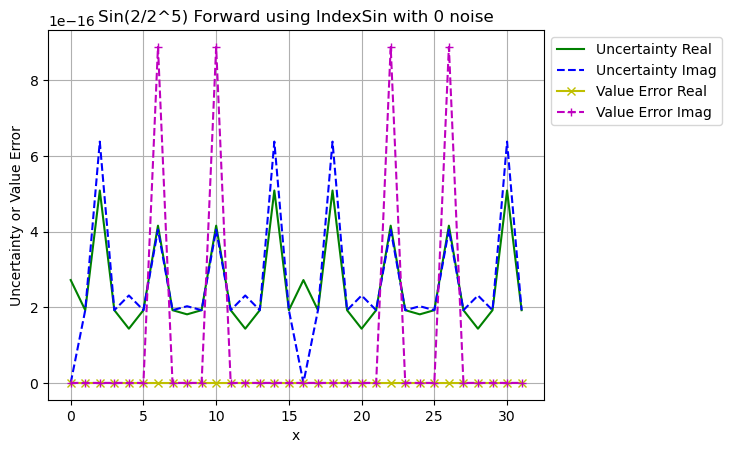

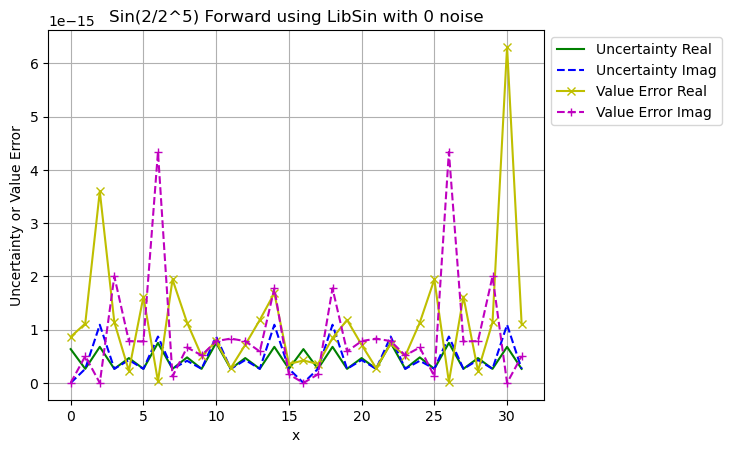

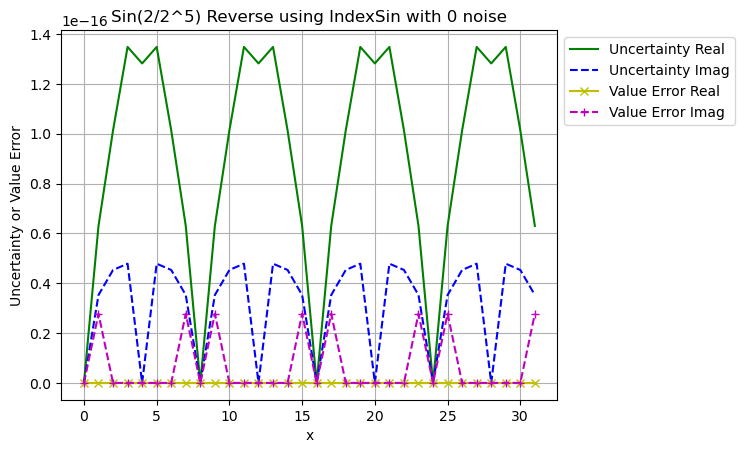

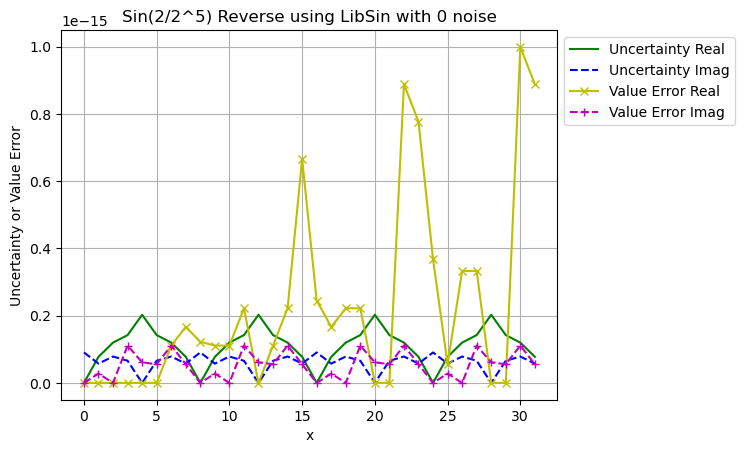

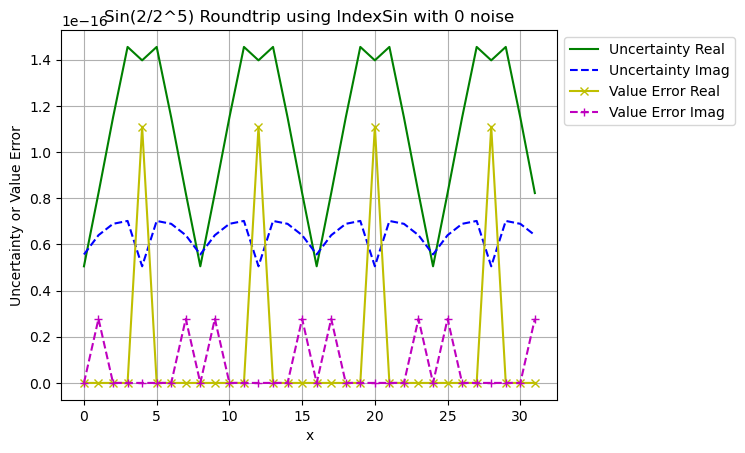

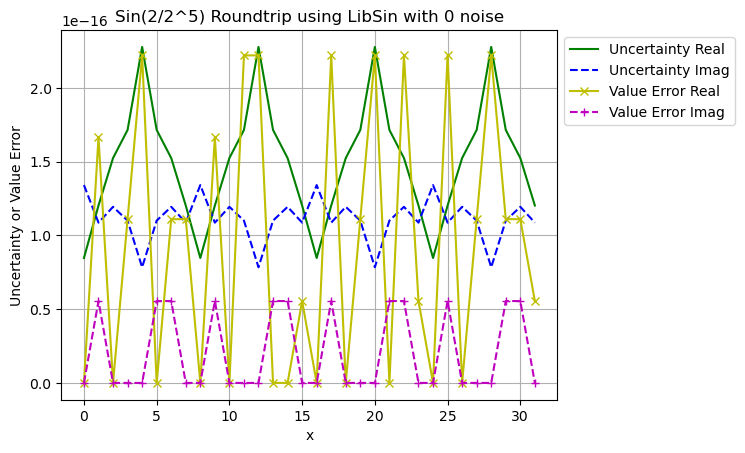

In [453]:
order = 5
freq = 2
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [454]:
PrintNormalizedErrorStat(signal='Sin', order=5, freq=3)

Forward, IndexSin, 1 mean=-3.7007434154171884e-18, std=1.046282807835502
Forward, IndexSin, 0 mean=5.204170427930421e-18, std=0.32283276660593047
Forward, LibSin, 1 mean=0.008734224925021412, std=6.396342710676033
Forward, LibSin, 0 mean=0.5236849505141229, std=5.459352806001165
Reverse, IndexSin, 1 mean=0.0, std=0.5238253747691355
Reverse, IndexSin, 0 mean=0.0, std=0.4726951841791027
Reverse, LibSin, 1 mean=-0.03813781776583747, std=1235465849021352.5
Reverse, LibSin, 0 mean=-0.3543679911257865, std=6.197344358444855
Roundtrip, IndexSin, 1 mean=8.673617379884035e-18, std=0.5524989794477819
Roundtrip, IndexSin, 0 mean=-1.3877787807814457e-17, std=0.4792025565577013
Roundtrip, LibSin, 1 mean=2.7755575615628914e-17, std=0.9903407401564276
Roundtrip, LibSin, 0 mean=0.029267967934632984, std=0.9602647700847682


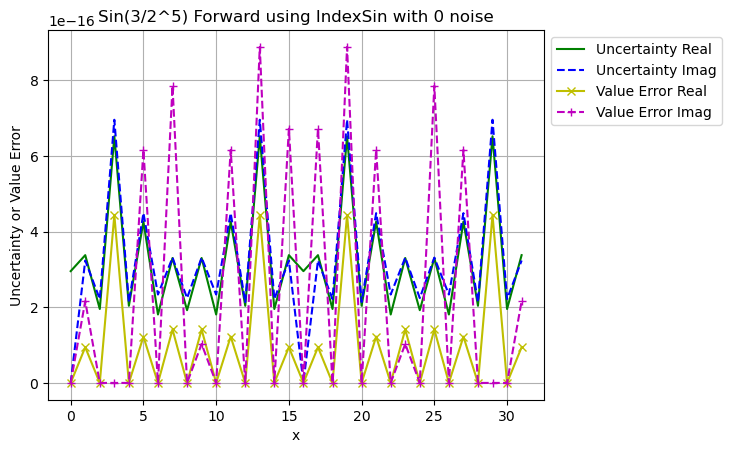

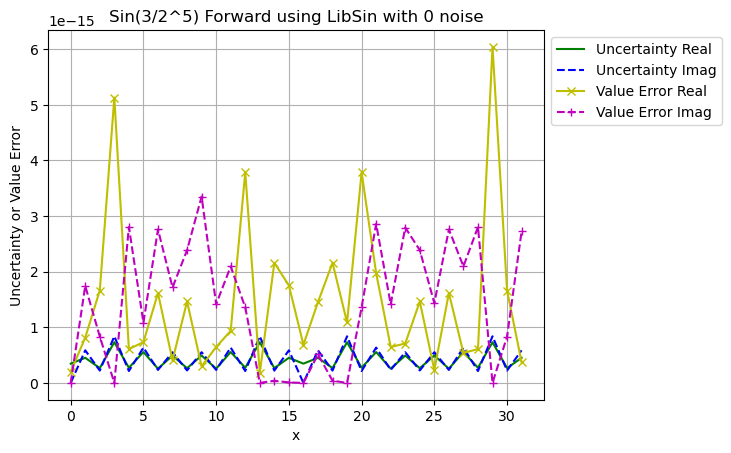

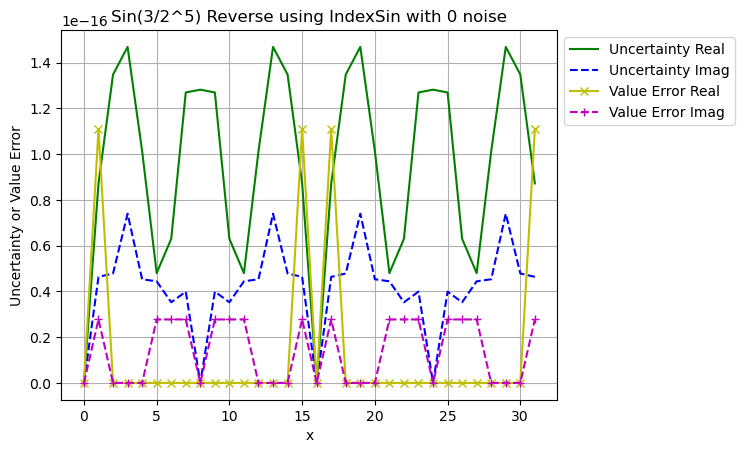

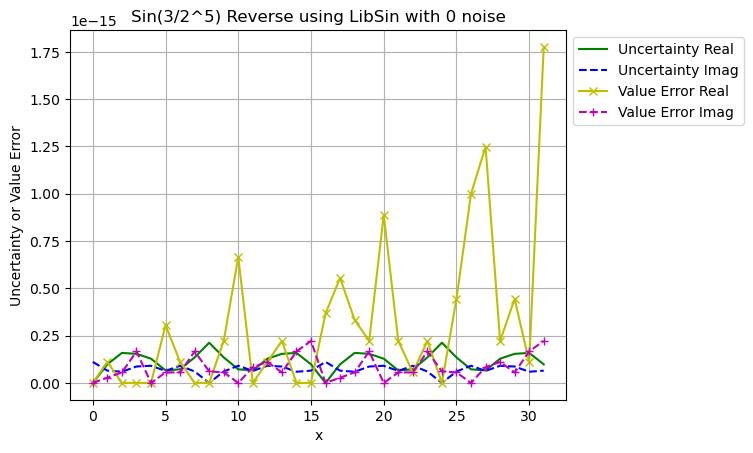

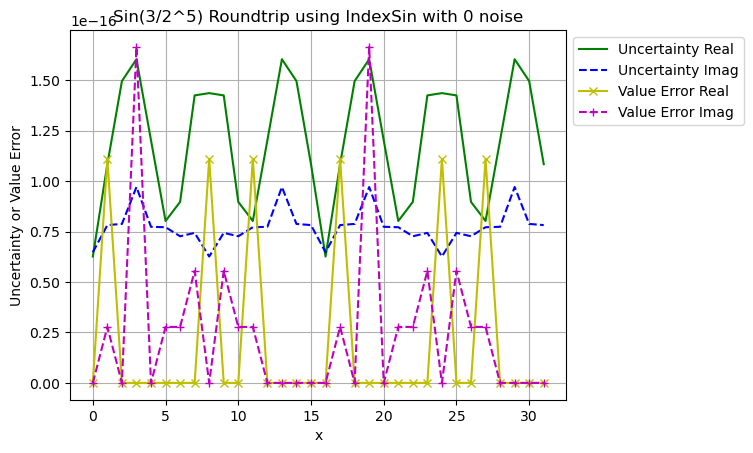

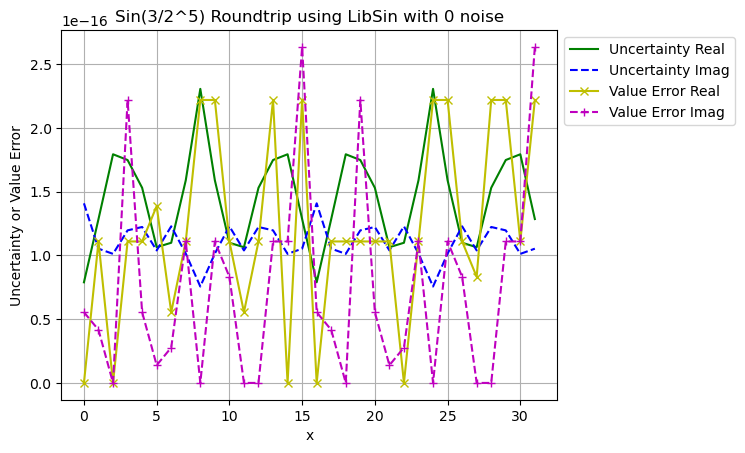

In [455]:
order = 5
freq = 3
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [456]:
PrintNormalizedErrorStat(signal='Sin', order=5, freq=4)

Forward, IndexSin, 1 mean=0.0, std=0.8576900278702356
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=-0.03876012664892097, std=3.8934308959276156
Forward, LibSin, 0 mean=0.615373086448105, std=3.800035445013275
Reverse, IndexSin, 1 mean=0.0, std=0.0
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=0.008373412263472595, std=2752987025236261.5
Reverse, LibSin, 0 mean=0.25000000000000006, std=5.42337934117289
Roundtrip, IndexSin, 1 mean=0.0, std=0.0
Roundtrip, IndexSin, 0 mean=0.0, std=0.41478067789217005
Roundtrip, LibSin, 1 mean=0.0, std=0.23411570369727547
Roundtrip, LibSin, 0 mean=0.13292914303516293, std=0.9934764415724541


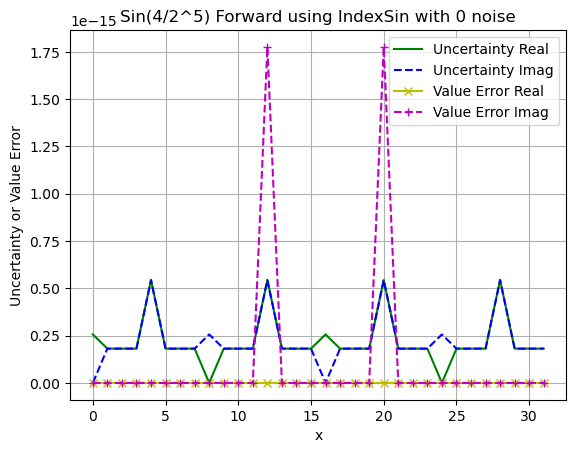

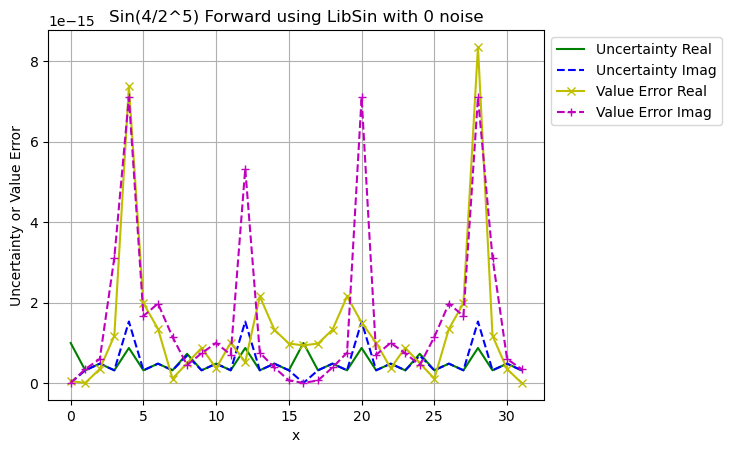

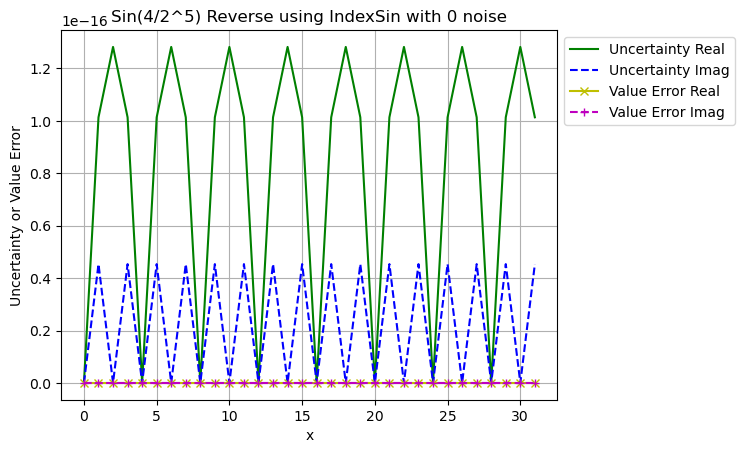

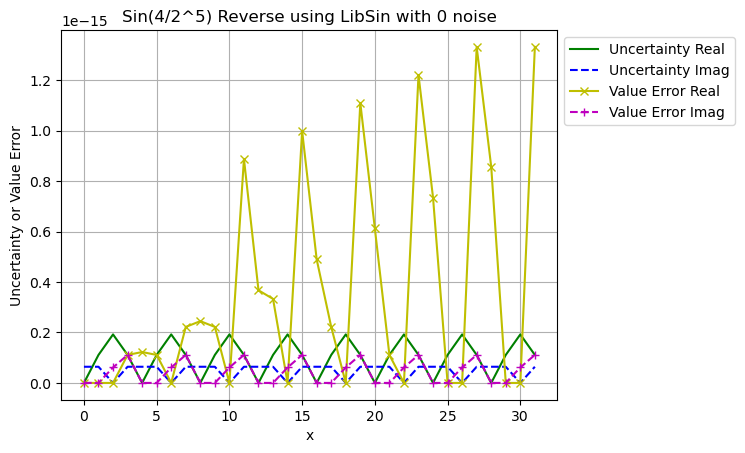

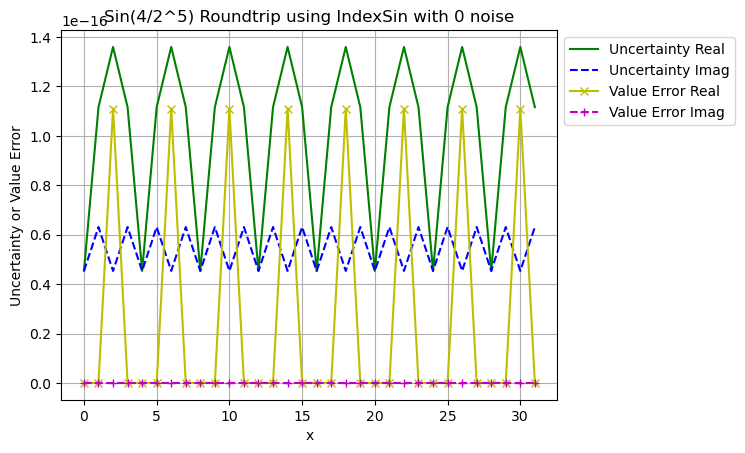

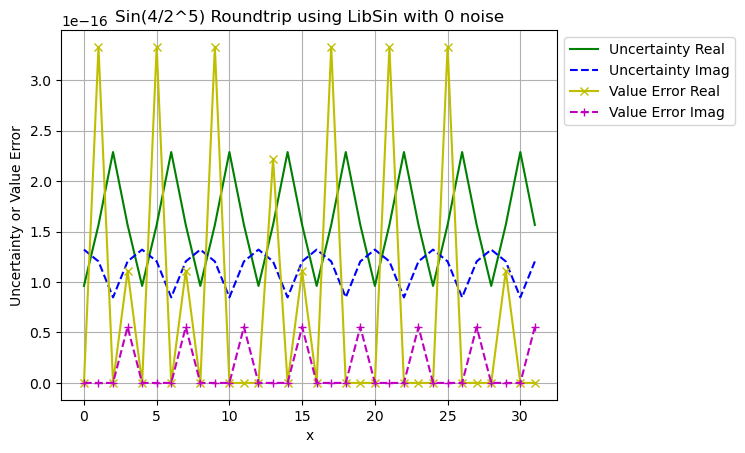

In [457]:
order = 5
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [458]:
PrintNormalizedErrorStat(signal='Sin', order=5, freq=5)

Forward, IndexSin, 1 mean=0.0, std=1.0462828078355018
Forward, IndexSin, 0 mean=-8.673617379884035e-18, std=0.32283276660593047
Forward, LibSin, 1 mean=-0.004851445070879719, std=6.144823131218722
Forward, LibSin, 0 mean=1.0668643522363868, std=9.62879862366339
Reverse, IndexSin, 1 mean=0.0, std=0.5238253747691355
Reverse, IndexSin, 0 mean=0.0, std=0.4726951841791027
Reverse, LibSin, 1 mean=0.03179240720345783, std=1235465849021352.5
Reverse, LibSin, 0 mean=1.8929799384755412, std=9.562379593620575
Roundtrip, IndexSin, 1 mean=1.3877787807814457e-17, std=0.5524989794477819
Roundtrip, IndexSin, 0 mean=0.0, std=0.4792025565577013
Roundtrip, LibSin, 1 mean=4.163336342344337e-17, std=0.8918889207502152
Roundtrip, LibSin, 0 mean=0.09831940054466548, std=0.7268694060862353


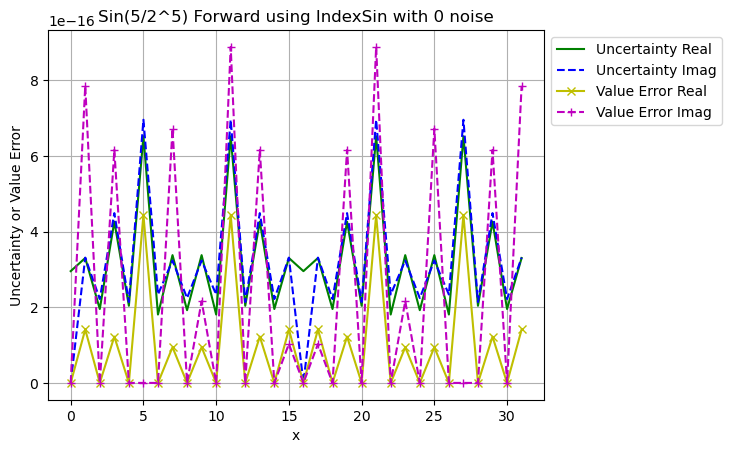

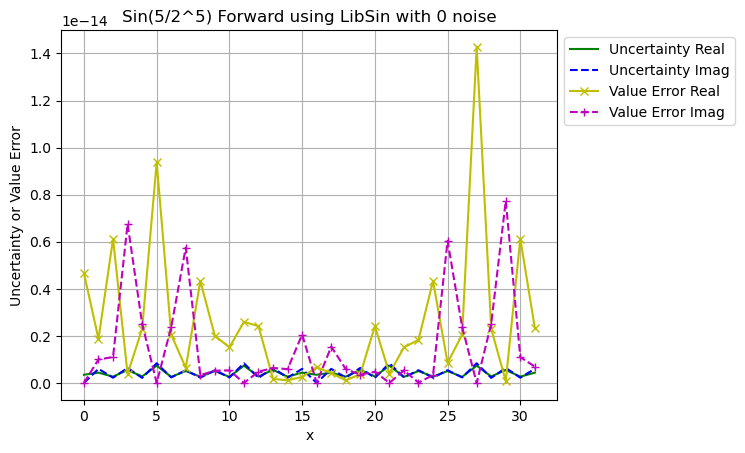

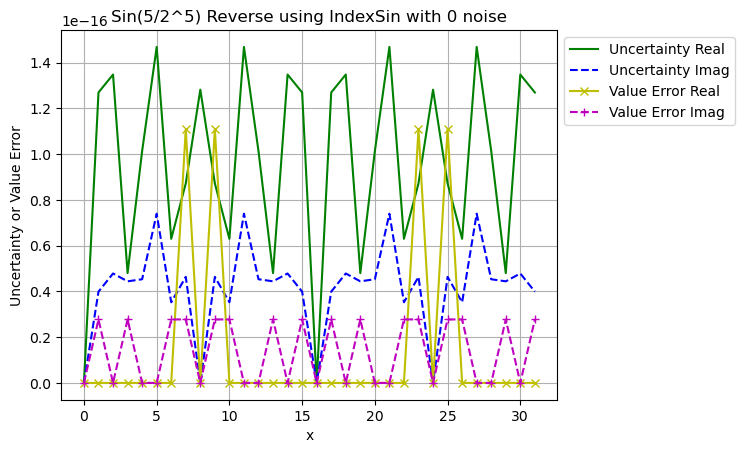

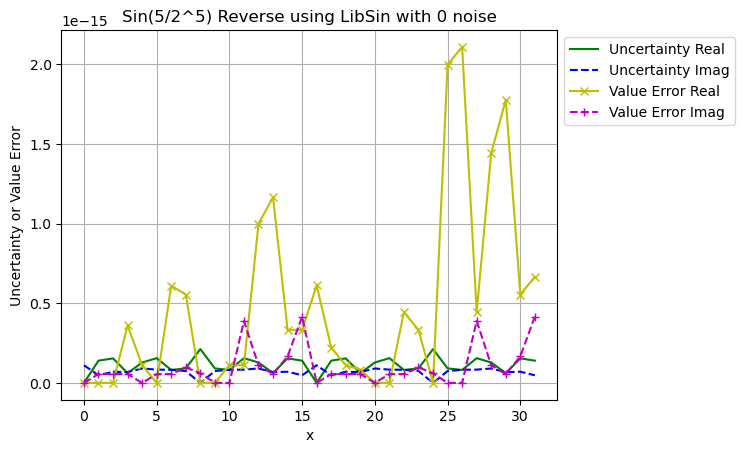

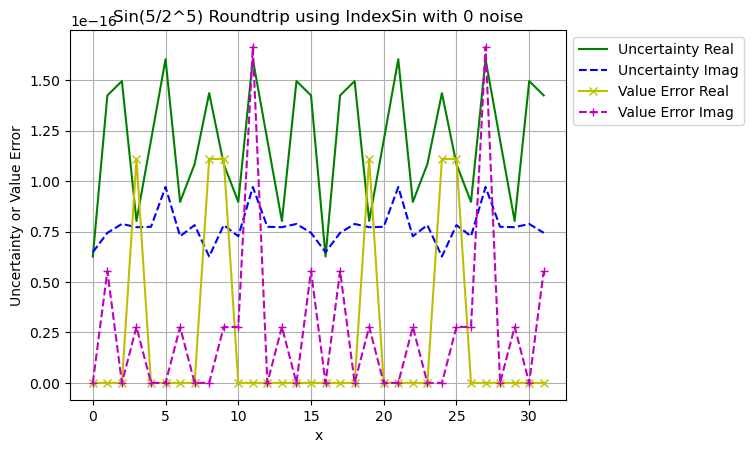

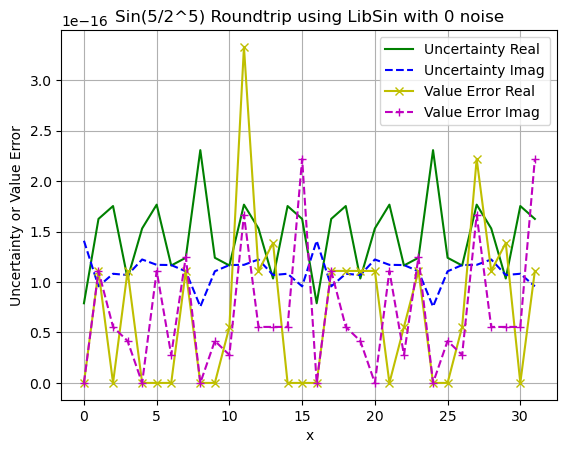

In [459]:
order = 5
freq = 5
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [460]:
PrintNormalizedErrorStat(signal='Sin', order=5, freq=6)

Forward, IndexSin, 1 mean=0.0, std=0.8142938786922813
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=-0.10520565490790332, std=11.66032290920757
Forward, LibSin, 0 mean=1.061849760294633, std=9.376477632225921
Reverse, IndexSin, 1 mean=0.0, std=0.4641709249653341
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-0.01598710356831559, std=1838871467819350.8
Reverse, LibSin, 0 mean=-1.3084534623065842, std=14.110663268890338
Roundtrip, IndexSin, 1 mean=0.0, std=0.22029777703910153
Roundtrip, IndexSin, 0 mean=0.0, std=0.2853577829504256
Roundtrip, LibSin, 1 mean=-6.938893903907228e-18, std=1.003139909148434
Roundtrip, LibSin, 0 mean=-0.035225106527287296, std=0.5134797122653704


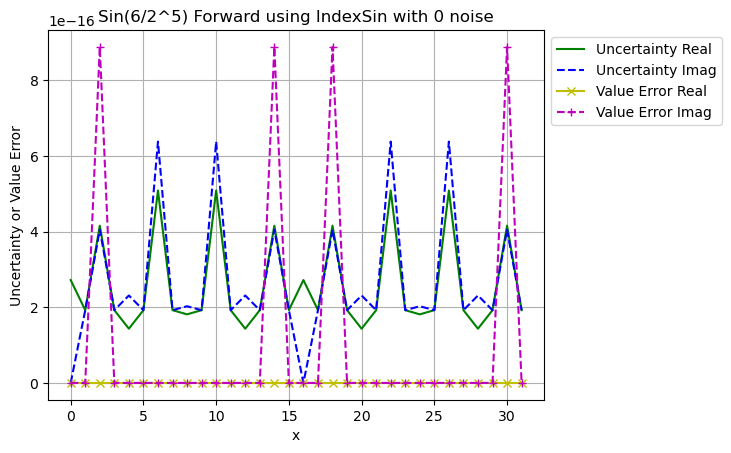

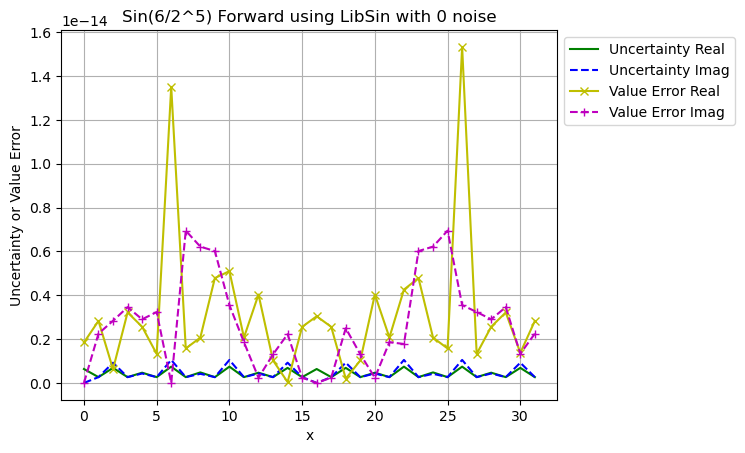

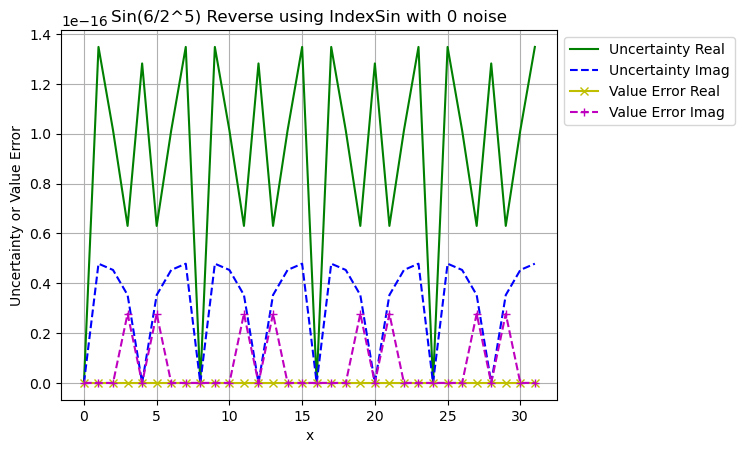

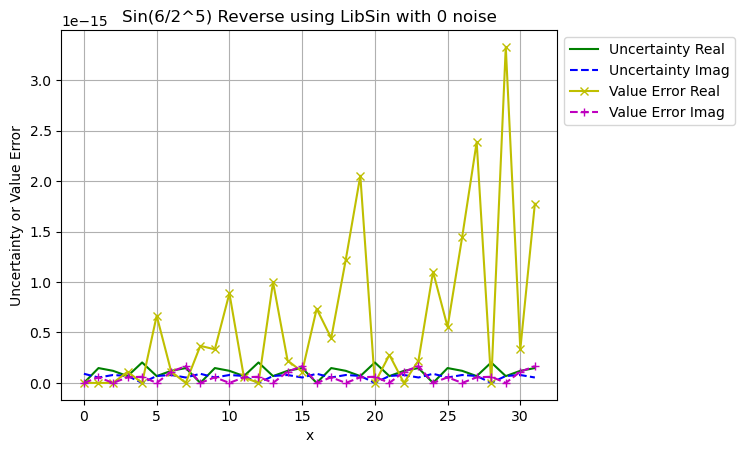

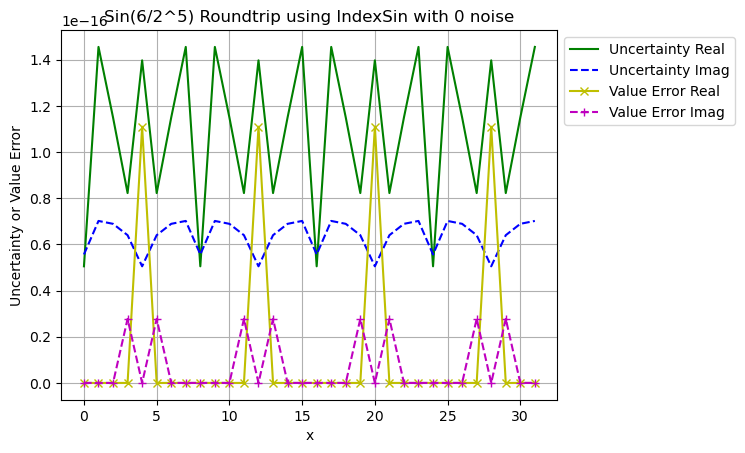

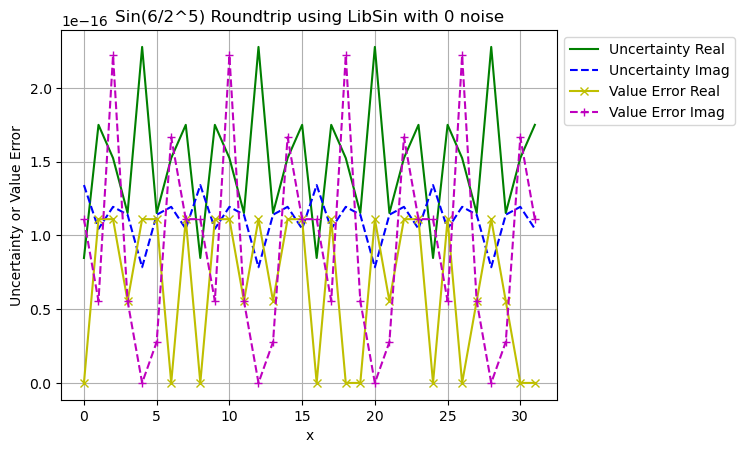

In [461]:
order = 5
freq = 6
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [462]:
PrintNormalizedErrorStat(signal='Sin', order=5, freq=7)

Forward, IndexSin, 1 mean=0.0, std=0.9244195915451688
Forward, IndexSin, 0 mean=-2.6020852139652106e-18, std=0.1970614467378533
Forward, LibSin, 1 mean=0.06286567644745009, std=18.127009116597616
Forward, LibSin, 0 mean=1.0077863282727477, std=11.856288020730888
Reverse, IndexSin, 1 mean=0.0, std=0.40519675816457545
Reverse, IndexSin, 0 mean=0.0, std=0.20845037472909428
Reverse, LibSin, 1 mean=0.0581806336419437, std=1235465849021352.5
Reverse, LibSin, 0 mean=-0.8603723105545291, std=18.14850396395283
Roundtrip, IndexSin, 1 mean=-1.734723475976807e-18, std=0.3063617050197851
Roundtrip, IndexSin, 0 mean=0.0, std=0.3694261228303397
Roundtrip, LibSin, 1 mean=5.551115123125783e-17, std=1.0398504507776185
Roundtrip, LibSin, 0 mean=0.007550002619969003, std=0.6374357692319307


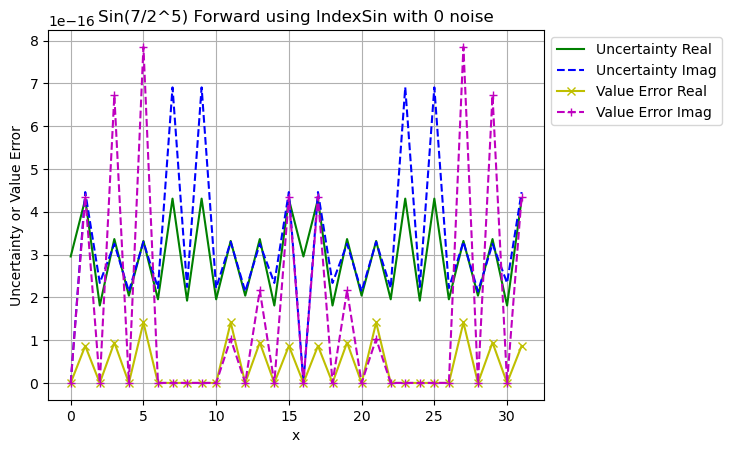

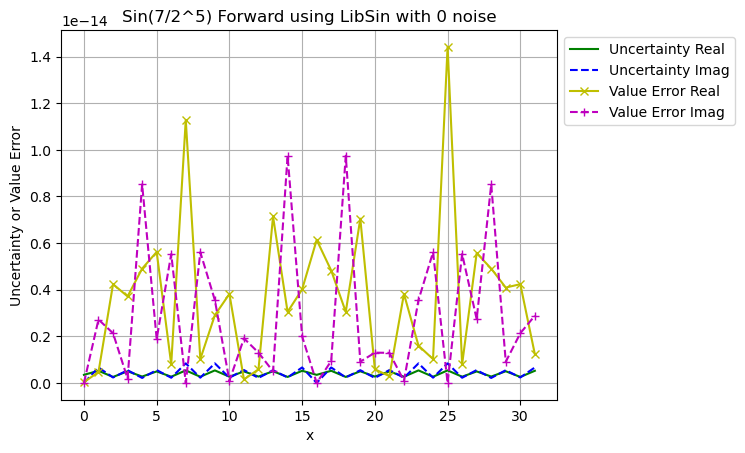

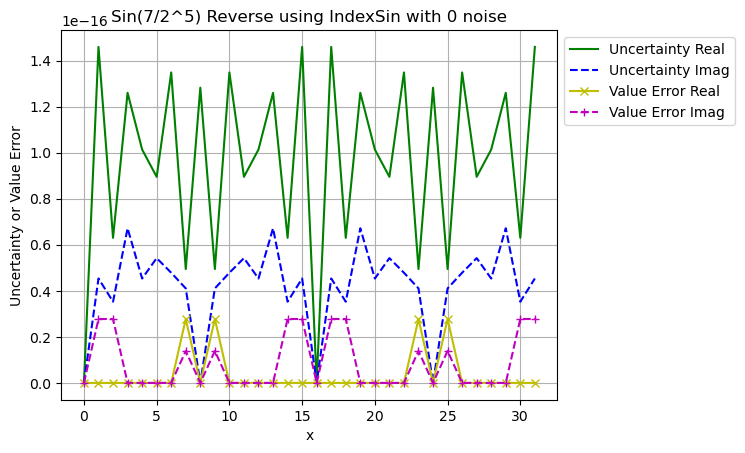

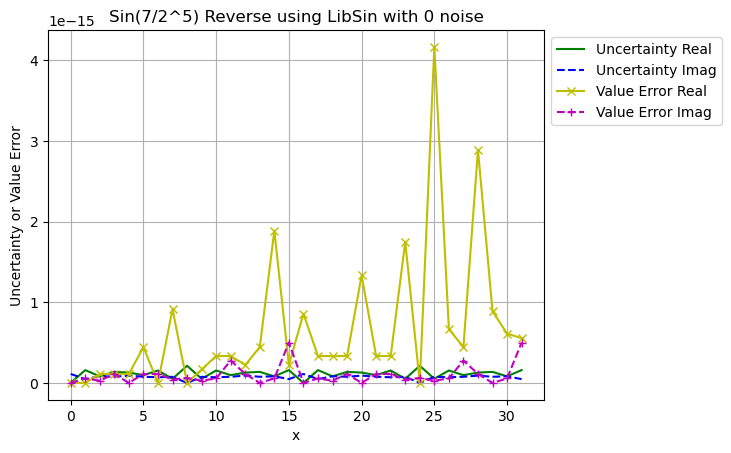

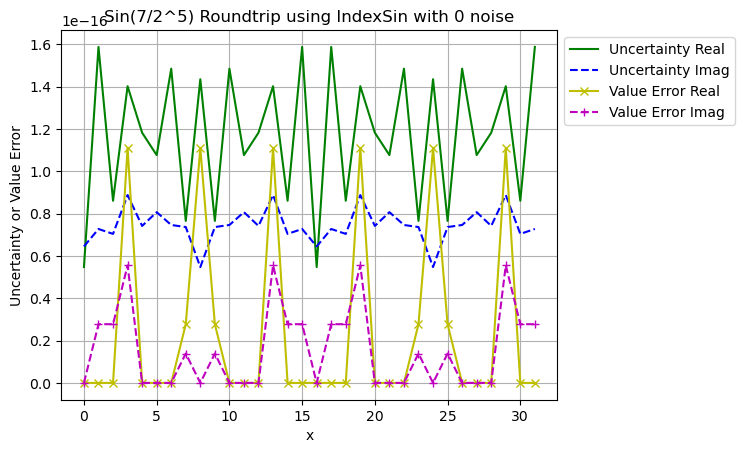

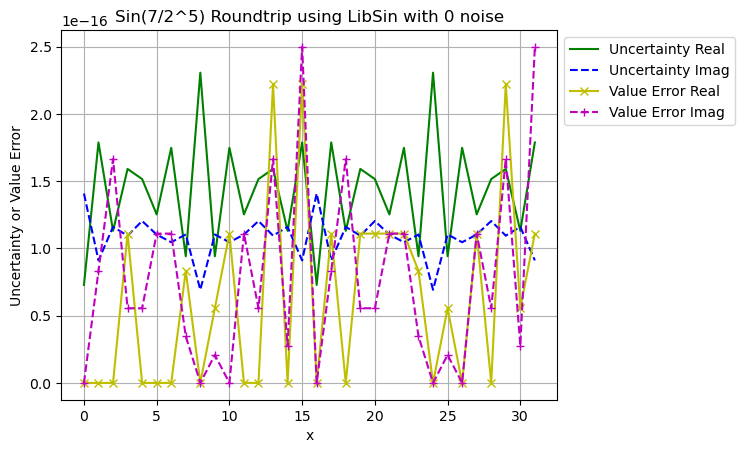

In [463]:
order = 5
freq = 7
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

## Order = 6

In [464]:
PrintNormalizedErrorStat(signal='Sin', order=6, freq=1)

Forward, IndexSin, 1 mean=-8.953411488912552e-19, std=0.7780380176638308
Forward, IndexSin, 0 mean=-0.000136249478487456, std=0.4054469668714736
Forward, LibSin, 1 mean=0.056895546568915635, std=2.1964551729427018
Forward, LibSin, 0 mean=0.04813994374755487, std=3.495235327720783
Reverse, IndexSin, 1 mean=-5.551115123125783e-18, std=0.5535442372461187
Reverse, IndexSin, 0 mean=1.7906822977825105e-17, std=0.399053871242175
Reverse, LibSin, 1 mean=0.021285869783355275, std=827365219860039.2
Reverse, LibSin, 0 mean=-0.07045346316962953, std=2.2948046248411784
Roundtrip, IndexSin, 1 mean=-7.806255641895632e-18, std=0.35967356711352594
Roundtrip, IndexSin, 0 mean=0.0, std=0.4192512506132883
Roundtrip, LibSin, 1 mean=-1.1275702593849246e-17, std=1.022399584464586
Roundtrip, LibSin, 0 mean=-0.03917884594905584, std=0.9543210577746865


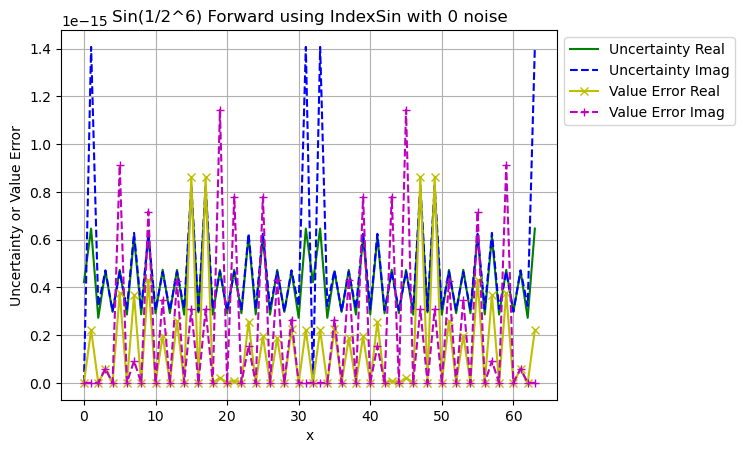

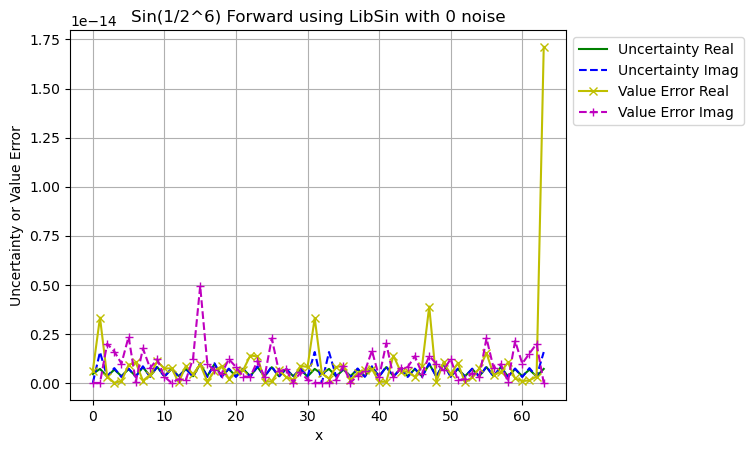

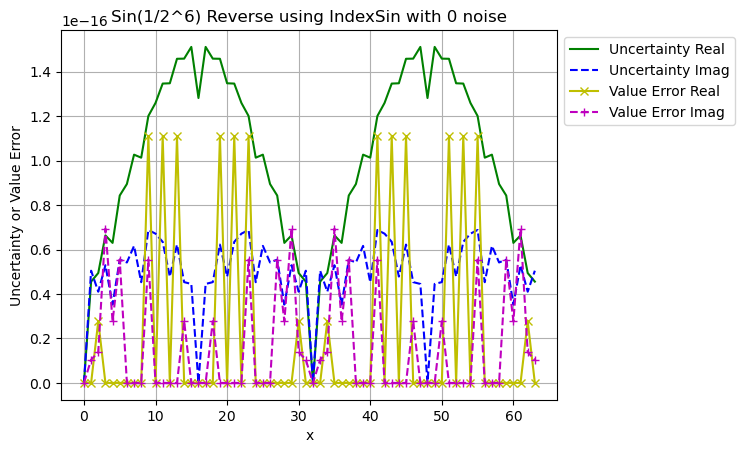

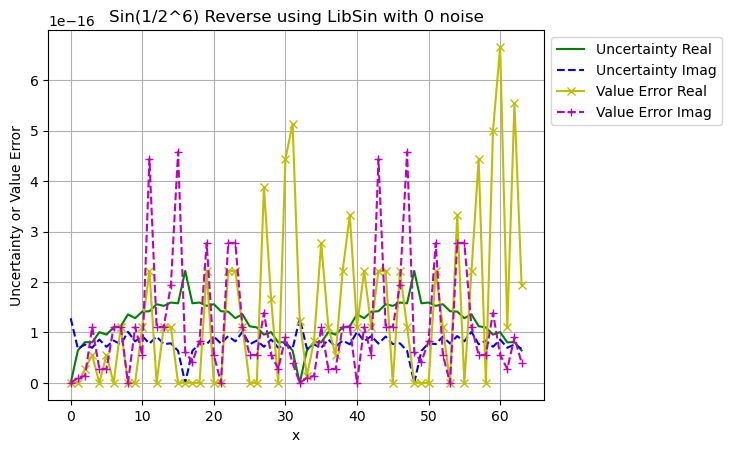

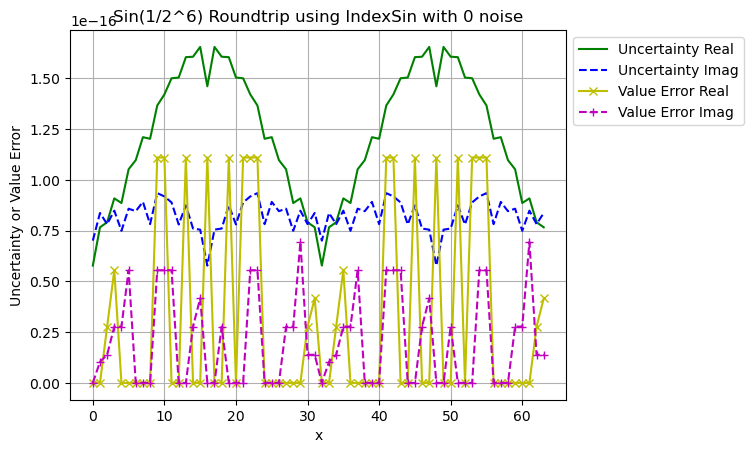

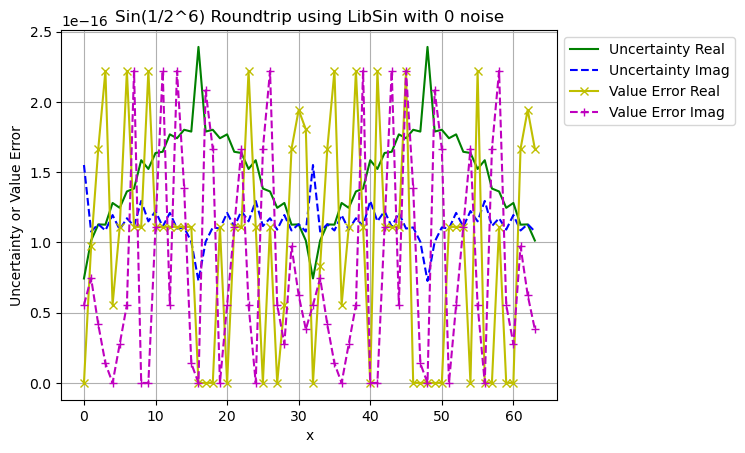

In [465]:
order = 6
freq = 1
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [466]:
PrintNormalizedErrorStat(signal='Sin', order=6, freq=2)

Forward, IndexSin, 1 mean=-1.7906822977825105e-18, std=0.7045080125190895
Forward, IndexSin, 0 mean=0.0, std=0.15394263378739836
Forward, LibSin, 1 mean=6.446456272017038e-17, std=2.904348463357037
Forward, LibSin, 0 mean=0.2661398562139351, std=4.421000726600048
Reverse, IndexSin, 1 mean=-9.912705577010326e-19, std=0.4014962536372798
Reverse, IndexSin, 0 mean=0.0, std=0.20667629672430027
Reverse, LibSin, 1 mean=-0.048304784762688846, std=1225621342739687.5
Reverse, LibSin, 0 mean=-0.0812066494435583, std=3.7133573702466474
Roundtrip, IndexSin, 1 mean=-2.168404344971009e-18, std=0.3027769777491358
Roundtrip, IndexSin, 0 mean=0.0, std=0.3669307713591472
Roundtrip, LibSin, 1 mean=-1.1709383462843448e-17, std=0.825240821467555
Roundtrip, LibSin, 0 mean=-0.0445393479865055, std=1.1607601629454405


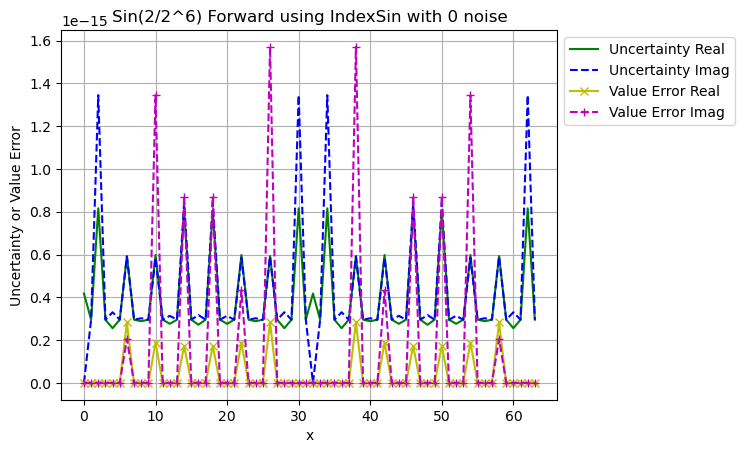

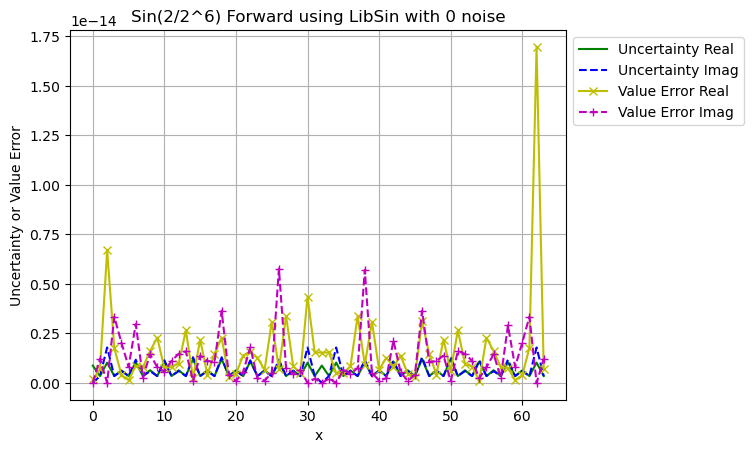

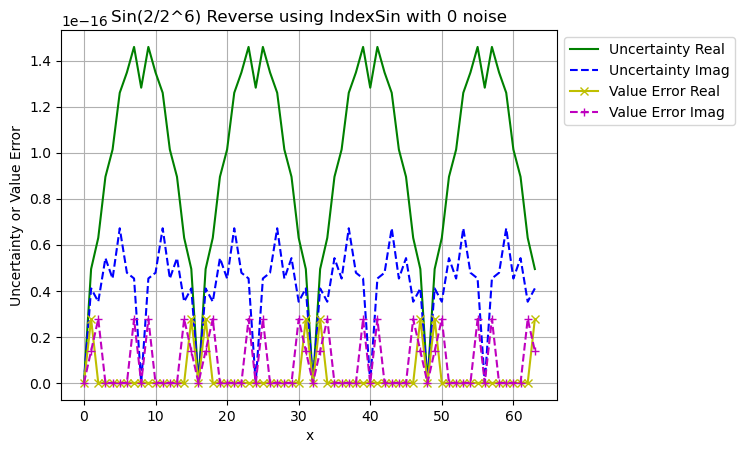

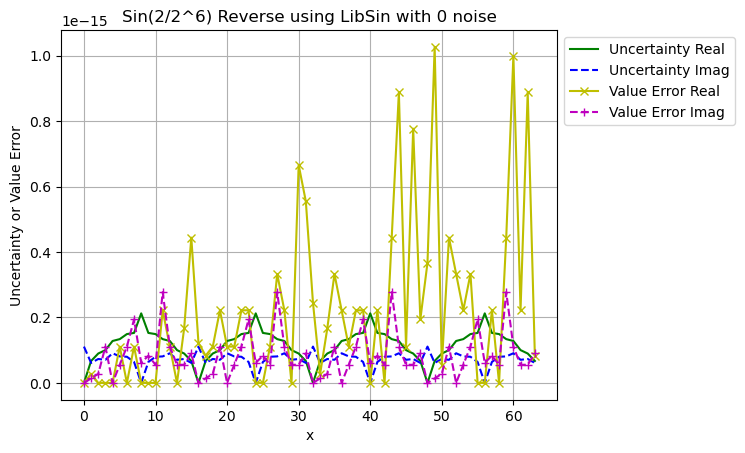

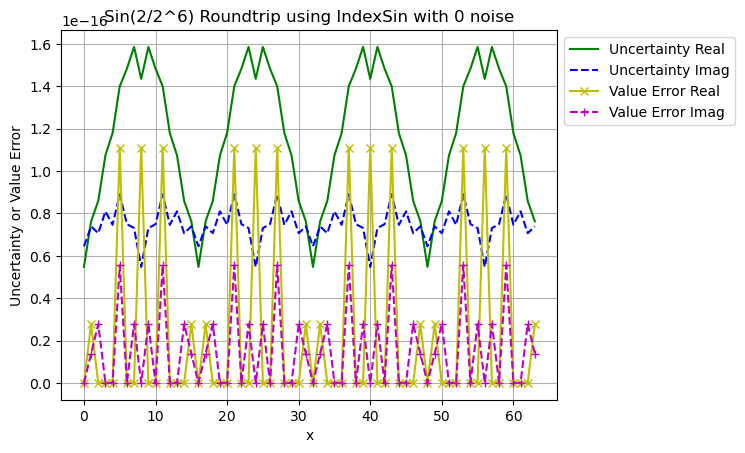

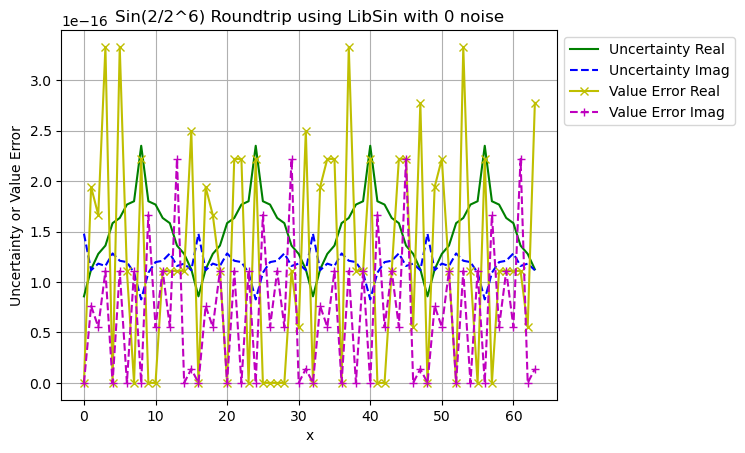

In [467]:
order = 6
freq = 2
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [468]:
PrintNormalizedErrorStat(signal='Sin', order=6, freq=3)

Forward, IndexSin, 1 mean=-7.162729191130042e-18, std=0.9291361897239152
Forward, IndexSin, 0 mean=-0.0029487967459472363, std=0.36583532315329864
Forward, LibSin, 1 mean=0.026487444402032163, std=7.048555237022876
Forward, LibSin, 0 mean=0.4368440999759, std=5.597663122957839
Reverse, IndexSin, 1 mean=1.3877787807814458e-18, std=0.5242453665703024
Reverse, IndexSin, 0 mean=0.0, std=0.5443075073599494
Reverse, LibSin, 1 mean=-0.0008442611761227369, std=827365219860039.2
Reverse, LibSin, 0 mean=-0.23654296252338605, std=5.730748215556441
Roundtrip, IndexSin, 1 mean=9.540979117872439e-18, std=0.5102693249469231
Roundtrip, IndexSin, 0 mean=0.0, std=0.5130615412411228
Roundtrip, LibSin, 1 mean=-5.551115123125783e-17, std=1.3288792206236852
Roundtrip, LibSin, 0 mean=0.005744212866268098, std=0.7975134612484202


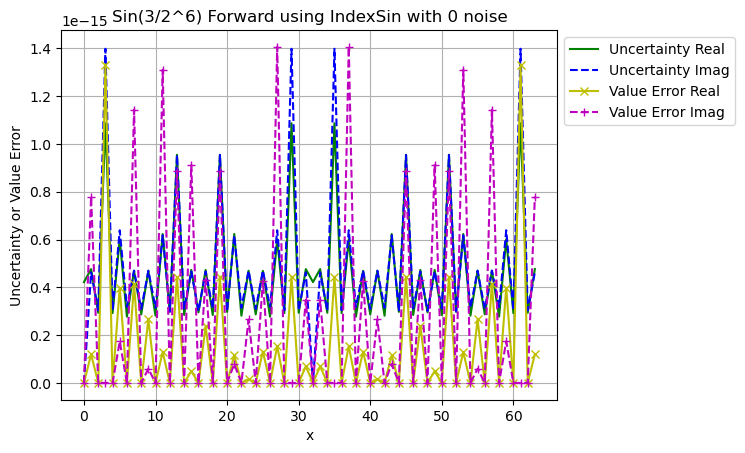

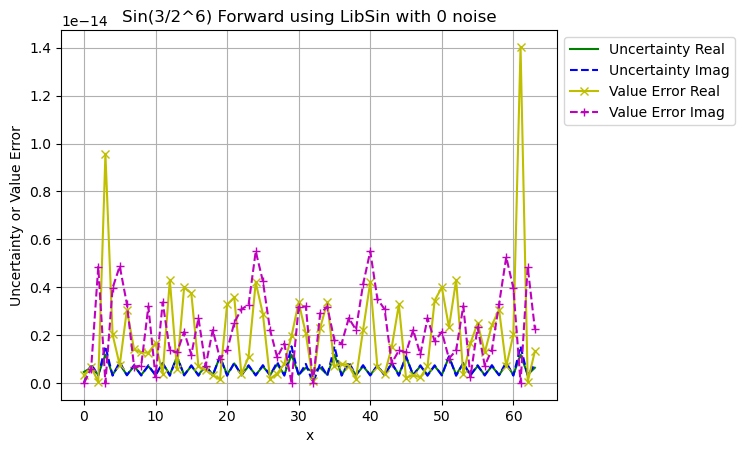

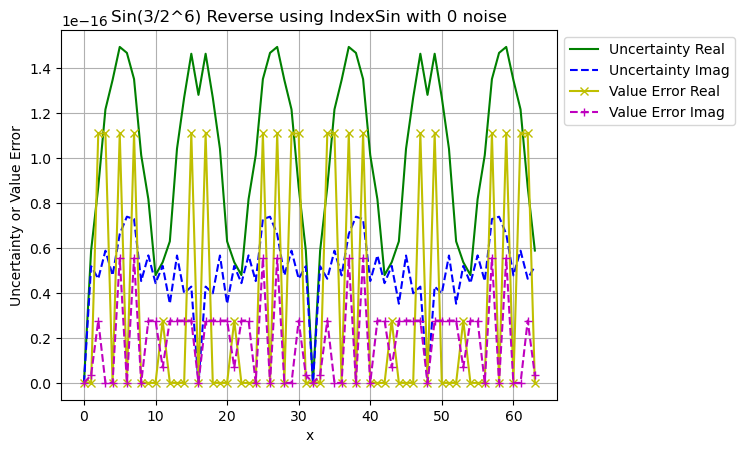

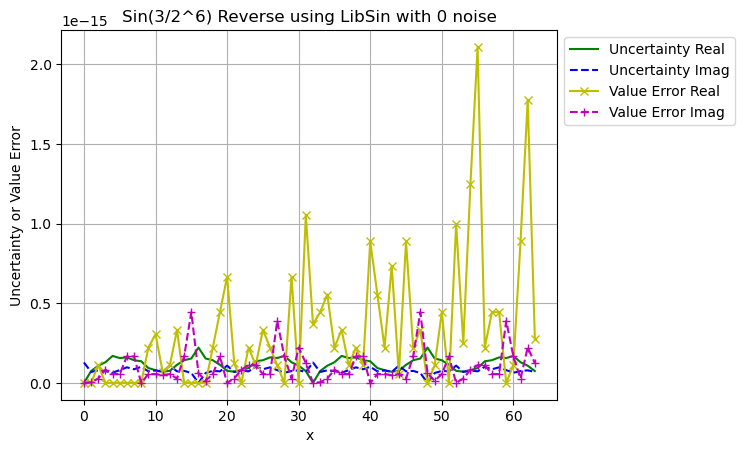

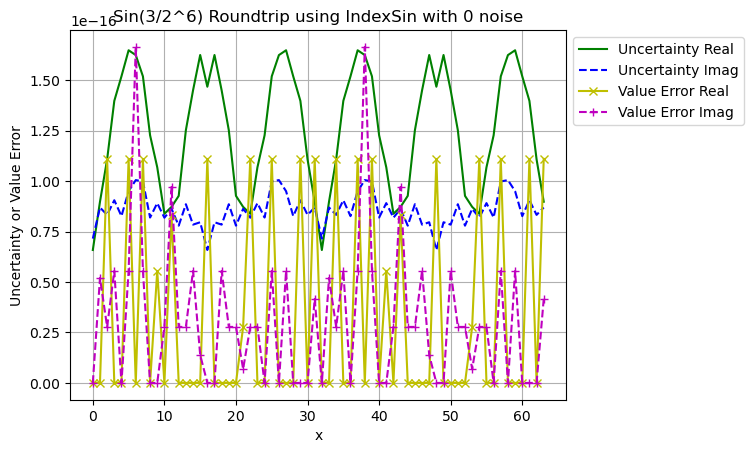

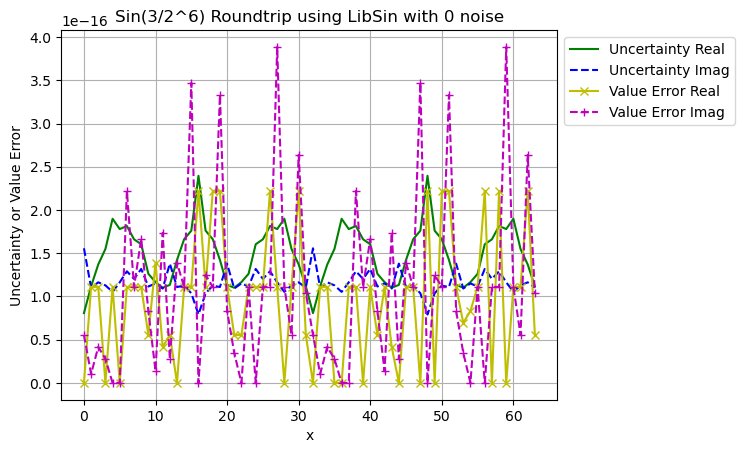

In [469]:
order = 6
freq = 3
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [470]:
PrintNormalizedErrorStat(signal='Sin', order=6, freq=4)

Forward, IndexSin, 1 mean=0.0, std=0.5916262925600858
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=-0.03237156723851637, std=5.801950854404894
Forward, LibSin, 0 mean=0.5970797654469796, std=7.252810626308775
Reverse, IndexSin, 1 mean=0.0, std=0.4592063873088374
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-0.06598636891831597, std=1824218872014730.5
Reverse, LibSin, 0 mean=-0.6206945876384179, std=7.453776632652881
Roundtrip, IndexSin, 1 mean=0.0, std=0.21763829378275343
Roundtrip, IndexSin, 0 mean=0.0, std=0.2830839795191104
Roundtrip, LibSin, 1 mean=8.673617379884035e-19, std=0.4383919428058259
Roundtrip, LibSin, 0 mean=0.023598314137679016, std=0.8217977642234312


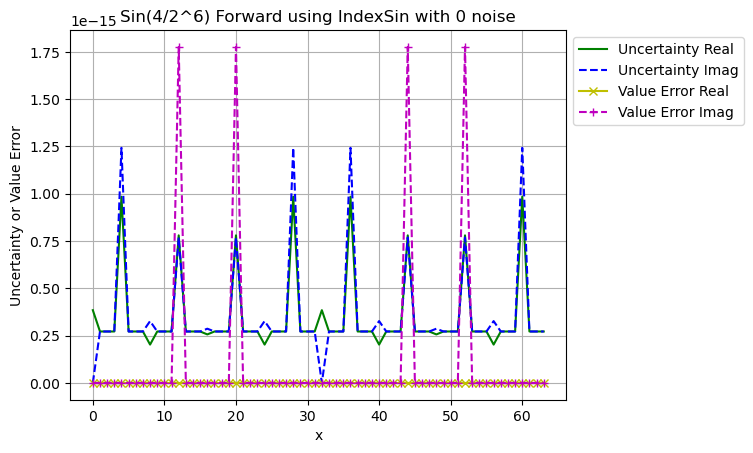

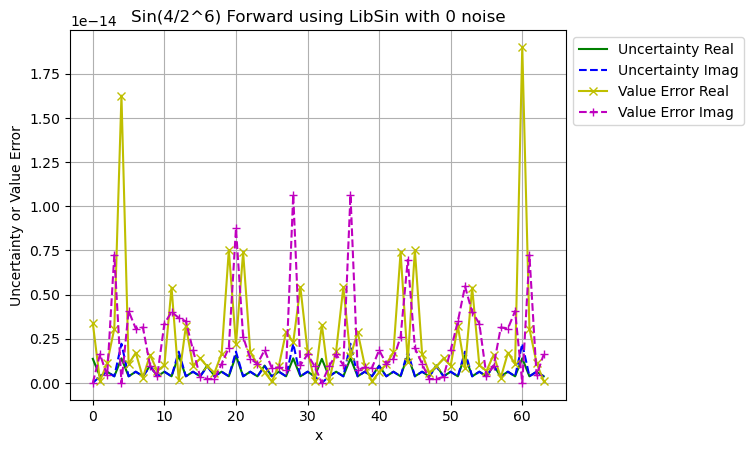

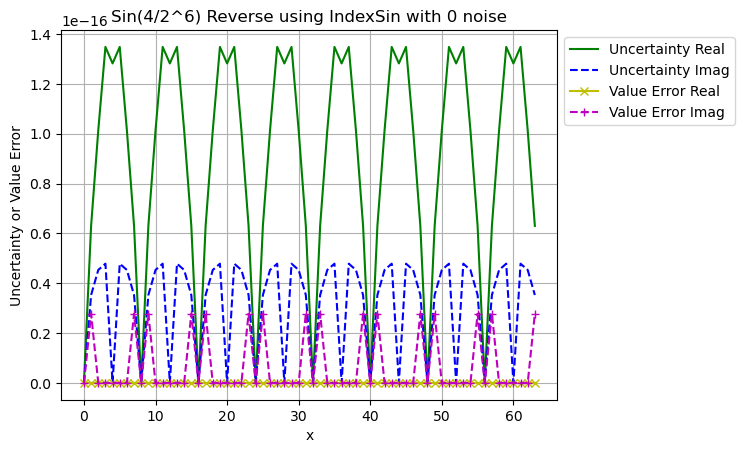

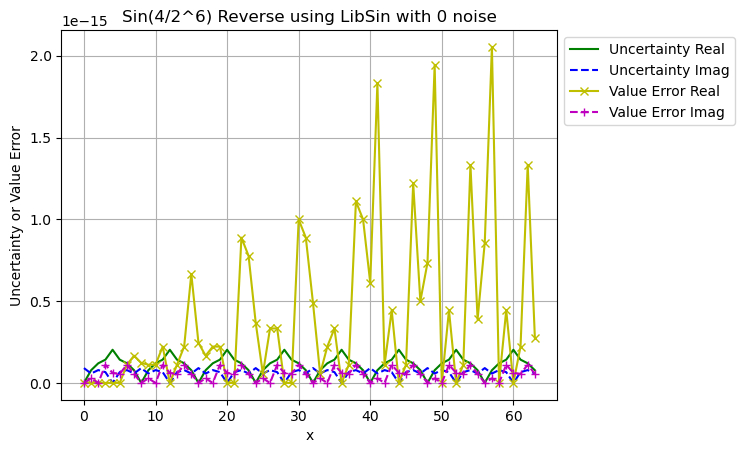

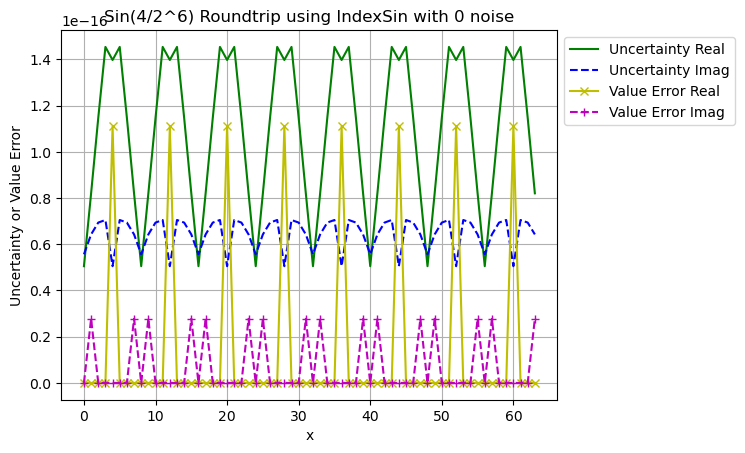

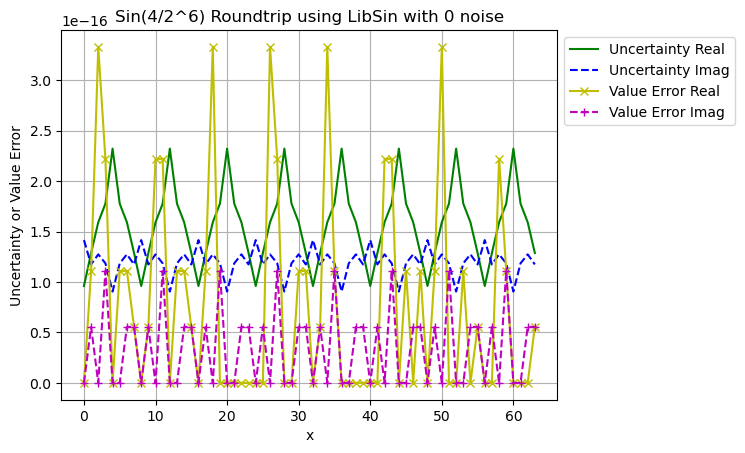

In [471]:
order = 6
freq = 4
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [472]:
PrintNormalizedErrorStat(signal='Sin', order=6, freq=5)

Forward, IndexSin, 1 mean=3.581364595565021e-18, std=0.8402964696209317
Forward, IndexSin, 0 mean=0.004783634246591452, std=0.5969321560502866
Forward, LibSin, 1 mean=-0.02056805290154538, std=6.112468092344297
Forward, LibSin, 0 mean=1.0022957814109215, std=10.335266480351715
Reverse, IndexSin, 1 mean=9.251858538542971e-19, std=0.6495904800173559
Reverse, IndexSin, 0 mean=3.581364595565021e-18, std=0.5887975014839569
Reverse, LibSin, 1 mean=0.02901168986953187, std=827365219860039.2
Reverse, LibSin, 0 mean=1.1241454515903044, std=8.298095113135568
Roundtrip, IndexSin, 1 mean=4.336808689942018e-18, std=0.5620690794648486
Roundtrip, IndexSin, 0 mean=6.938893903907228e-18, std=0.8198267469353165
Roundtrip, LibSin, 1 mean=-1.0408340855860843e-17, std=1.1432351485732684
Roundtrip, LibSin, 0 mean=0.04292343849354602, std=0.881045814047851


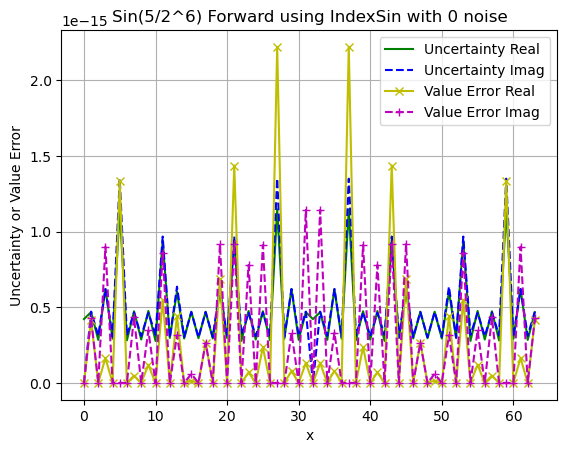

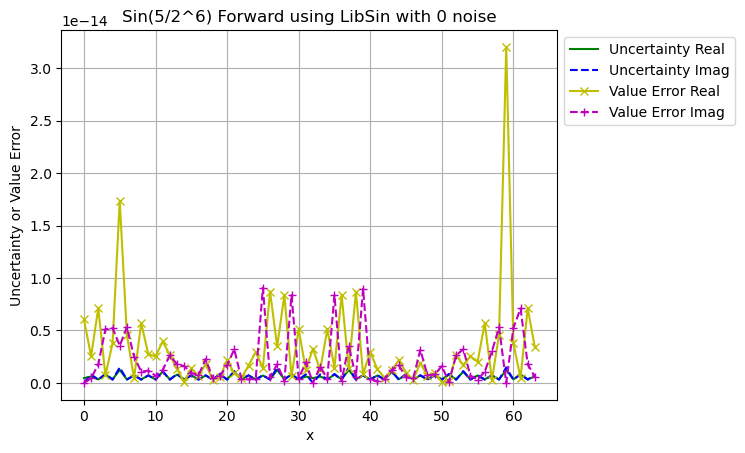

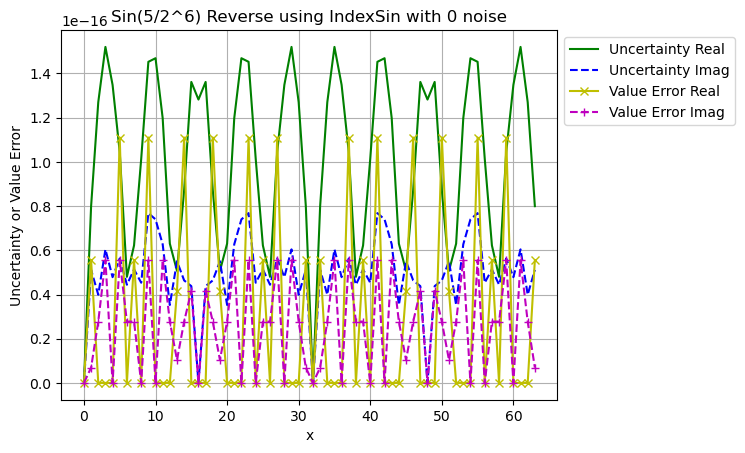

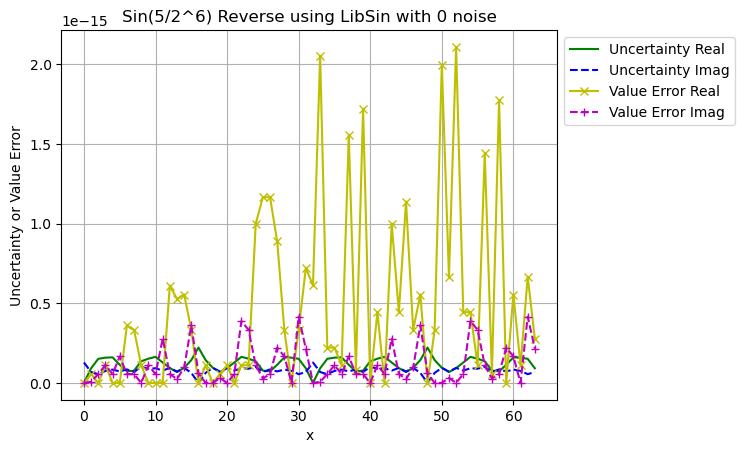

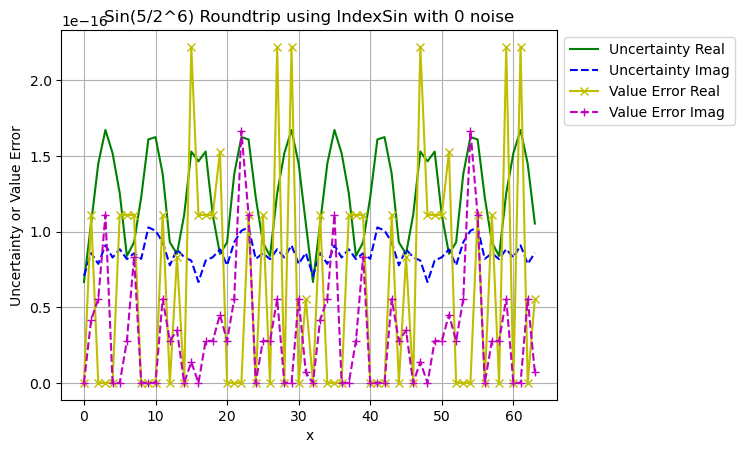

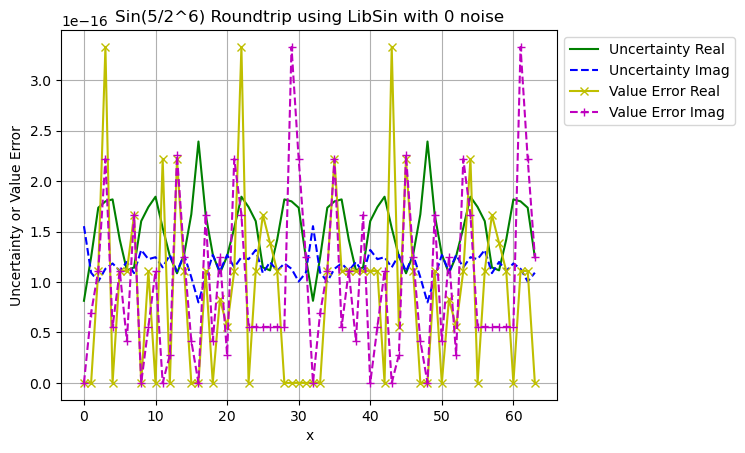

In [473]:
order = 6
freq = 5
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [474]:
PrintNormalizedErrorStat(signal='Sin', order=6, freq=6)

Forward, IndexSin, 1 mean=1.7906822977825105e-17, std=0.788203276860265
Forward, IndexSin, 0 mean=-2.6020852139652106e-18, std=0.24013211580576116
Forward, LibSin, 1 mean=-0.029304254221587757, std=12.331832230044624
Forward, LibSin, 0 mean=1.0356812846167962, std=9.788135496980082
Reverse, IndexSin, 1 mean=0.0, std=0.5190414811870989
Reverse, IndexSin, 0 mean=0.0, std=0.46867217328111777
Reverse, LibSin, 1 mean=-0.034693908882918734, std=1225621342739687.5
Reverse, LibSin, 0 mean=-0.1584603690668181, std=11.460604946818965
Roundtrip, IndexSin, 1 mean=4.336808689942018e-18, std=0.5463776766955061
Roundtrip, IndexSin, 0 mean=-3.469446951953614e-18, std=0.4765764215316845
Roundtrip, LibSin, 1 mean=0.0, std=0.9241182182270327
Roundtrip, LibSin, 0 mean=-0.04863030204774296, std=1.1851928943637944


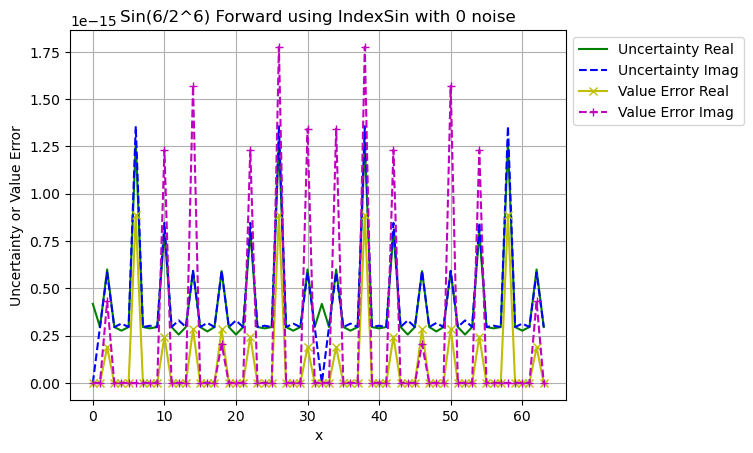

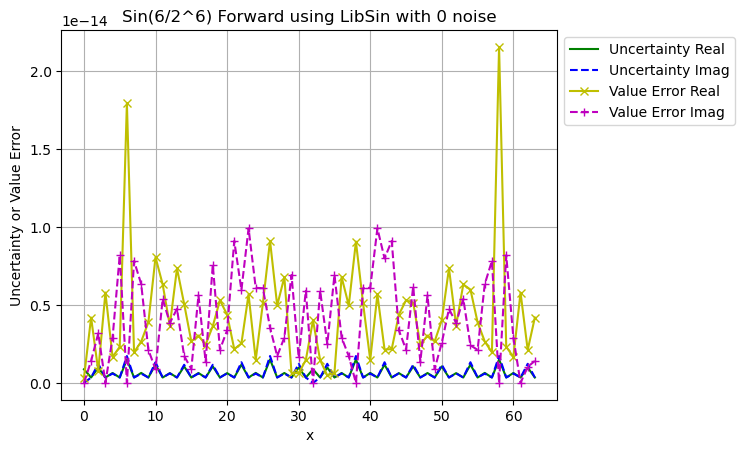

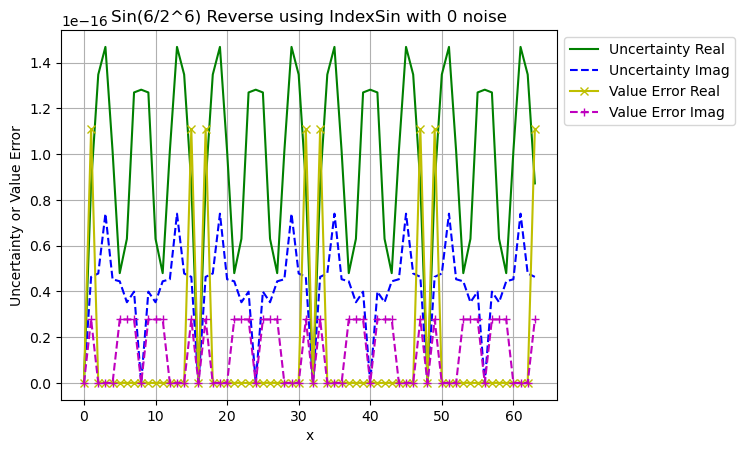

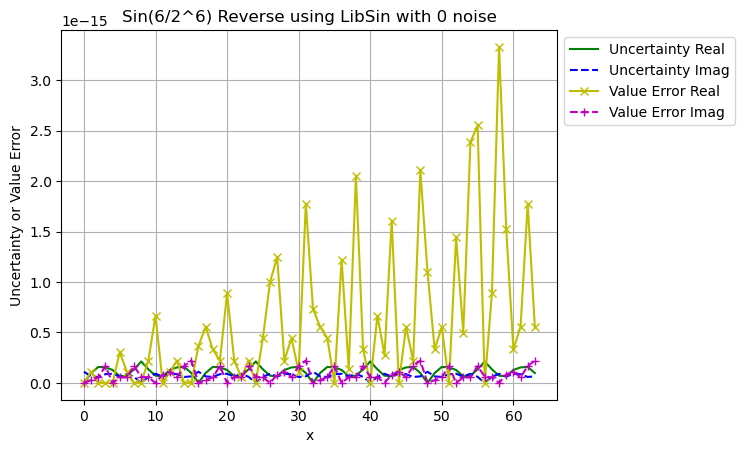

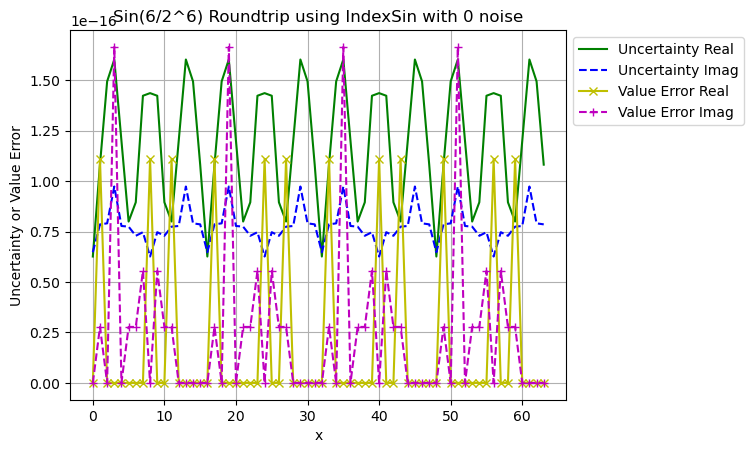

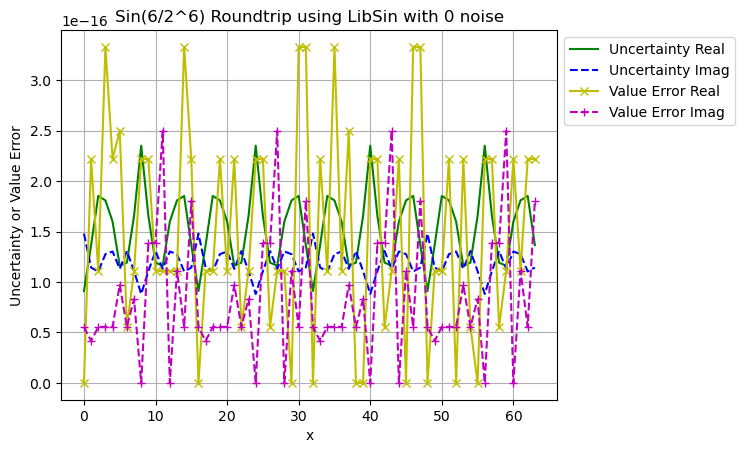

In [475]:
order = 6
freq = 6
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [476]:
PrintNormalizedErrorStat(signal='Sin', order=6, freq=7)

Forward, IndexSin, 1 mean=7.162729191130042e-18, std=0.8326690881365627
Forward, IndexSin, 0 mean=8.552641310882216e-05, std=0.31821175309799277
Forward, LibSin, 1 mean=0.0435985666363091, std=14.829218532576999
Forward, LibSin, 0 mean=1.2137414995676674, std=11.977833656186966
Reverse, IndexSin, 1 mean=0.0, std=0.8329081083543474
Reverse, IndexSin, 0 mean=1.4325458382260084e-17, std=0.45748406156593074
Reverse, LibSin, 1 mean=-0.011852085796555209, std=827365219860039.2
Reverse, LibSin, 0 mean=-1.075323026696307, std=14.104157445954499
Roundtrip, IndexSin, 1 mean=7.37257477290143e-18, std=0.6024048699812158
Roundtrip, IndexSin, 0 mean=5.204170427930421e-18, std=0.5479882275596765
Roundtrip, LibSin, 1 mean=-1.9081958235744878e-17, std=1.120517820145404
Roundtrip, LibSin, 0 mean=-0.03900502533448816, std=0.6936389653925625


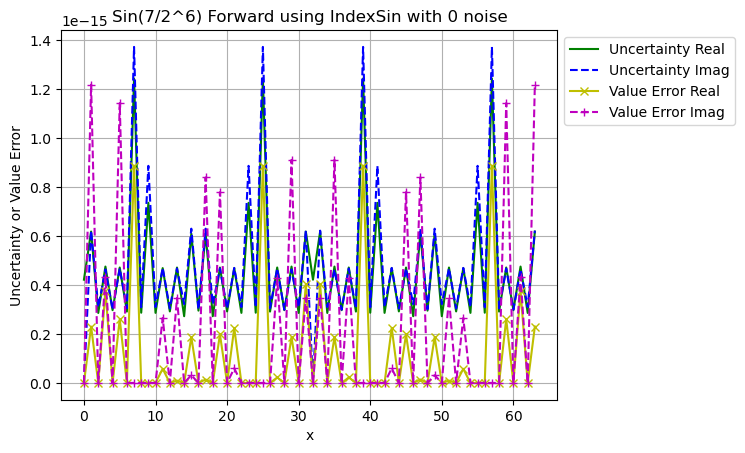

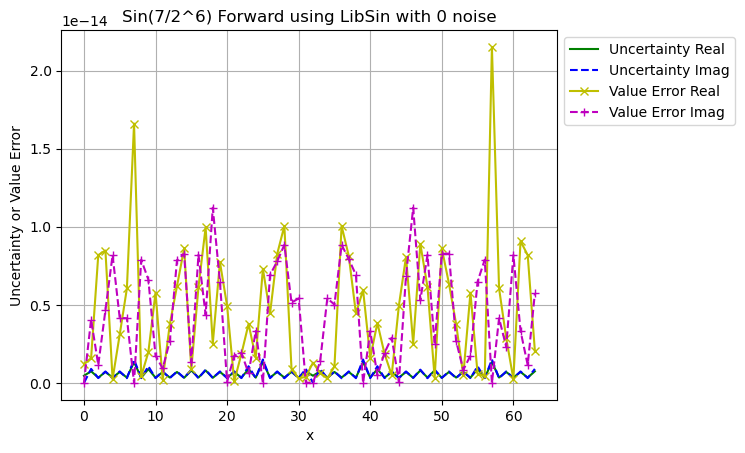

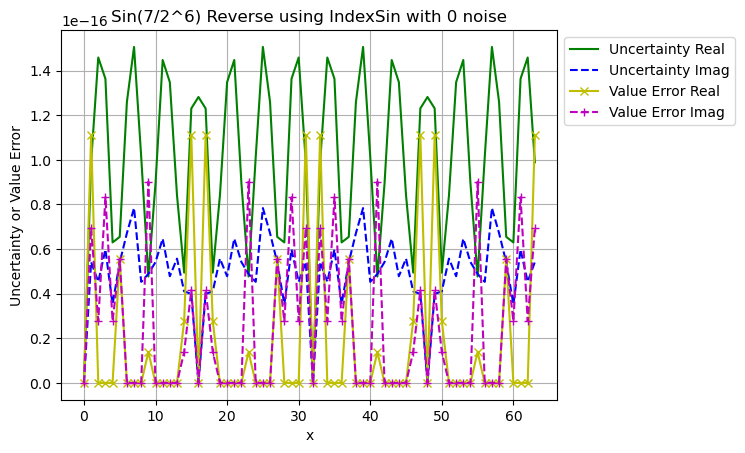

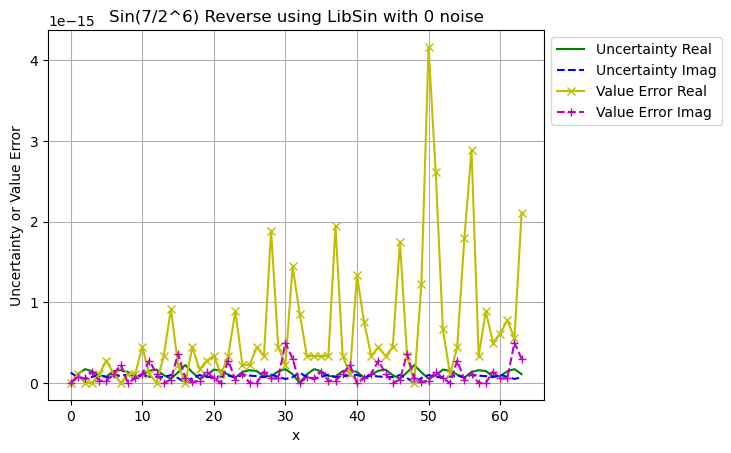

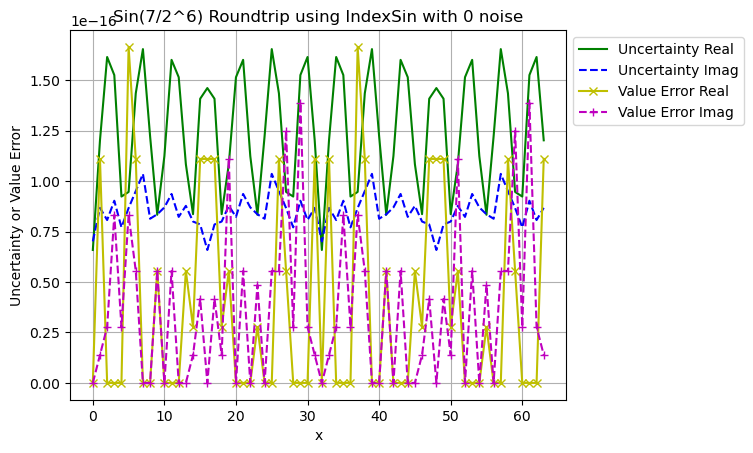

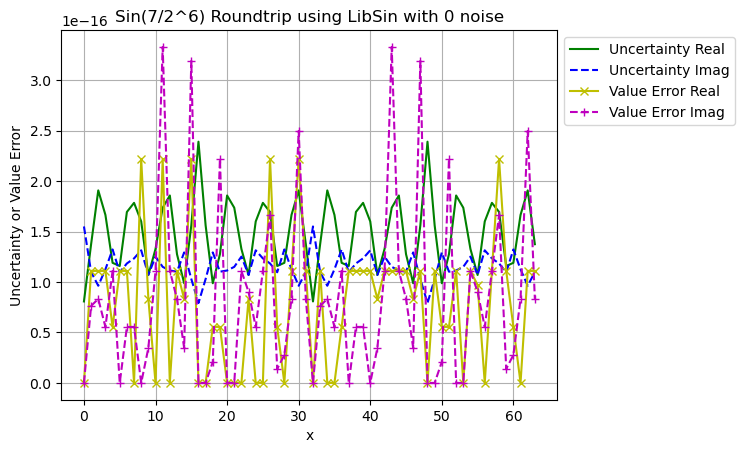

In [477]:
order = 6
freq = 7
signal = 'Sin'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

# Cos

In [478]:
PrintNormalizedErrorStat(signal='Cos', order=4, freq=1)

Forward, IndexSin, 1 mean=0.0, std=0.0
Forward, IndexSin, 0 mean=-0.5006330771226797, std=0.8955596737849654
Forward, LibSin, 1 mean=0.011067218090556061, std=3.336491423417254
Forward, LibSin, 0 mean=0.040518171110056594, std=1.6242758276379035
Reverse, IndexSin, 1 mean=0.0, std=0.47460303481450294
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-1.586032892321652e-17, std=0.8138252701191936
Reverse, LibSin, 0 mean=1378940136605771.2, std=8893896640631792.0
Roundtrip, IndexSin, 1 mean=0.0, std=0.22582732401361805
Roundtrip, IndexSin, 0 mean=0.0, std=0.29007476007642397
Roundtrip, LibSin, 1 mean=0.0, std=0.5594540427223025
Roundtrip, LibSin, 0 mean=0.0764800350973188, std=0.45481895242359976


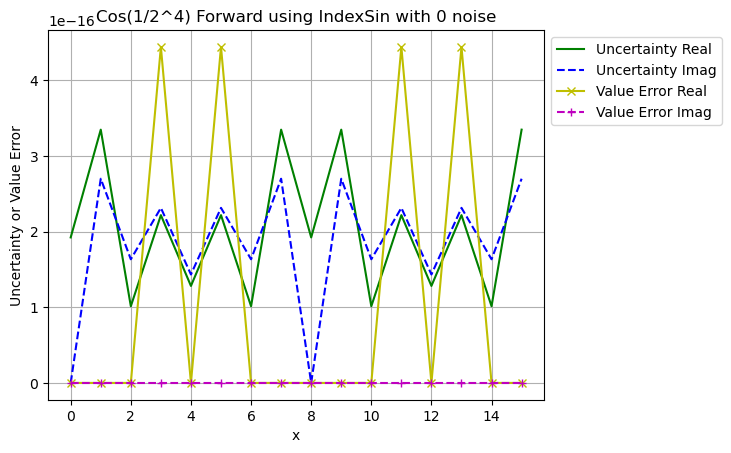

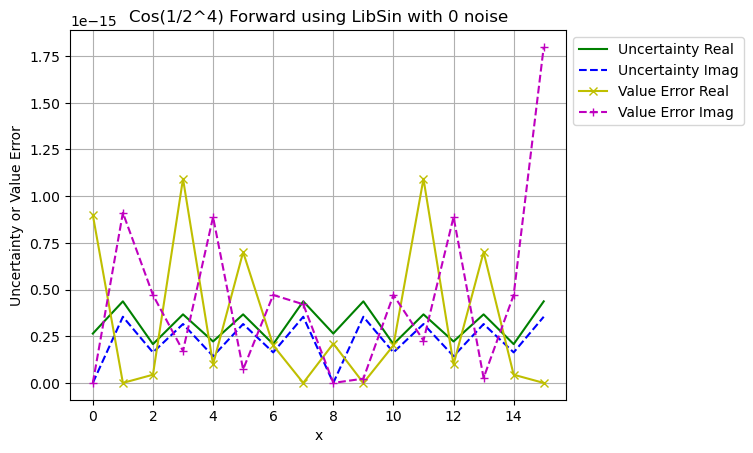

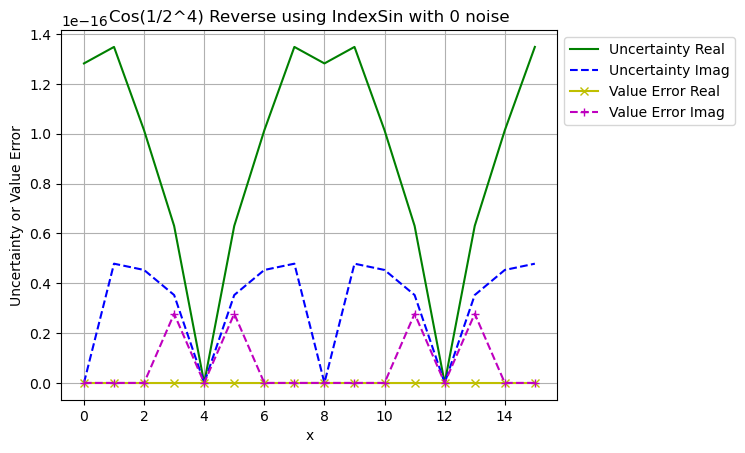

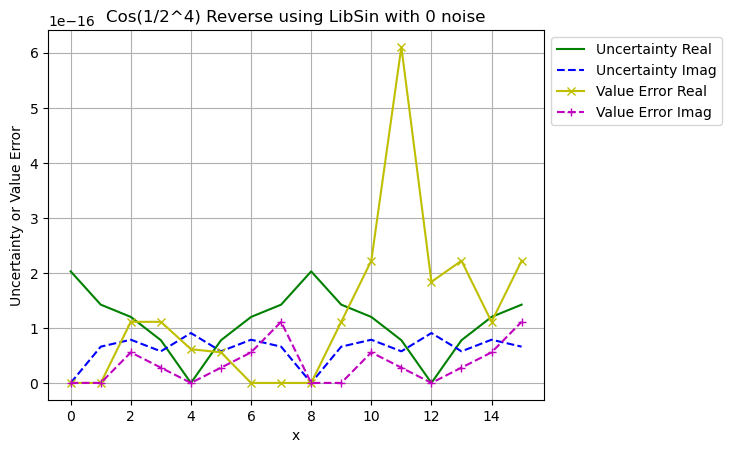

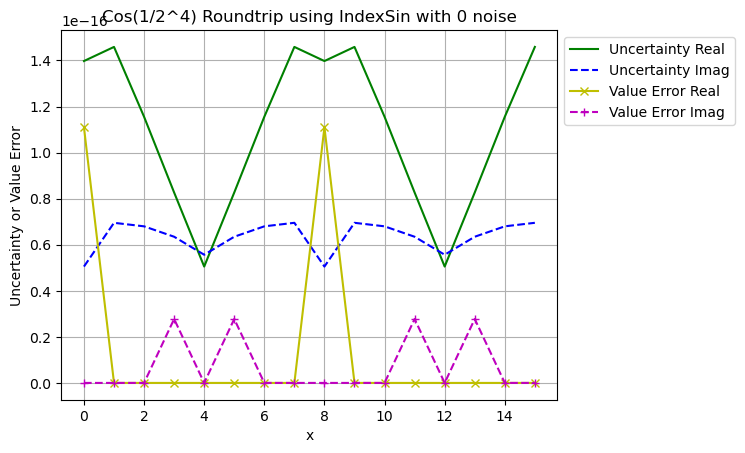

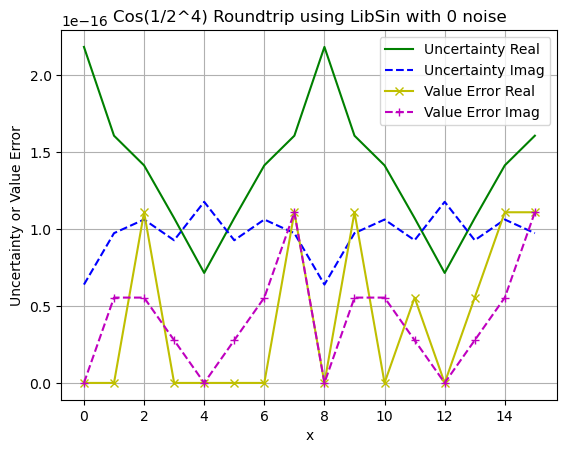

In [479]:
order = 4
freq = 1
signal = 'Cos'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [480]:
PrintNormalizedErrorStat(signal='Cos', order=4, freq=2)

Forward, IndexSin, 1 mean=0.0, std=0.0
Forward, IndexSin, 0 mean=-0.44262666813799045, std=1.125137354252389
Forward, LibSin, 1 mean=1.2688263138573217e-16, std=4.676691153107459
Forward, LibSin, 0 mean=-0.02906164547602813, std=2.7257402560126245
Reverse, IndexSin, 1 mean=0.0, std=0.0
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=0.0, std=0.7385489458759964
Reverse, LibSin, 0 mean=3900231685776979.0, std=3.669811981127194e+16
Roundtrip, IndexSin, 1 mean=0.0, std=0.0
Roundtrip, IndexSin, 0 mean=0.0, std=0.42163702135578385
Roundtrip, LibSin, 1 mean=-1.3877787807814457e-17, std=0.8834522085987725
Roundtrip, LibSin, 0 mean=0.09743547036924476, std=0.6898908370812062


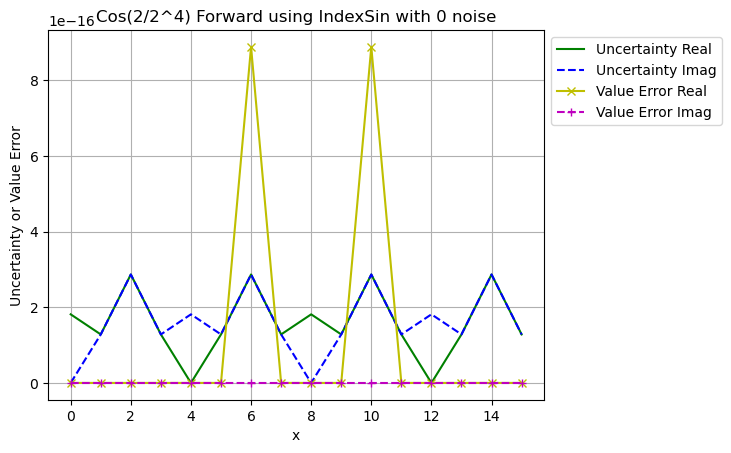

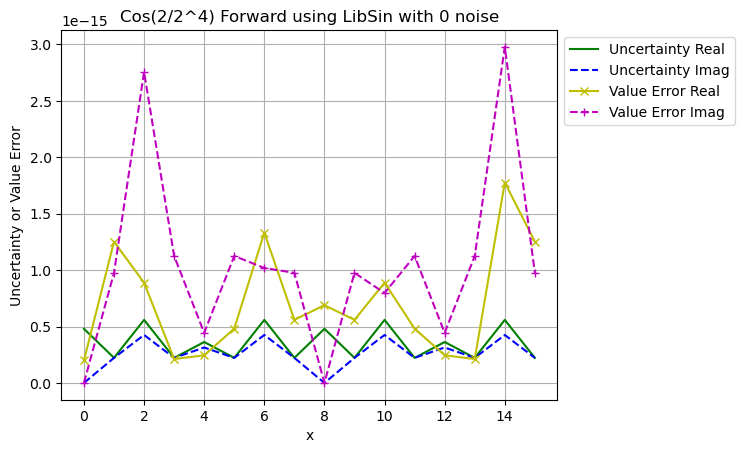

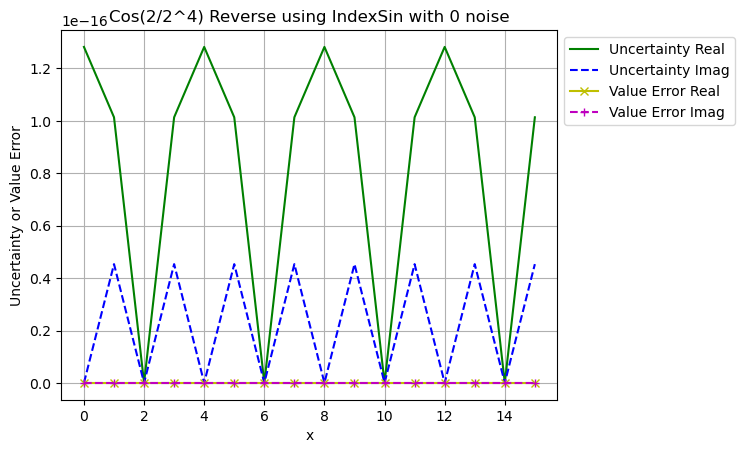

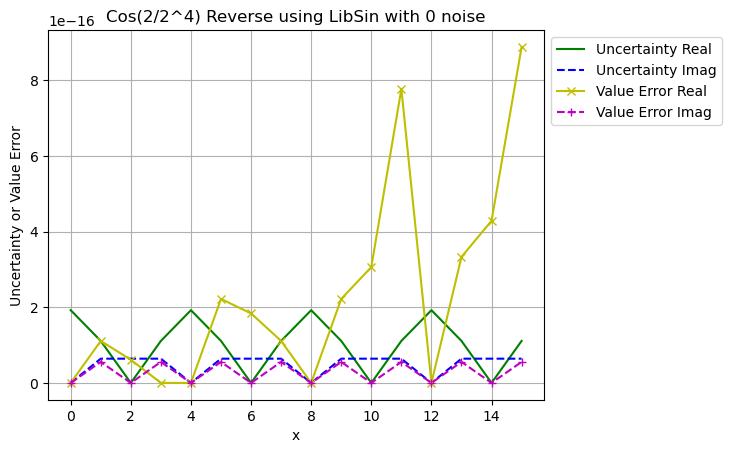

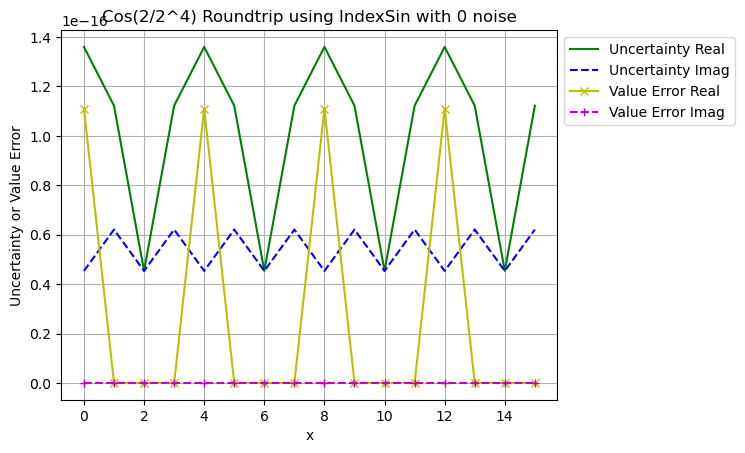

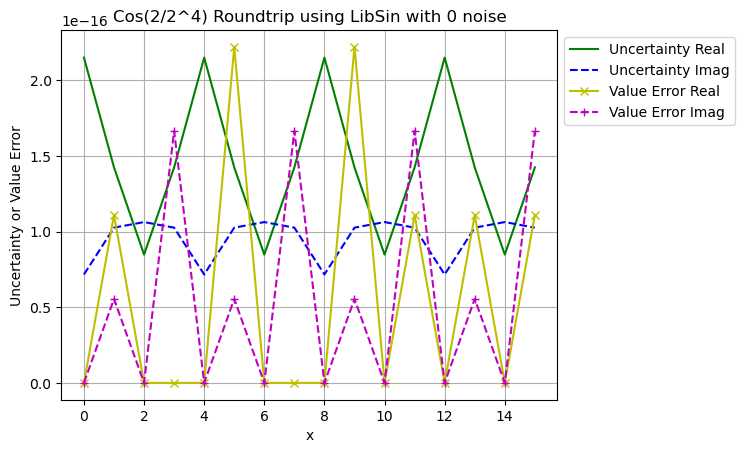

In [481]:
order = 4
freq = 2
signal = 'Cos'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [482]:
PrintNormalizedErrorStat(signal='Cos', order=4, freq=3)

Forward, IndexSin, 1 mean=0.0, std=0.0
Forward, IndexSin, 0 mean=-0.5006330771226797, std=0.8955596737849653
Forward, LibSin, 1 mean=-0.008611426047431576, std=5.1606788294189965
Forward, LibSin, 0 mean=-0.029752500450438646, std=3.8303922262405687
Reverse, IndexSin, 1 mean=0.0, std=0.47460303481450294
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=-1.586032892321652e-17, std=1.5843980182547333
Reverse, LibSin, 0 mean=-4136820409817314.0, std=2.6681689921895384e+16
Roundtrip, IndexSin, 1 mean=0.0, std=0.22582732401361805
Roundtrip, IndexSin, 0 mean=0.0, std=0.29007476007642397
Roundtrip, LibSin, 1 mean=6.938893903907228e-18, std=0.4070940281682875
Roundtrip, LibSin, 0 mean=0.08410294102858358, std=0.8506430814819764


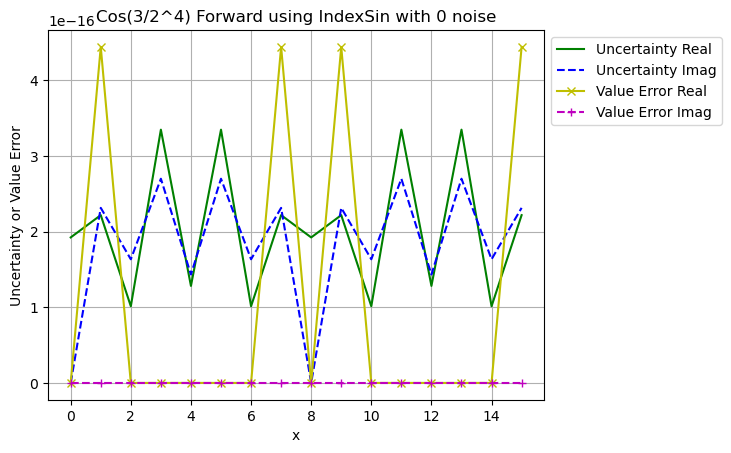

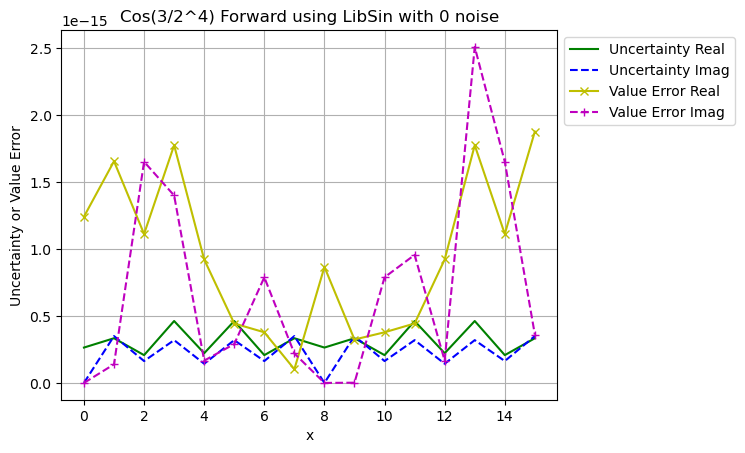

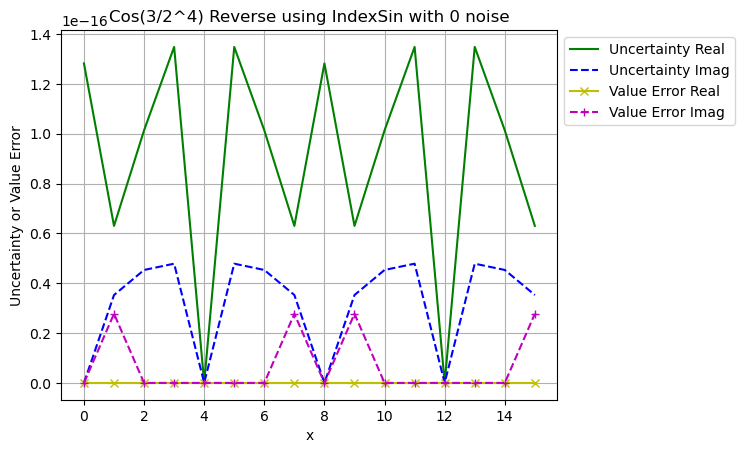

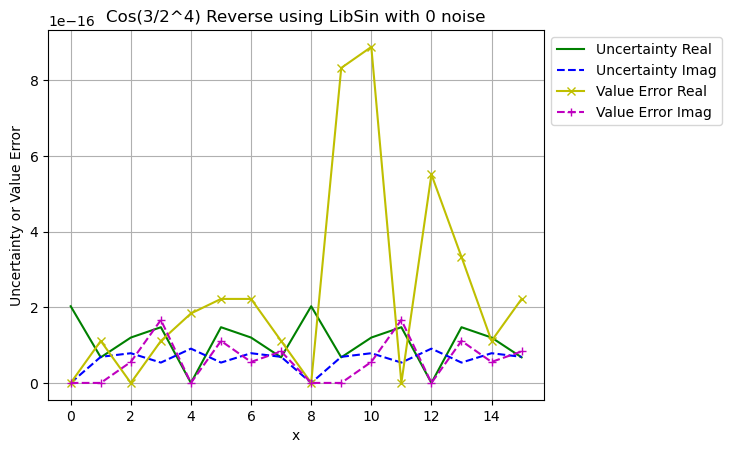

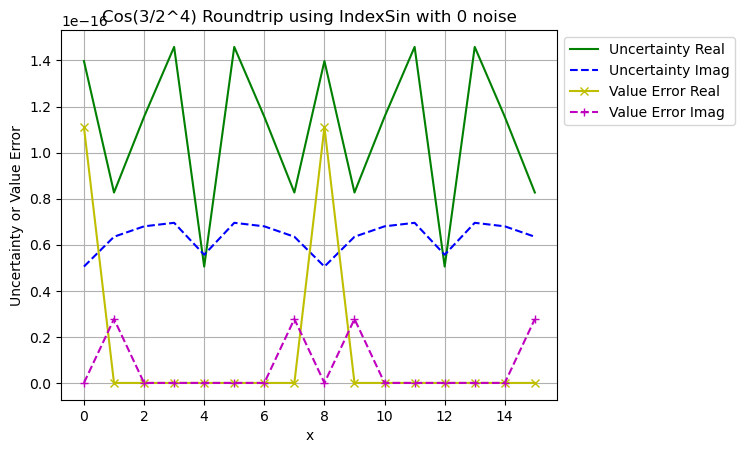

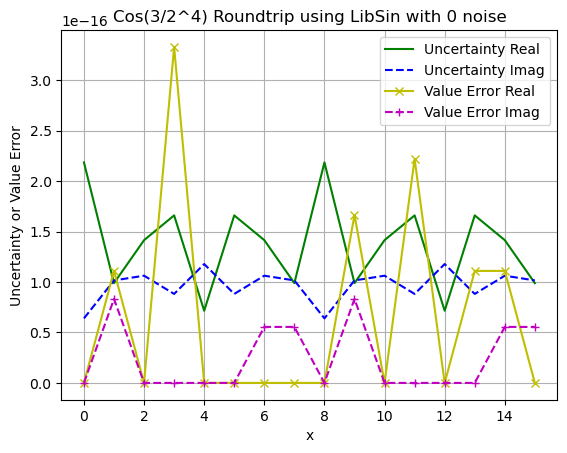

In [483]:
order = 4
freq = 3
signal = 'Cos'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [484]:
PrintNormalizedErrorStat(signal='Cos', order=4, freq=4)

Forward, IndexSin, 1 mean=nan, std=nan
Forward, IndexSin, 0 mean=nan, std=nan
Forward, LibSin, 1 mean=-0.0010906076745276852, std=1910337965697419.0
Forward, LibSin, 0 mean=-1.1102230246251565e-16, std=6.628312303976645
Reverse, IndexSin, 1 mean=nan, std=nan
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=nan, std=nan
Reverse, LibSin, 0 mean=0.0, std=0.0
Roundtrip, IndexSin, 1 mean=nan, std=nan
Roundtrip, IndexSin, 0 mean=0.0, std=0.0
Roundtrip, LibSin, 1 mean=-2.465190328815662e-32, std=8.937524502074011e-16
Roundtrip, LibSin, 0 mean=-5.353976074822665e-16, std=1.996222214417208e-15


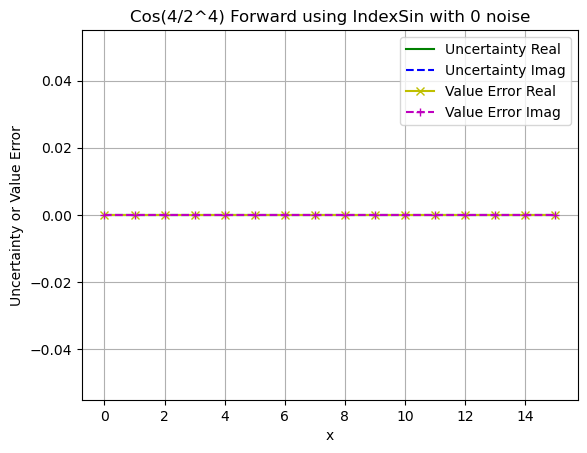

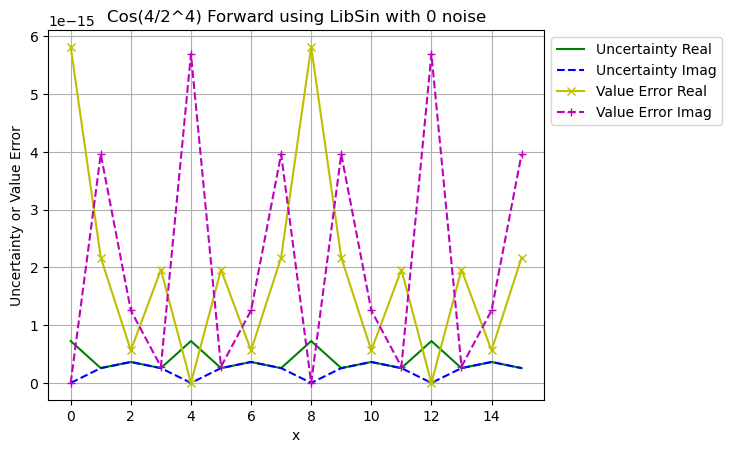

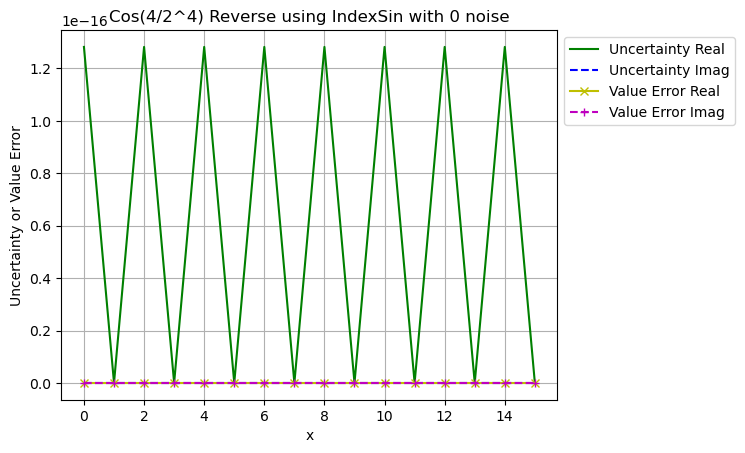

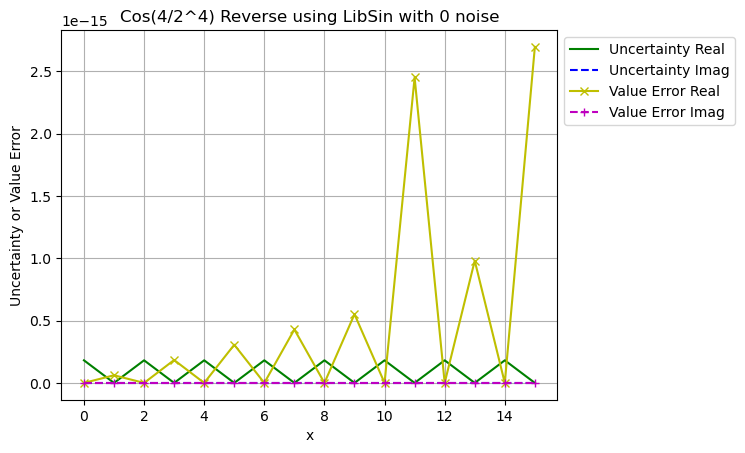

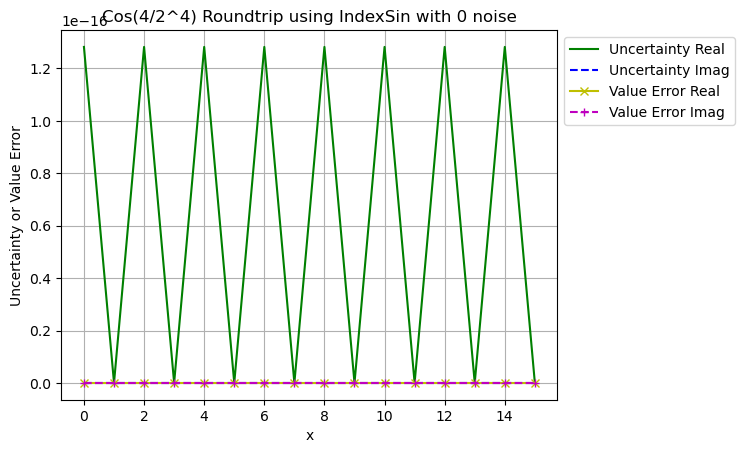

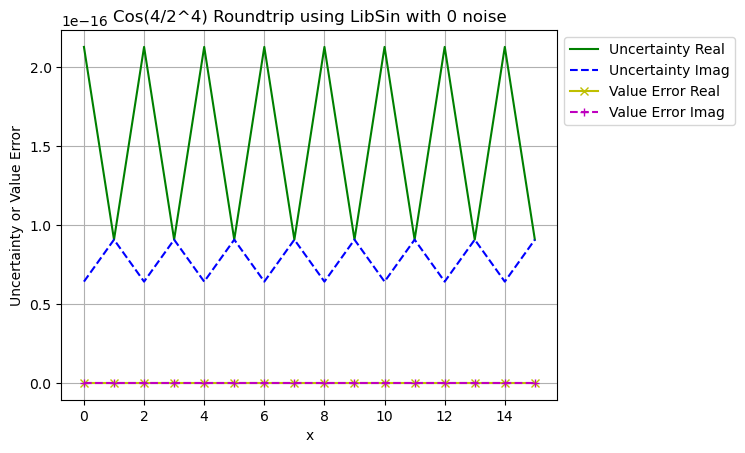

In [485]:
order = 4
freq = 4
signal = 'Cos'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

# Linear

In [486]:
PrintNormalizedErrorStat(signal='Linear', order=4, freq=0)

Forward, IndexSin, 1 mean=0.0, std=1.9229329996221478
Forward, IndexSin, 0 mean=0.0, std=0.0
Forward, LibSin, 1 mean=2.5442440081379485, std=7.094172600335486
Forward, LibSin, 0 mean=0.28576549224165776, std=1.156814669050431
Reverse, IndexSin, 1 mean=0.0, std=0.0
Reverse, IndexSin, 0 mean=0.0, std=0.0
Reverse, LibSin, 1 mean=0.02737875974961107, std=5.960608857568524
Reverse, LibSin, 0 mean=0.5787811515270379, std=2.5709257443988514
Roundtrip, IndexSin, 1 mean=0.0, std=0.44207144944339605
Roundtrip, IndexSin, 0 mean=0.20168188680330212, std=1.069949561802144
Roundtrip, LibSin, 1 mean=-0.001137707740502987, std=0.3612460432592155
Roundtrip, LibSin, 0 mean=0.06325209165040757, std=0.6590541840006633


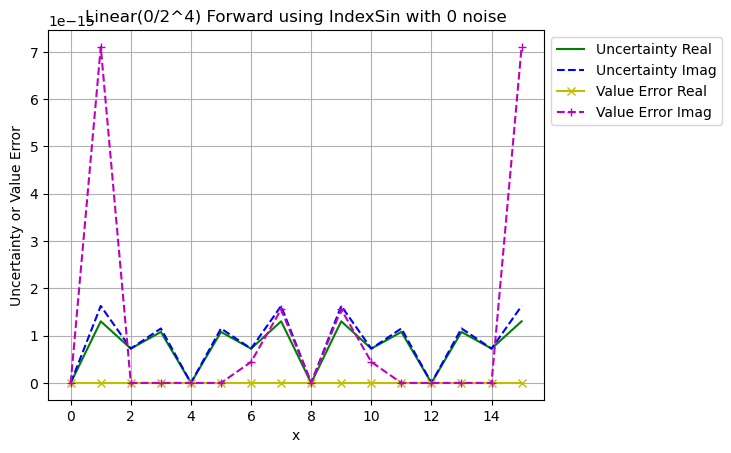

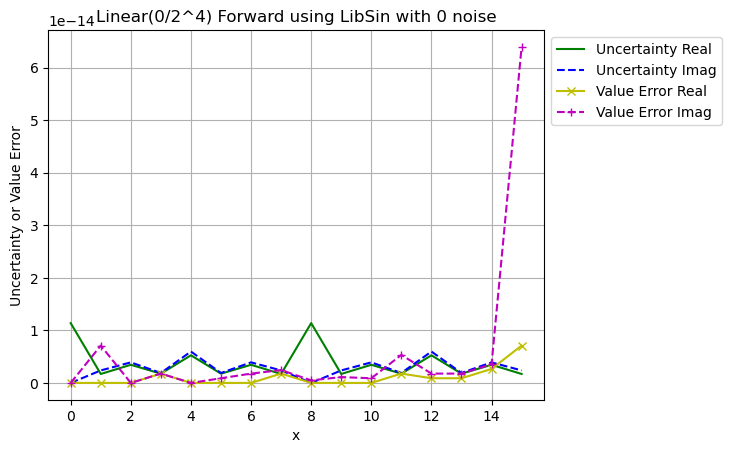

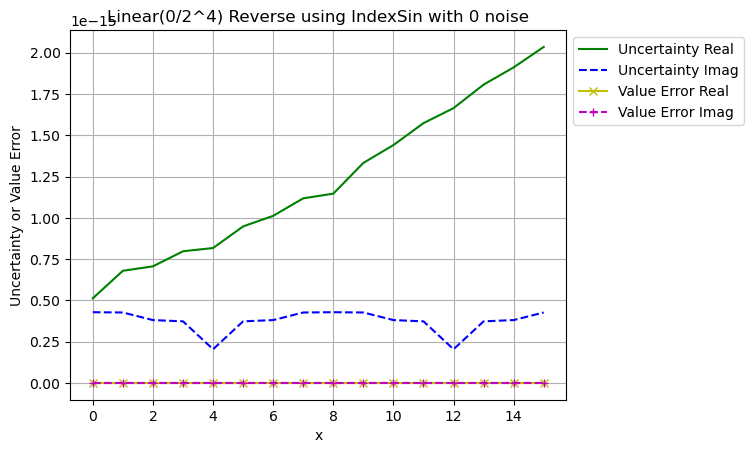

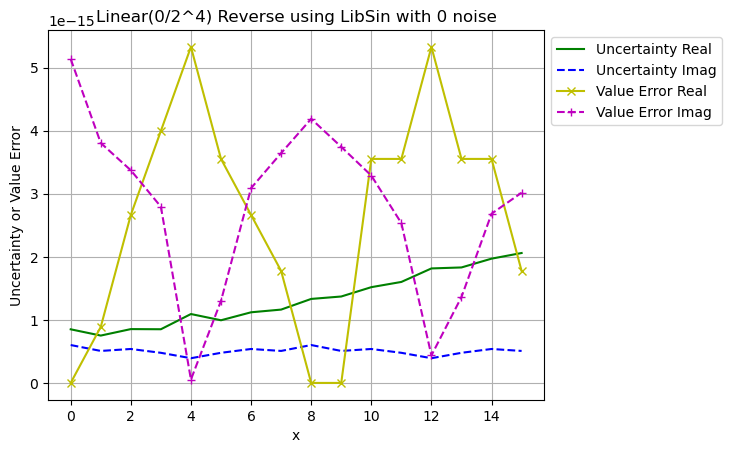

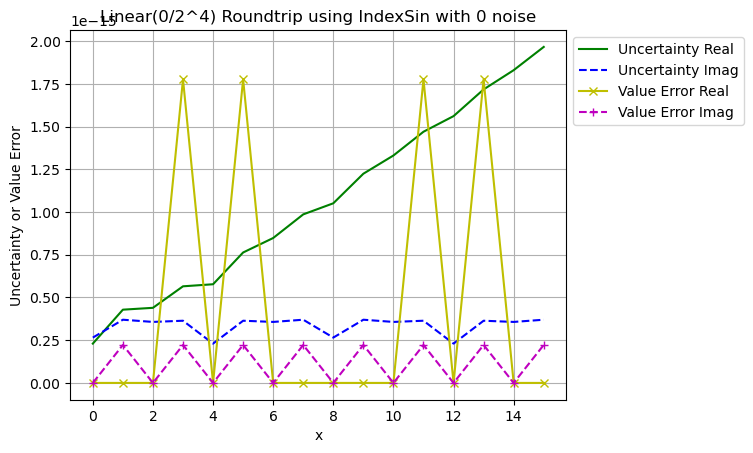

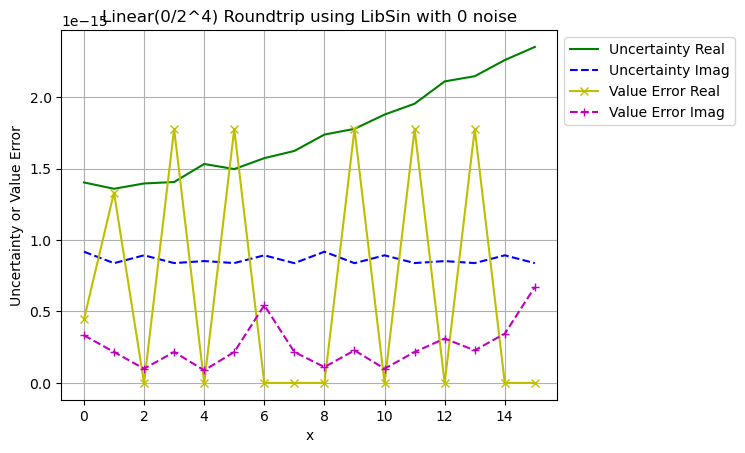

In [487]:
order = 4
freq = 0
signal = 'Linear'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [488]:
PrintNormalizedErrorStat(signal='Linear', order=5, freq=0)

Forward, IndexSin, 1 mean=-6.344131569286608e-17, std=2.6229440712611565
Forward, IndexSin, 0 mean=3.96508223080413e-18, std=0.47061107663589397
Forward, LibSin, 1 mean=2.4918101714381913, std=8.142822627834553
Forward, LibSin, 0 mean=0.2173795983130753, std=2.1604071878853786
Reverse, IndexSin, 1 mean=8.673617379884035e-18, std=0.49330377199680314
Reverse, IndexSin, 0 mean=-0.2586709091526348, std=0.46401679149869013
Reverse, LibSin, 1 mean=0.1647549126841461, std=7.969228291917245
Reverse, LibSin, 0 mean=0.9135796850522637, std=3.5798952866675315
Roundtrip, IndexSin, 1 mean=0.0006194498224944521, std=0.7128787156950561
Roundtrip, IndexSin, 0 mean=0.28579373645336165, std=1.159927882879272
Roundtrip, LibSin, 1 mean=-3.9586433692950784e-05, std=0.8999188093939648
Roundtrip, LibSin, 0 mean=0.14763265329490247, std=0.5812011520441027


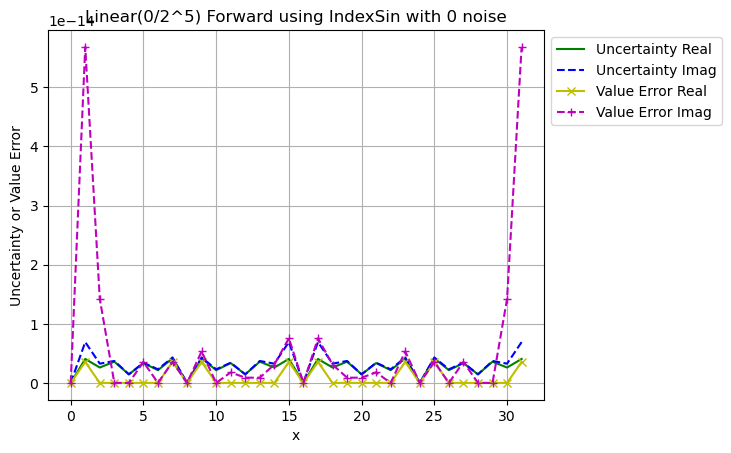

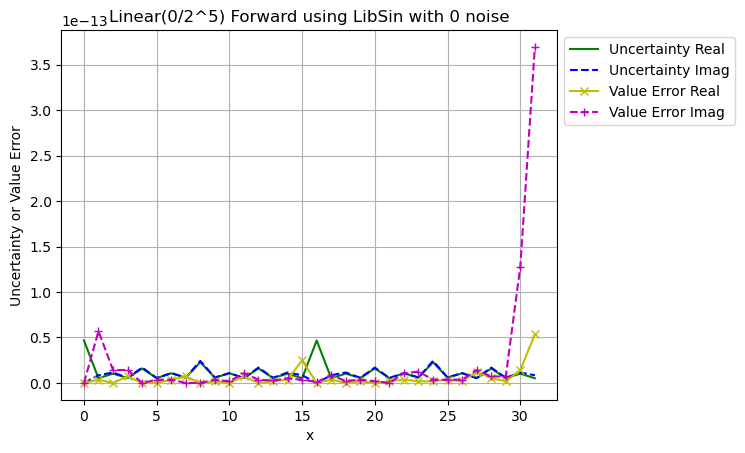

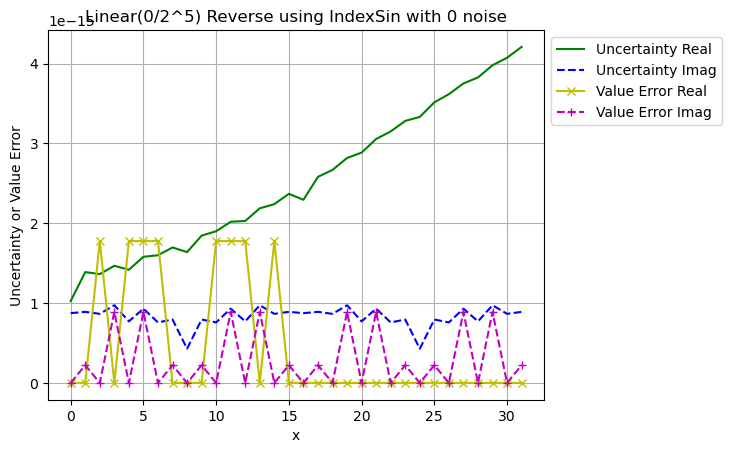

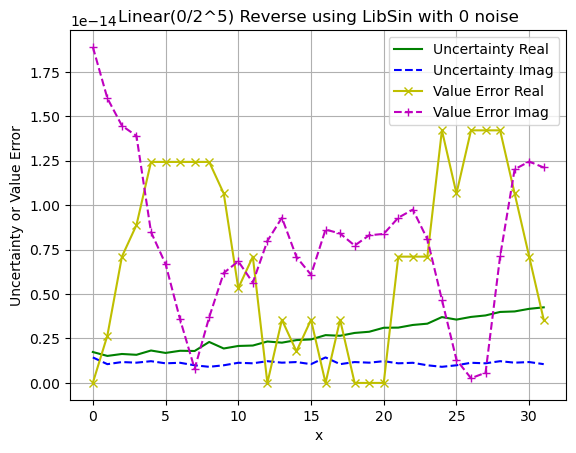

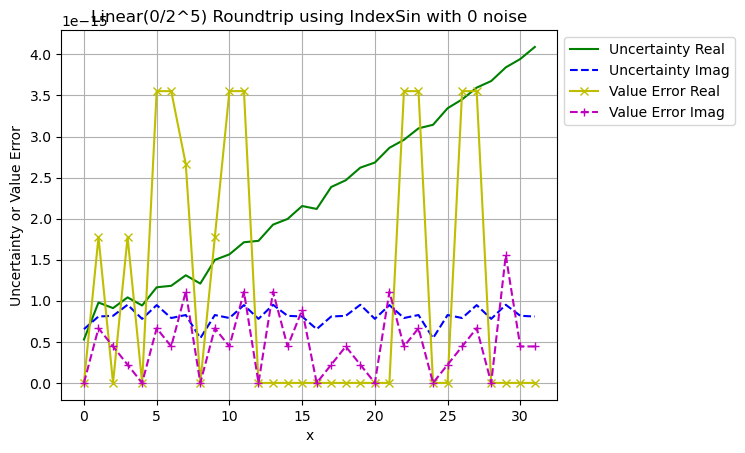

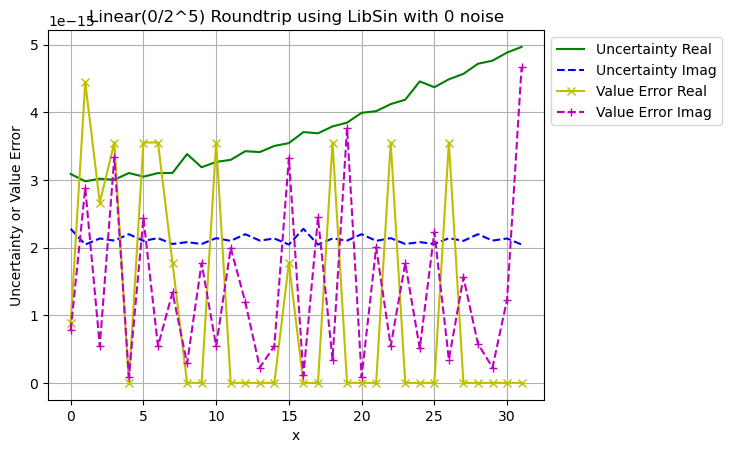

In [489]:
order = 5
freq = 0
signal = 'Linear'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)

In [490]:
PrintNormalizedErrorStat(signal='Linear', order=6, freq=0)

Forward, IndexSin, 1 mean=-7.401486830834377e-18, std=2.022928127429389
Forward, IndexSin, 0 mean=0.010989897361704633, std=0.689840916272113
Forward, LibSin, 1 mean=0.5820465897657, std=4.467554401255243
Forward, LibSin, 0 mean=0.18635570924822586, std=2.710016931175803
Reverse, IndexSin, 1 mean=-0.004526565341093358, std=0.5498734553683826
Reverse, IndexSin, 0 mean=-0.10181343198994625, std=0.4607892559471837
Reverse, LibSin, 1 mean=0.1164600405454988, std=5.481733609720009
Reverse, LibSin, 0 mean=-0.15566065068725257, std=2.513934051443466
Roundtrip, IndexSin, 1 mean=0.0009153854485893539, std=0.7361697370985835
Roundtrip, IndexSin, 0 mean=0.1310038364888872, std=0.9786746872128047
Roundtrip, LibSin, 1 mean=-4.698158831493993e-06, std=0.8175563936970361
Roundtrip, LibSin, 0 mean=0.0975161028763407, std=0.45698527523311455


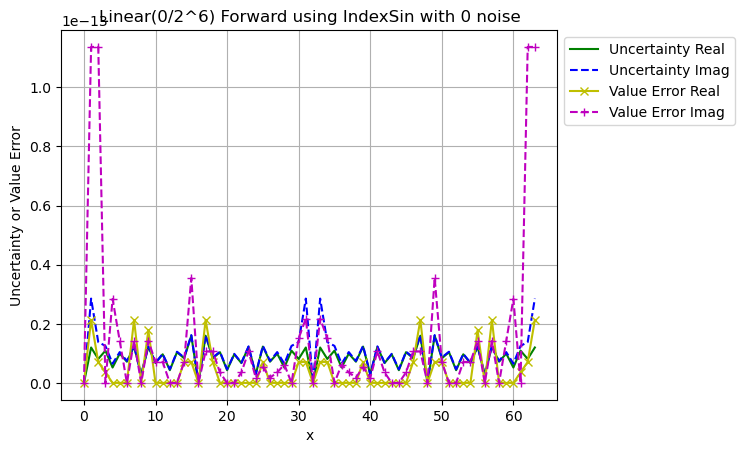

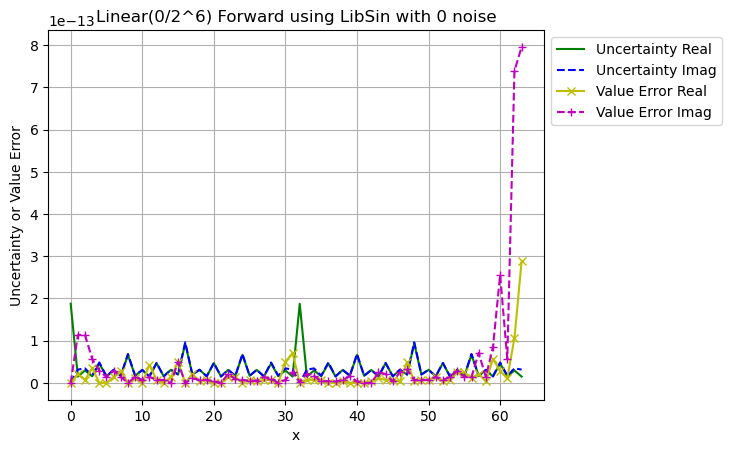

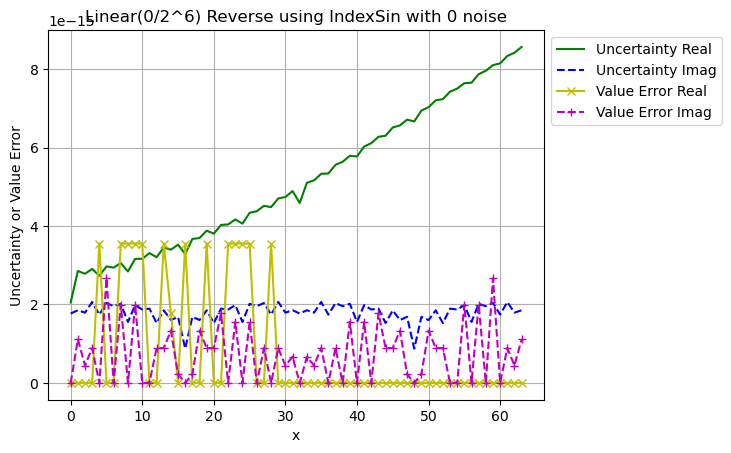

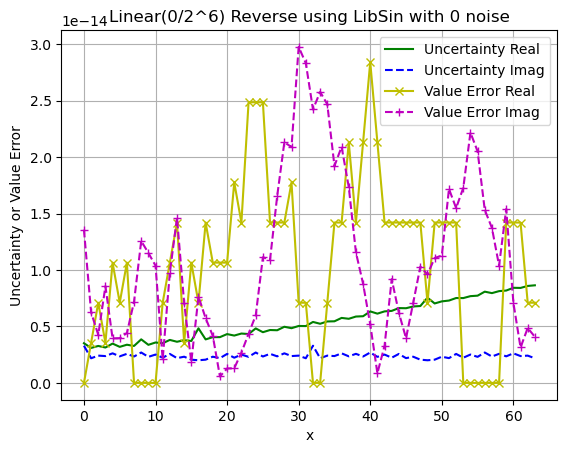

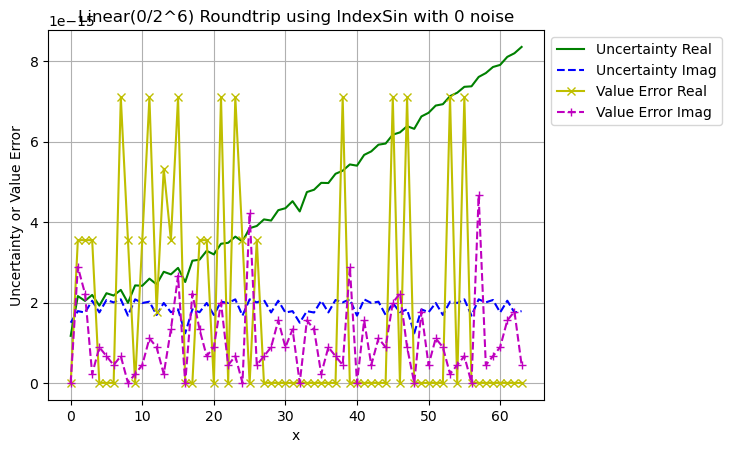

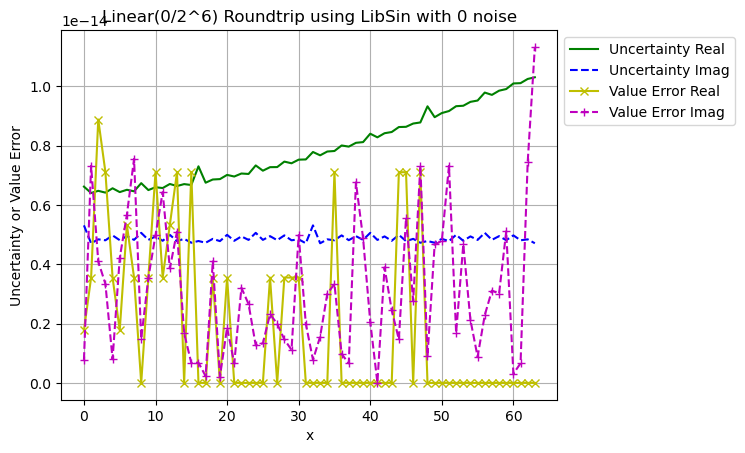

In [491]:
order = 6
freq = 0
signal = 'Linear'
for test in ('Forward', 'Reverse', 'Roundtrip'):
    for sinSource in ('IndexSin', 'LibSin'):
        PlotSpectra(sinSource, order, signal, freq, test)